# FMA Genre Classification

In [ ]:
LOAD_MP3 = True
PREPROCESSING = False

# Libraries & utils

In [ ]:
!pip install librosa
!pip install pyts sktime==0.30.0
!pip install git+https://github.com/gon-uri/detach_rocket

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
  Cloning https://github.com/gon-uri/detach_rocket to /tmp/pip-req-build-_8hi_qyw
  Running command git clone --filter=blob:none --quiet https://github.com/gon-uri/detach_rocket /tmp/pip-req-build-_8hi_qyw
  Resolved https://github.com/gon-uri/detach_rocket to commit 0d8fcde9f5ef2b8ed3353462e4f642c14ed39b00
  Preparing metadata (setup.py) ... done


In [2]:
# from google.colab import drive
from datetime import datetime
import os
import logging

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
from IPython.display import Audio, display
import pandas as pd

from detach_rocket.detach_classes import DetachEnsemble
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler, PowerTransformer, MinMaxScaler

pd.set_option('display.max_columns', None)

In [ ]:
# drive.mount('/content/drive')

In [ ]:
# change to False if you dont want to persist the experiments output on drive
LOG_EXPERIMENTS = True

In [ ]:
if LOG_EXPERIMENTS:
  now = datetime.now()
  formatted_time = now.strftime('%Y-%m-%d%H:%M:%S')

  folder_path = './' # folder location
  if not os.path.exists(folder_path):
      os.makedirs(folder_path)

  log_file_path = f'{folder_path}/log_{formatted_time}.txt'

  logging.basicConfig(filename=log_file_path, level=logging.INFO, format='%(asctime)s %(message)s', force=True)

In [ ]:
def log(to_log):
  """Save it to google drive and display it on the console

  Args:
    value: The value to log.
  """
  out = to_log
  if not isinstance(out, str):
    try:
      out = str(to_log)
    except Exception as e:
      try:
        out = to_log.to_string()
      except Exception as e:
        print(f"Error in log: {e}")

  if LOG_EXPERIMENTS:
    logging.info(out)
  print(out)

# Load dataset

In [ ]:
log("Loading dataset")

Loading dataset


In [ ]:
# copy dataset
# !cp -r /content/drive/MyDrive/fma_small .

In [ ]:
# copy metadata
# !cp -r /content/drive/MyDrive/fma_metadata .

# Analysis

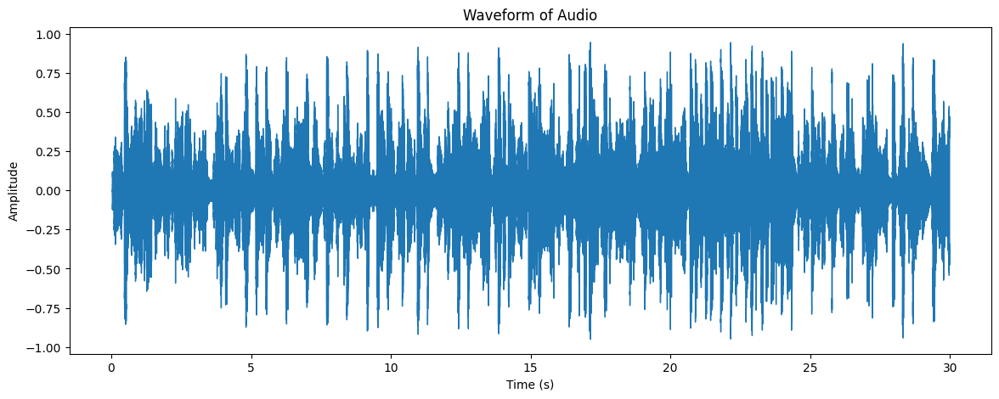

In [ ]:
# prompt: load FMA dataset and show an audio sample

# Path to the audio file (replace with an actual path from the dataset)
if LOAD_MP3:
    audio_file = 'fma_small/000/000002.mp3'

    # Load the audio file
    try:
        y, sr = librosa.load(audio_file)
        # Display the waveform
        plt.figure(figsize=(14, 5))
        librosa.display.waveshow(y, sr=sr)
        plt.title('Waveform of Audio')
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.show()
    except FileNotFoundError:
        print(f"Error: Audio file not found at {audio_file}. Please check the file path.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

    try:
        # Load the audio file using librosa
        y, sr = librosa.load(audio_file)

        # Play the audio clip
        display(ipd.Audio(audio_file))

    except FileNotFoundError:
        print(f"Error: Audio file not found at {audio_file}. Please check the file path.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

In [ ]:
# Load the tracks metadata
if LOAD_MP3:
    tracks_df = pd.read_csv('fma_metadata/tracks.csv', index_col=0, header=[0, 1])
    tracks_df.head()

In [ ]:
def get_genre_from_metadata(audio_file):
  try:
      # Extract track ID from the file path
      track_id = int(audio_file.split('/')[-1].split('.')[0])

      # Get the genre from the tracks dataframe
      genre = tracks_df.loc[track_id, ('track', 'genre_top')]

      return genre

  except FileNotFoundError:
      print(f"Error: Audio file not found at {audio_file}. Please check the file path.")
      return None
  except KeyError:
      print(f"Error: Track ID {track_id} not found in the metadata.")
      return None
  except Exception as e:
      print(f"An unexpected error occurred: {e}")
      return None

# Path to the audio file
if LOAD_MP3:
    audio_file = 'fma_small/000/000002.mp3'
    print(f"The genre of the audio file is: {get_genre_from_metadata(audio_file)}")

The genre of the audio file is: Hip-Hop


# Preprocessing

In [ ]:
if LOAD_MP3:
    mp3_files = []
    for r, d, f in os.walk('fma_small'):
        for file in f:
            if '.mp3' in file:
                mp3_files.append(os.path.join(r, file))
    mp3_files[:5]

    files, genres = [], []
    for file in mp3_files:
        genre = get_genre_from_metadata(file)
        if genre is not None:
            files.append(file)
            genres.append(genre)

    df = pd.DataFrame({'file': files, 'genre': genres})
    df.head()

    class_weights = df['genre'].value_counts(normalize=True)
    class_weights

### Extract features

In [ ]:
import warnings

def get_mfcc_from_audio(y, sr, n_mfcc=13, n_fft=2048, hop_length=512):
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
    return mfcc

def get_chromas_from_audio(y, sr, n_chroma=12, n_fft=2048, hop_length=512):
    chroma = librosa.feature.chroma_stft(y=y, sr=sr, n_chroma=n_chroma, n_fft=n_fft, hop_length=hop_length)
    return chroma

def get_tempo_from_audio(y, sr):
    onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=512)
    tempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr, hop_length=512, aggregate=None)
    return tempo

    # tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
    # return tempo[0]

def get_spectral_from_audio(y, sr, n_fft=2048, hop_length=512):
    spectral = librosa.feature.spectral_centroid(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length)
    return spectral

def get_stft_from_audio(y, sr, n_fft=2048, hop_length=512):
    stft = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    return stft

def get_melspectrogram_from_audio(y, sr, n_mels=128, n_fft=2048, hop_length=512):
    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels, n_fft=n_fft, hop_length=hop_length)
    return mel_spectrogram

# features que podem ser implementadas:
# - crest_factor for each segment of the audio
# - tempo for each segment of the audio
# - log FFT

def extract_audio_features(file_path, n_mfcc=13, n_chroma=12, n_fft=2048, hop_length=512):
    try:
        with warnings.catch_warnings():
            warnings.simplefilter('ignore')
            y, sr = librosa.load(file_path)
    except Exception as e:
        return None

    # mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
    # chroma = librosa.feature.chroma_stft(y=y, sr=sr, n_chroma=n_chroma, n_fft=n_fft, hop_length=hop_length)
    # tempo = get_tempo_from_audio(y, sr)
    # spectral = librosa.feature.spectral_centroid(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length)
    stft = get_stft_from_audio(y, sr, n_fft=20, hop_length=hop_length)
    mel_spectrogram = get_melspectrogram_from_audio(y, sr, n_fft=12, hop_length=hop_length)

    return {
        # 'mfcc': mfcc,
        # 'chroma': chroma,
        # 'tempo': tempo,
        # 'spectral': spectral,
        'stft': stft,
        'mel_spectrogram': mel_spectrogram,
        # 'raw': y,
        # 'sr': sr,
    }


In [ ]:
import gc

# for each df, extract features and save to disk
# for i, df in enumerate(dfs):
#     features = df['file'].apply(extract_audio_features)
#     df = df[features.notnull()]
#     df = pd.concat([df, features.apply(pd.Series)], axis=1)
#     df.to_pickle(f'features_{i}.pkl')

#     del df
#     del features
#     gc.collect()
#     print(f"Saved features_{i}.pkl")

### Execute and save or load preprocessing features

---



In [ ]:
if PREPROCESSING:
  print(f"Number of files: {len(df)}")

  # filter out files that could not be read
  features = df['file'].apply(extract_audio_features)
  df = df[features.notnull()]
  df = pd.concat([df, features.apply(pd.Series)], axis=1)
  df = df.dropna()
  display(df.head())

  df.to_pickle('features.pkl')
else:
  df = pd.read_pickle('features_stft.pkl')

print(f"Number of files: {len(df)}")

Number of files: 7994


In [ ]:
features = ['mfcc', 'chroma', 'spectral', 'tempo', 'stft', 'mel_spectrogram']
# features = ['tempo', 'stft', 'mel_spectrogram']

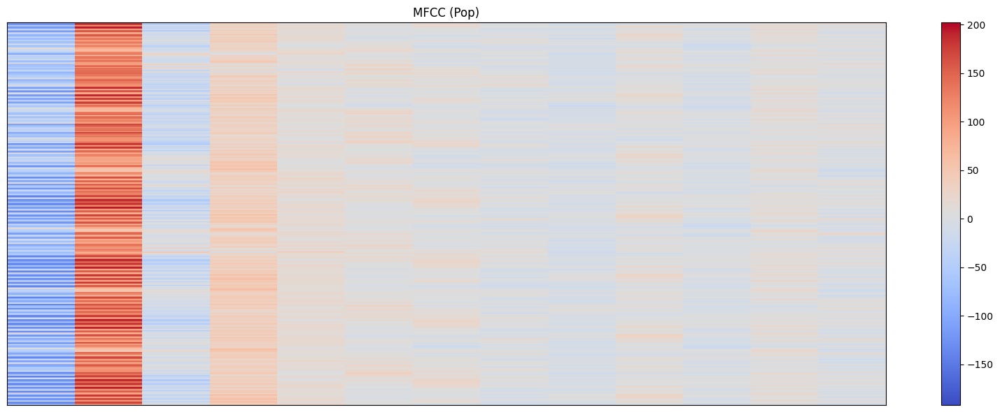

In [ ]:
def plot(x, y, title='MFCC'):
    plt.figure(figsize=(16, 6))
    librosa.display.specshow(np.transpose(x))
    plt.colorbar()
    plt.title(f'{title} ({y})')
    plt.tight_layout()
    plt.show()


plot(df.loc[0, 'mfcc'], df.loc[0, 'genre'])

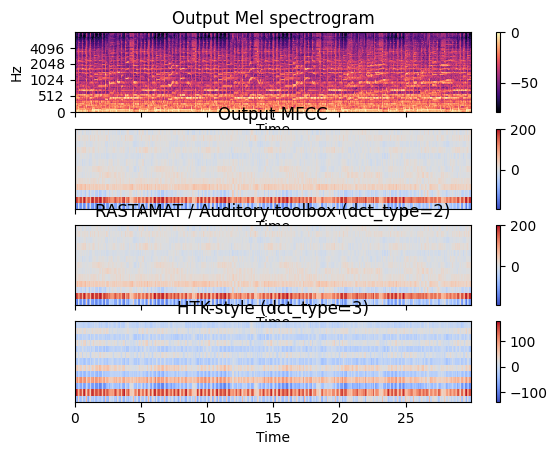

In [ ]:
# plotting Mel spectrogram, MFCC, and MFCC with different DCT types
y, sr = librosa.load(df.loc[0, 'file'])
mfcc_data_output = df.loc[0, 'mfcc']
mfcc_data_2 = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13, dct_type=2)
mfcc_data_3 = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13, dct_type=3)

fig, ax = plt.subplots(nrows=4, sharex=True, sharey=False)

S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
img0 = librosa.display.specshow(
    librosa.power_to_db(S, ref=np.max),
    x_axis='time', y_axis='mel',
    fmax=8000, ax=ax[0])
ax[0].set(title='Output Mel spectrogram')
fig.colorbar(img0, ax=[ax[0]])

img1 = librosa.display.specshow(mfcc_data_output, x_axis='time', ax=ax[1])
ax[1].set(title='Output MFCC')
fig.colorbar(img1, ax=[ax[1]])

img2 = librosa.display.specshow(mfcc_data_2, x_axis='time', ax=ax[2])
ax[2].set(title='RASTAMAT / Auditory toolbox (dct_type=2)')
fig.colorbar(img2, ax=[ax[2]])

img3 = librosa.display.specshow(mfcc_data_3, x_axis='time', ax=ax[3])
ax[3].set(title='HTK-style (dct_type=3)')
fig.colorbar(img3, ax=[ax[3]])




### Normalize data

<font color='red'>FALTOU NORMALIZAR</font>

In [ ]:
# get the minimum, mean, and maximum number of frames for the MFCC features
print('min: {}, mean: {}, max: {}'.format(
    np.min([row[1]['raw'].shape[0] for row in df.iterrows()], axis=0),
    np.mean([row[1]['raw'].shape[0] for row in df.iterrows()], axis=0),
    np.max([row[1]['raw'].shape[0] for row in df.iterrows()], axis=0))
)

min: 660719, mean: 661239.3851638729, max: 661560


In [ ]:
df.loc[0, 'tempo'].shape

(1291,)

In [ ]:
def pad_to_length(array, target_length):
    if array.shape[1] < target_length:
        padding = np.zeros((array.shape[0], target_length - array.shape[1]))
        return np.hstack((array, padding))
    elif array.shape[1] > target_length:
        return array[:, :target_length]
    return array


# Uniformizar os tamanhos
target_length = 1291
df.loc[:, 'mfcc'] = df.loc[:, 'mfcc'].apply(lambda x: pad_to_length(x, target_length))
df.loc[:, 'chroma'] = df.loc[:, 'chroma'].apply(lambda x: pad_to_length(x, target_length))
df.loc[:, 'spectral'] = df.loc[:, 'spectral'].apply(lambda x: pad_to_length(x, target_length))
df['tempo'] = df['tempo'].apply(lambda x: np.expand_dims(x, axis=0))
df.loc[:, 'tempo'] = df.loc[:, 'tempo'].apply(lambda x: pad_to_length(x, target_length))
df.loc[:, 'stft'] = df.loc[:, 'stft'].apply(lambda x: pad_to_length(x, target_length))
df.loc[:, 'mel_spectrogram'] = df.loc[:, 'mel_spectrogram'].apply(lambda x: pad_to_length(x, target_length))

# target_length = 660719
df.loc[:, 'raw'] = df.loc[:, 'raw'].apply(lambda x: x[:target_length])


tratamento das variáveis categóricas

In [ ]:
# encode the labels
df.loc[:, 'label'] = pd.factorize(df.loc[:, 'genre'])[0]
df.head()

# poderia utilizar one hot encoding para testar

,file,genre,stft,mel_spectrogram,tempo,raw,sr,mfcc,chroma,spectral,label
0,fma_small/085/085307.mp3,Pop,"[[(-1.1321026e-08+0j), (-1.4330074+0j), (-0.56...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[103.359375, 103.359375, 103.359375, 103.3593...","[1.8626451e-08, -1.4901161e-08, -7.450581e-09,...",22050.0,"[[-192.0356, -61.047848, -49.082176, -94.46171...","[[0.3841703, 0.27430397, 0.19097127, 0.1519071...","[[2164.647434110339, 2199.1062298978145, 2035....",0
1,fma_small/085/085693.mp3,Folk,"[[(-9.460304e-10+0j), (0.018103391+0j), (-0.06...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[112.34714673913044, 112.34714673913044, 112....","[-3.4924597e-10, -3.4924597e-10, -4.656613e-10...",22050.0,"[[-701.6097, -650.00586, -635.14, -637.0859, -...","[[0.07997219, 0.041726675, 0.028973354, 0.0196...","[[644.4825528695698, 653.2163681038545, 687.10...",1
2,fma_small/085/085955.mp3,Pop,"[[(1.9106406e-07+0j), (-0.19794172+0j), (0.803...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[151.99908088235293, 151.99908088235293, 151....","[4.4703484e-08, 0.0, 5.2154064e-08, 4.4703484e...",22050.0,"[[-159.73904, -16.943474, 16.979443, 15.539996...","[[0.6048041, 0.6809558, 0.37200332, 0.1853438,...","[[2385.2741724575158, 2359.890202847655, 2434....",0
3,fma_small/085/085309.mp3,Pop,"[[(-1.6847419e-07+0j), (1.0057302+0j), (1.2586...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[112.34714673913044, 112.34714673913044, 112....","[-2.2351742e-08, -7.4505806e-08, 1.4901161e-08...",22050.0,"[[-262.023, -114.72182, -74.01615, -72.7423, -...","[[0.46312836, 0.34726351, 0.3871513, 0.4066304...","[[965.293490569072, 1037.8339999043692, 1274.6...",0
4,fma_small/085/085952.mp3,Pop,"[[(-1.3260032e-07+0j), (1.3327404+0j), (4.0108...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[151.99908088235293, 151.99908088235293, 151....","[-2.2351742e-08, -1.4901161e-08, 0.0, 0.0, -2....",22050.0,"[[-207.74608, -71.02241, -35.551624, -39.27612...","[[0.16305603, 0.10106622, 0.091117114, 0.10188...","[[1449.279231793745, 1448.3592853035848, 1480....",0


### Split data

In [ ]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(df, test_size=0.2, random_state=42, stratify=df['genre'])
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['genre'])

print(f'Train size: {len(train_df)} - {len(train_df)/len(df) * 100}%')
print(f'Validation size: {len(val_df)} - {len(val_df)/len(df) * 100}%')
print(f'Test size: {len(test_df)} - {len(test_df)/len(df) * 100}%')

Train size: 5116 - 63.99799849887415%
Validation size: 1279 - 15.999499624718538%
Test size: 1599 - 20.002501876407305%


In [ ]:
def normalize_df(train_df, test_df, val_df):
    train_df_norm = train_df.copy()
    test_df_norm = test_df.copy()
    val_df_norm = val_df.copy()

    scaler_mfcc = StandardScaler()
    scaler_minmax_mfcc = MinMaxScaler()
    train_df_norm['mfcc'] = train_df_norm['mfcc'].apply(lambda x: scaler_mfcc.fit_transform(x))
    train_df_norm['mfcc'] = train_df_norm['mfcc'].apply(lambda x: scaler_minmax_mfcc.fit_transform(x))


    test_df_norm['mfcc'] = test_df_norm['mfcc'].apply(lambda x: scaler_mfcc.transform(x))
    test_df_norm['mfcc'] = test_df_norm['mfcc'].apply(lambda x: scaler_minmax_mfcc.transform(x))


    val_df_norm['mfcc'] = val_df_norm['mfcc'].apply(lambda x: scaler_mfcc.transform(x))
    val_df_norm['mfcc'] = val_df_norm['mfcc'].apply(lambda x: scaler_minmax_mfcc.transform(x))


    scaler_spectral = StandardScaler()
    scaler_minmax_spectral = MinMaxScaler()
    train_df_norm['spectral'] = train_df_norm['spectral'].apply(lambda x: scaler_spectral.fit_transform(x.reshape(-1, 1)).flatten().reshape(1, -1))
    train_df_norm['spectral'] = train_df_norm['spectral'].apply(lambda x: scaler_minmax_spectral.fit_transform(x.reshape(-1, 1)).flatten().reshape(1, -1))

    test_df_norm['spectral'] = test_df_norm['spectral'].apply(lambda x: scaler_spectral.transform(x.reshape(-1, 1)).flatten().reshape(1, -1))
    test_df_norm['spectral'] = test_df_norm['spectral'].apply(lambda x: scaler_minmax_spectral.transform(x.reshape(-1, 1)).flatten().reshape(1, -1))


    val_df_norm['spectral'] = val_df_norm['spectral'].apply(lambda x: scaler_spectral.transform(x.reshape(-1, 1)).flatten().reshape(1, -1))
    val_df_norm['spectral'] = val_df_norm['spectral'].apply(lambda x: scaler_minmax_spectral.transform(x.reshape(-1, 1)).flatten().reshape(1, -1))

    scaler_tempo = StandardScaler()
    scaler_minmax_tempo = MinMaxScaler()
    train_df_norm['tempo'] = train_df_norm['tempo'].apply(lambda x: scaler_tempo.fit_transform(x))
    train_df_norm['tempo'] = train_df_norm['tempo'].apply(lambda x: scaler_minmax_tempo.fit_transform(x))

    test_df_norm['tempo'] = test_df_norm['tempo'].apply(lambda x: scaler_tempo.transform(x))
    test_df_norm['tempo'] = test_df_norm['tempo'].apply(lambda x: scaler_minmax_tempo.transform(x))

    val_df_norm['tempo'] = val_df_norm['tempo'].apply(lambda x: scaler_tempo.transform(x))
    val_df_norm['tempo'] = val_df_norm['tempo'].apply(lambda x: scaler_minmax_tempo.transform(x))


    # normalize stft
    epsilon = 1e-8
    train_df_norm['stft'] = train_df_norm['stft'].apply(lambda x: np.abs(x) / (np.max(np.abs(x)) + epsilon))
    stft_max = train_df_norm['stft'].apply(lambda x: np.max(np.abs(x))).max()

    val_df_norm['stft'] = val_df_norm['stft'].apply(lambda x: np.abs(x) / stft_max)
    test_df_norm['stft'] = test_df_norm['stft'].apply(lambda x: np.abs(x) / stft_max)

    scaler_mel_spectrogram = StandardScaler()
    scaler_minmax_mel_spectrogram = MinMaxScaler()
    train_df_norm['mel_spectrogram'] = train_df_norm['mel_spectrogram'].apply(lambda x: scaler_mel_spectrogram.fit_transform(x))
    train_df_norm['mel_spectrogram'] = train_df_norm['mel_spectrogram'].apply(lambda x: scaler_minmax_mel_spectrogram.fit_transform(x))

    test_df_norm['mel_spectrogram'] = test_df_norm['mel_spectrogram'].apply(lambda x: scaler_mel_spectrogram.transform(x))
    test_df_norm['mel_spectrogram'] = test_df_norm['mel_spectrogram'].apply(lambda x: scaler_minmax_mel_spectrogram.transform(x))

    val_df_norm['mel_spectrogram'] = val_df_norm['mel_spectrogram'].apply(lambda x: scaler_mel_spectrogram.transform(x))
    val_df_norm['mel_spectrogram'] = val_df_norm['mel_spectrogram'].apply(lambda x: scaler_minmax_mel_spectrogram.transform(x))

    return train_df_norm, test_df_norm, val_df_norm

# Implementation

In [ ]:
import os
import torch
import torch.optim as optim
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

ImportError: libcudnn.so.9: cannot open shared object file: No such file or directory

In [ ]:
from torch.utils.data import Dataset, DataLoader

# Custom Dataset para carregar as features
class FeatureDataset(Dataset):
    def __init__(self, df, features_col, transform=None):
        self.annotations = df
        self.transform = transform
        self.features_col = features_col

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        features = self.annotations.iloc[idx][self.features_col]
        features = torch.tensor(features, dtype=torch.float32)

        genre = self.annotations.iloc[idx]['label']
        label = torch.tensor(genre, dtype=torch.float32)

        if self.transform:
            features = self.transform(features)

        return features, label


In [ ]:
def get_data_loader(train_df, val_df, test_df, features_col, batch_size=32, norm=False):
    if norm:
        train_df, test_df, val_df = normalize_df(train_df, test_df, val_df)

    # prepare the data loaders for pytorch
    train_dataset = FeatureDataset(df=train_df, features_col=features_col)
    val_dataset = FeatureDataset(df=val_df, features_col=features_col)
    test_dataset = FeatureDataset(df=test_df, features_col=features_col)

    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

    return train_loader, val_loader, test_loader

## CNN

3 CNNs + FC + output

https://github.com/zwang-datascience/CRNN-TF/blob/master/1.ipynb

In [ ]:
features_dim = {
    'mfcc': 13,
    'chroma': 12,
    'spectral': 1,
    'raw': 1291,
    'tempo': 1,
    'stft': 1025,
    'mel_spectrogram': 128,
}

cnn_to_layers = {
    'mfcc': [24, 32, 64],
    'chroma': [24, 32, 64],
    'spectral': [16, 32, 64],
    'tempo': [4, 8, 16],
    'stft': [512, 256, 128],
    'mel_spectrogram': [128, 64, 32],
}

cnn_report = {}

In [ ]:
# CNN de Classificação
class CNN_Classifier(nn.Module):
    def __init__(self, n_dim, to_layers, num_classes=8):
        super(CNN_Classifier, self).__init__()

        # Encoder (extrator de features)
        self.encoder = nn.Sequential(
            nn.Conv1d(n_dim, to_layers[0], kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=4, stride=4),

            nn.Conv1d(to_layers[0], to_layers[1], kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=4, stride=4),

            nn.Conv1d(to_layers[1], to_layers[2], kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=4, stride=4)
        )

        # Camada fully connected para classificação
        self.fc = nn.Sequential(
            nn.Linear(to_layers[2] *  (1291 // (4 * 4 * 4)), 100),
            # nn.Linear(128 * 3 * 20, 100),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(100, num_classes)
        )

    def forward(self, x):
        x = self.encoder(x)
        x_flattened = x.view(x.size(0), -1)  # Achatar antes de passar pela camada fully connected
        out = self.fc(x_flattened)

        return out

In [ ]:
from sklearn.metrics import accuracy_score
from tqdm import tqdm

def train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=10):
    model.train()
    patience = 10
    best_val_loss = float('inf')

    best_val_loss = float('inf')
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for X, y in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            # X, y = X.unsqueeze(2).to(device), y.to(device)
            X, y = X.to(device), y.to(device).long()

            optimizer.zero_grad()

            outputs = model(X)
            loss = criterion(outputs, y)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Validação
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for X, y in val_loader:
                X, y = X.to(device), y.to(device).long()

                outputs = model(X)
                loss = criterion(outputs, y)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        print(f"Validation Loss: {avg_val_loss:.4f}")

        # Salvar o melhor modelo baseado na perda de validação
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience = 10
            torch.save(model.state_dict(), 'best_model.pth')
            print(f"Model saved with validation loss: {best_val_loss:.4f}")
        else:
            patience -= 1
            if patience == 0:
                break


In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Função para avaliar o modelo e gerar o classification report
def evaluate_model(model, test_loader, device):
    model.eval()  # Colocar o modelo em modo de avaliação
    y_pred = []
    y_true = []

    with torch.no_grad():
        for X, y in test_loader:
            X, y = X.to(device), y.to(device)
            outputs = model(X)
            preds = torch.argmax(outputs, dim=1)

            y_pred.extend(preds.cpu().numpy())
            y_true.extend(y.cpu().numpy())

    # Gerar o classification report
    print(classification_report(y_true, y_pred, target_names=test_df['genre'].unique(), output_dict=False))
    report = classification_report(y_true, y_pred, target_names=test_df['genre'].unique(), output_dict=True)

    # Display confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=test_df['label'].unique())
    cmd = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=test_df['genre'].unique())
    fig, ax = plt.subplots(figsize=(15,10))
    display(cmd.plot(ax=ax))

    return report

### For features: MFCC, Chroma, Spectral Centroid

In [ ]:
features = ['mfcc', 'chroma', 'spectral', 'tempo', 'stft', 'mel_spectrogram']

In [ ]:
num_classes = len(df['genre'].unique())
criterion = nn.CrossEntropyLoss()

# for each feature, train a model and evaluate it
for norm in [False, True]:
    for feature in features:
        print(f"-"*50)
        norm_text = "normalized" if norm else "original"
        print(f"Training model for feature: {feature}_{norm_text}")
        model = CNN_Classifier(n_dim=features_dim[feature], to_layers=cnn_to_layers[feature], num_classes=num_classes).to(device)
        optimizer = optim.Adam(model.parameters(), lr=0.0001)

        train_loader, val_loader, test_loader = get_data_loader(train_df, val_df, test_df, feature, norm=norm)

        train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=50)
        model.load_state_dict(torch.load('best_model.pth'))

        # Avaliar o modelo
        cnn_report[f'{feature}_{norm}'] = evaluate_model(model, test_loader, device)

--------------------------------------------------
Training model for feature: mfcc_original


Epoch 1/50: 100%|██████████| 160/160 [00:01<00:00, 105.96it/s]


Validation Loss: 1.8544
Model saved with validation loss: 1.8544


Epoch 2/50: 100%|██████████| 160/160 [00:01<00:00, 105.92it/s]


Validation Loss: 1.7505
Model saved with validation loss: 1.7505


Epoch 3/50: 100%|██████████| 160/160 [00:01<00:00, 126.04it/s]


Validation Loss: 1.7035
Model saved with validation loss: 1.7035


Epoch 4/50:   2%|▎         | 4/160 [00:00<00:01, 78.96it/s]


KeyboardInterrupt: 

### For all features

In [ ]:
from torch.utils.data import Dataset, DataLoader

# Custom Dataset para carregar as features
class FeaturesDataset(Dataset):
    def __init__(self, df, transform=None):
        self.annotations = df
        self.transform = transform

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        mfcc = self.annotations.iloc[idx]['mfcc']
        mfcc = torch.tensor(mfcc, dtype=torch.float32)

        chroma = self.annotations.iloc[idx]['chroma']
        chroma = torch.tensor(chroma, dtype=torch.float32)

        spectral = self.annotations.iloc[idx]['spectral']
        spectral = torch.tensor(spectral, dtype=torch.float32)

        tempo = self.annotations.iloc[idx]['tempo']
        tempo = torch.tensor(tempo, dtype=torch.float32)

        stft = self.annotations.iloc[idx]['stft']
        stft = torch.tensor(stft, dtype=torch.float32)

        mel_spectrogram = self.annotations.iloc[idx]['mel_spectrogram']
        mel_spectrogram = torch.tensor(mel_spectrogram, dtype=torch.float32)

        genre = self.annotations.iloc[idx]['label']
        label = torch.tensor(genre, dtype=torch.float32)

        # if self.transform:
        #     features = self.transform(features)

        return mfcc, chroma, spectral, tempo, stft, mel_spectrogram, label


def get_data_loader_features(train_df, val_df, test_df, norm, batch_size=32):
    if norm:
        train_df, test_df, val_df = normalize_df(train_df, test_df, val_df)

    # prepare the data loaders for pytorch
    train_dataset = FeaturesDataset(df=train_df)
    val_dataset = FeaturesDataset(df=val_df)
    test_dataset = FeaturesDataset(df=test_df)

    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

    return train_loader, val_loader, test_loader


In [ ]:
import torch
import torch.nn as nn

class FeatureBranch(nn.Module):
    def __init__(self, n_dim, to_layers, num_classes=8):
        super(FeatureBranch, self).__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(n_dim, to_layers[0], kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(to_layers[0]),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=4, stride=4),

            nn.Conv1d(to_layers[0], to_layers[1], kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=4, stride=4)
        )
        self.flatten = nn.Flatten()

        self.fc = nn.Sequential(
            nn.Linear(to_layers[1] *  (1291 // (4 * 4)), 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.ReLU()
        )

    def forward(self, x):
        x = self.flatten(self.cnn(x))
        return self.fc(x)


# Combine branches into a unified model
class MusicGenreClassifier(nn.Module):
    def __init__(self):
        super(MusicGenreClassifier, self).__init__()
        self.mfcc_branch = FeatureBranch(n_dim=13, to_layers=[32, 64])
        self.chroma_branch = FeatureBranch(n_dim=12, to_layers=[32, 64])
        self.spectral_branch = FeatureBranch(n_dim=1, to_layers=[32, 64])
        self.tempo_branch = FeatureBranch(n_dim=1, to_layers=[8, 16])
        self.stft_branch = FeatureBranch(n_dim=1025, to_layers=[256, 128])
        self.mel_spectrogram_branch = FeatureBranch(n_dim=128, to_layers=[64, 32])

        # Fully connected layers for combined features
        self.fc = nn.Sequential(
            nn.Linear(64 * 6, 128),  # Combine outputs from all branches
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 8)  # 8 music genres
        )

    def forward(self, mfcc, chroma, spectral, tempo, stft, mel_spectrogram):
        mfcc_out = self.mfcc_branch(mfcc)
        chroma_out = self.chroma_branch(chroma)
        spectral_out = self.spectral_branch(spectral)
        tempo_out = self.tempo_branch(tempo)
        stft_out = self.stft_branch(stft)
        mel_spectrogram_out = self.mel_spectrogram_branch(mel_spectrogram)
        combined = torch.cat([mfcc_out, chroma_out, spectral_out, tempo_out, stft_out, mel_spectrogram_out], dim=1)
        return self.fc(combined)


In [ ]:
from sklearn.metrics import accuracy_score
from tqdm import tqdm

def train_model_features(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=10):
    model.train()
    patience = 10

    best_val_loss = float('inf')
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for mfcc, chroma, spectral, tempo, stft, mel_spectrogram,  y in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            mfcc, chroma, spectral, tempo, stft, mel_spectrogram, y = mfcc.to(device), chroma.to(device), spectral.to(device), tempo.to(device), stft.to(device), mel_spectrogram.to(device), y.to(device).long()

            optimizer.zero_grad()

            outputs = model(mfcc, chroma, spectral, tempo, stft, mel_spectrogram)
            loss = criterion(outputs, y)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        # Validação
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for mfcc, chroma, spectral, tempo, stft, mel_spectrogram, y in val_loader:
                mfcc, chroma, spectral, tempo, stft, mel_spectrogram, y = mfcc.to(device), chroma.to(device), spectral.to(device), tempo.to(device), stft.to(device), mel_spectrogram.to(device), y.to(device).long()

                outputs = model(mfcc, chroma, spectral, tempo, stft, mel_spectrogram)
                loss = criterion(outputs, y)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        print(f"Validation Loss: {avg_val_loss:.4f}")

        # Salvar o melhor modelo baseado na perda de validação
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience = 10
            torch.save(model.state_dict(), 'best_model.pth')
            print(f"Model saved with validation loss: {best_val_loss:.4f}")
        else:
            patience -= 1
            if patience == 0:
                break

# Função para avaliar o modelo e gerar o classification report
def evaluate_model_features(model, test_loader, device):
    model.eval()  # Colocar o modelo em modo de avaliação
    y_pred = []
    y_true = []

    with torch.no_grad():
        for mfcc, chroma, spectral, tempo, stft, mel_spectrogram, y in test_loader:
            mfcc, chroma, spectral, tempo, stft, mel_spectrogram, y = mfcc.to(device), chroma.to(device), spectral.to(device), tempo.to(device), stft.to(device), mel_spectrogram.to(device), y.to(device).long()
            outputs = model(mfcc, chroma, spectral, tempo, stft, mel_spectrogram)
            preds = torch.argmax(outputs, dim=1)

            y_pred.extend(preds.cpu().numpy())
            y_true.extend(y.cpu().numpy())

    # Gerar o classification report
    print(classification_report(y_true, y_pred, target_names=test_df['genre'].unique(), output_dict=False))
    report = classification_report(y_true, y_pred, target_names=test_df['genre'].unique(), output_dict=True)

    # Display confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=test_df['label'].unique())
    cmd = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=test_df['genre'].unique())
    fig, ax = plt.subplots(figsize=(15,10))
    display(cmd.plot(ax=ax))

    return report

--------------------------------------------------
Training model for all features_original


Epoch 1/50:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch 1/50: 100%|██████████| 160/160 [00:18<00:00,  8.49it/s]


Validation Loss: 1.7889
Model saved with validation loss: 1.7889


Epoch 2/50: 100%|██████████| 160/160 [00:16<00:00,  9.62it/s]


Validation Loss: 1.6773
Model saved with validation loss: 1.6773


Epoch 3/50: 100%|██████████| 160/160 [00:16<00:00,  9.67it/s]


Validation Loss: 1.5988
Model saved with validation loss: 1.5988


Epoch 4/50: 100%|██████████| 160/160 [00:15<00:00, 10.41it/s]


Validation Loss: 1.5737
Model saved with validation loss: 1.5737


Epoch 5/50: 100%|██████████| 160/160 [00:15<00:00, 10.62it/s]


Validation Loss: 1.5492
Model saved with validation loss: 1.5492


Epoch 6/50: 100%|██████████| 160/160 [00:15<00:00, 10.43it/s]


Validation Loss: 1.5128
Model saved with validation loss: 1.5128


Epoch 7/50: 100%|██████████| 160/160 [00:15<00:00, 10.41it/s]


Validation Loss: 1.4877
Model saved with validation loss: 1.4877


Epoch 8/50: 100%|██████████| 160/160 [00:15<00:00, 10.37it/s]


Validation Loss: 1.4760
Model saved with validation loss: 1.4760


Epoch 9/50: 100%|██████████| 160/160 [00:15<00:00, 10.42it/s]


Validation Loss: 1.4574
Model saved with validation loss: 1.4574


Epoch 10/50: 100%|██████████| 160/160 [00:14<00:00, 11.08it/s]


Validation Loss: 1.4499
Model saved with validation loss: 1.4499


Epoch 11/50: 100%|██████████| 160/160 [00:14<00:00, 10.74it/s]


Validation Loss: 1.4605


Epoch 12/50: 100%|██████████| 160/160 [00:15<00:00, 10.33it/s]


Validation Loss: 1.4639


Epoch 13/50: 100%|██████████| 160/160 [00:15<00:00, 10.36it/s]


Validation Loss: 1.5000


Epoch 14/50: 100%|██████████| 160/160 [00:15<00:00, 10.39it/s]


Validation Loss: 1.5312


Epoch 15/50: 100%|██████████| 160/160 [00:15<00:00, 10.39it/s]


Validation Loss: 1.5880


Epoch 16/50: 100%|██████████| 160/160 [00:15<00:00, 10.51it/s]


Validation Loss: 1.6783


Epoch 17/50: 100%|██████████| 160/160 [00:15<00:00, 10.43it/s]


Validation Loss: 1.7446


Epoch 18/50: 100%|██████████| 160/160 [00:15<00:00, 10.44it/s]


Validation Loss: 1.8941


Epoch 19/50: 100%|██████████| 160/160 [00:14<00:00, 11.02it/s]


Validation Loss: 1.8990


Epoch 20/50: 100%|██████████| 160/160 [00:15<00:00, 10.36it/s]


Validation Loss: 1.9770


/tmp/ipykernel_25480/98820097.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.29      0.16      0.21       200
   Electronic       0.49      0.66      0.56       200
         Folk       0.51      0.37      0.43       200
      Hip-Hop       0.50      0.26      0.34       200
         Rock       0.60      0.68      0.64       200
          Pop       0.52      0.58      0.55       200
 Instrumental       0.53      0.63      0.57       199
International       0.41      0.58      0.48       200

     accuracy                           0.49      1599
    macro avg       0.48      0.49      0.47      1599
 weighted avg       0.48      0.49      0.47      1599



--------------------------------------------------
Training model for all features_normalized


Epoch 1/50: 100%|██████████| 160/160 [00:17<00:00,  9.30it/s]


Validation Loss: 149.5447
Model saved with validation loss: 149.5447


Epoch 2/50: 100%|██████████| 160/160 [00:16<00:00,  9.57it/s]


Validation Loss: 139.2010
Model saved with validation loss: 139.2010


Epoch 3/50: 100%|██████████| 160/160 [00:16<00:00,  9.78it/s]


Validation Loss: 106.4647
Model saved with validation loss: 106.4647


Epoch 4/50: 100%|██████████| 160/160 [00:16<00:00,  9.68it/s]


Validation Loss: 148.0341


Epoch 5/50: 100%|██████████| 160/160 [00:15<00:00, 10.12it/s]


Validation Loss: 172.5691


Epoch 6/50: 100%|██████████| 160/160 [00:15<00:00, 10.11it/s]


Validation Loss: 172.2091


Epoch 7/50: 100%|██████████| 160/160 [00:14<00:00, 10.82it/s]


Validation Loss: 204.3130


Epoch 8/50: 100%|██████████| 160/160 [00:15<00:00, 10.43it/s]


Validation Loss: 253.2281


Epoch 9/50: 100%|██████████| 160/160 [00:15<00:00, 10.48it/s]


Validation Loss: 238.6789


Epoch 10/50: 100%|██████████| 160/160 [00:15<00:00, 10.66it/s]


Validation Loss: 218.9995


Epoch 11/50: 100%|██████████| 160/160 [00:15<00:00, 10.24it/s]


Validation Loss: 240.7240


Epoch 12/50: 100%|██████████| 160/160 [00:15<00:00, 10.58it/s]


Validation Loss: 265.4242


Epoch 13/50: 100%|██████████| 160/160 [00:14<00:00, 10.78it/s]


Validation Loss: 360.2161


/tmp/ipykernel_25480/98820097.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.20      0.13      0.16       200
   Electronic       0.00      0.00      0.00       200
         Folk       0.43      0.51      0.46       200
      Hip-Hop       0.00      0.00      0.00       200
         Rock       0.38      0.76      0.51       200
          Pop       0.19      0.80      0.31       200
 Instrumental       0.00      0.00      0.00       199
International       0.00      0.00      0.00       200

     accuracy                           0.27      1599
    macro avg       0.15      0.27      0.18      1599
 weighted avg       0.15      0.27      0.18      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

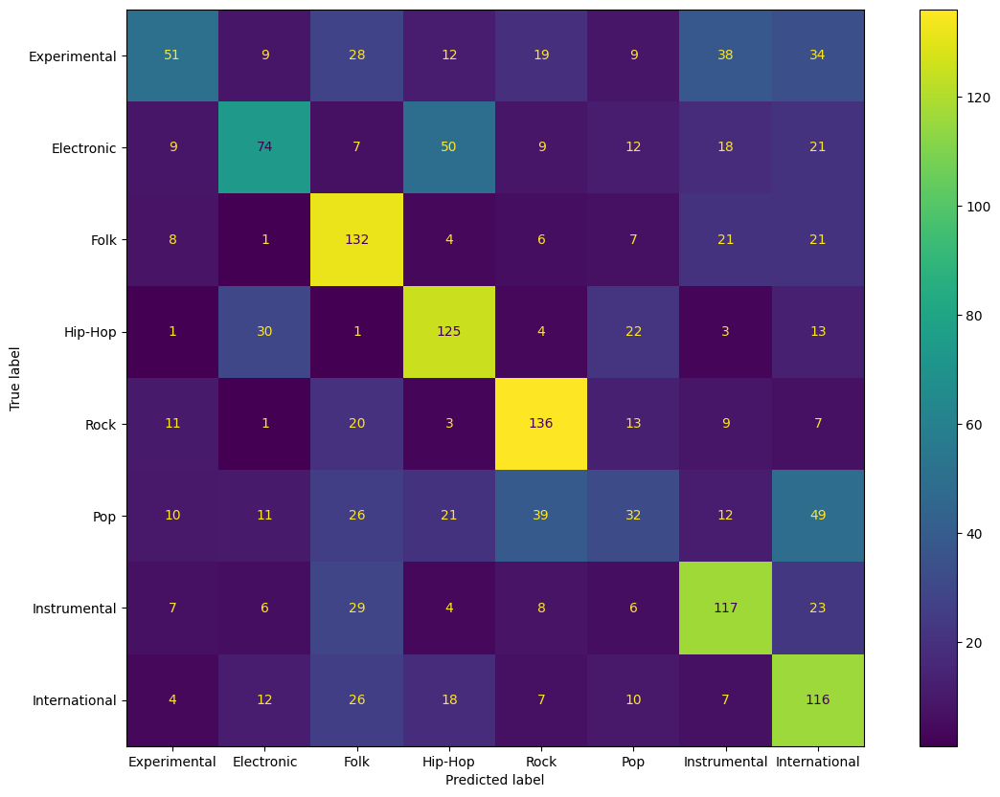

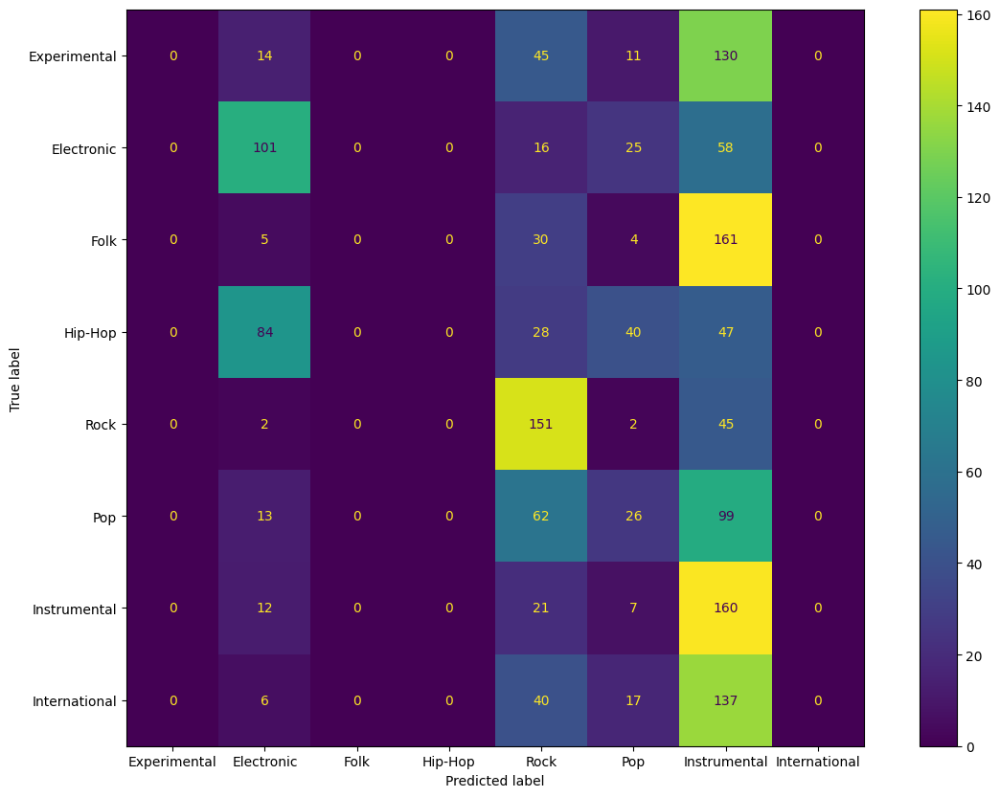

In [ ]:
num_classes = len(df['genre'].unique())
criterion = nn.CrossEntropyLoss()

for norm in [False, True]:
    print(f"-"*50)
    norm_text = "normalized" if norm else "original"
    print(f"Training model for all features_{norm_text}")

    model = MusicGenreClassifier().to(device)
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    train_loader, val_loader, test_loader = get_data_loader_features(train_df, val_df, test_df, norm=norm)

    train_model_features(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=50)
    model.load_state_dict(torch.load('best_model.pth'))

    cnn_report[f'all_{norm_text}'] = evaluate_model_features(model, test_loader, device)

In [ ]:
# save cnn_report
cnn_report_df = pd.DataFrame(cnn_report)
cnn_report_df.to_pickle('cnn_report.pkl')

## CRNN-TF

https://github.com/zwang-datascience/CRNN-TF/blob/master/1.ipynb

In [ ]:
crnn_report = {}

In [ ]:
# CNN de Classificação
class CNN_GRU_Classifier(nn.Module):
    def __init__(self, n_dim, to_layers, num_classes=8):
        super(CNN_GRU_Classifier, self).__init__()

        # Encoder (extrator de features)
        self.encoder = nn.Sequential(
            nn.Conv1d(n_dim, to_layers[0], kernel_size=3, stride=1, padding=1),  # (batch, 64, 1291)
            nn.BatchNorm1d(to_layers[0]),
            nn.ELU(),
            nn.MaxPool1d(kernel_size=4, stride=4),  # (batch, 64, 322)

            nn.Conv1d(to_layers[0], to_layers[1], kernel_size=3, stride=1, padding=1),  # (batch, 128, 322)
            nn.BatchNorm1d(to_layers[1]),
            nn.ELU(),
            nn.MaxPool1d(kernel_size=4, stride=4),  # (batch, 128, 80)

            nn.Conv1d(to_layers[1], to_layers[2], kernel_size=3, stride=1, padding=1),  # (batch, 128, 80)
            nn.BatchNorm1d(to_layers[2]),
            nn.ELU(),
            nn.MaxPool1d(kernel_size=4, stride=4)  # (batch, 128, 20)
        )

        self.gru = nn.GRU(input_size=to_layers[2], hidden_size=8, num_layers=16, batch_first=True, bidirectional=True)

        # Camada fully connected para classificação
        self.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(8 * 2, 64),  # Bidirectional GRU output (32*2)
            nn.ELU(),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = x.permute(0, 2, 1) # Rearranja para (batch_size, final_length, 128)

        gru_out, _ = self.gru(x)  # Saída: (batch_size, final_length, hidden_size * 2)
        gru_out = gru_out[:, -1, :]  # Considera apenas a última saída (batch_size, hidden_size * 2)

        # Classificação
        out = self.fc(gru_out)  # (batch_size, num_classes)
        return out

### For features: MFCC, Chroma, Spectral Centroid

--------------------------------------------------
Training model for feature: mfcc_original


Epoch 1/50:   1%|          | 1/160 [00:00<00:16,  9.69it/s]

Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 27.74it/s]


Validation Loss: 2.0820
Model saved with validation loss: 2.0820


Epoch 2/50: 100%|██████████| 160/160 [00:05<00:00, 28.42it/s]


Validation Loss: 2.0525
Model saved with validation loss: 2.0525


Epoch 3/50: 100%|██████████| 160/160 [00:05<00:00, 28.16it/s]


Validation Loss: 1.9612
Model saved with validation loss: 1.9612


Epoch 4/50: 100%|██████████| 160/160 [00:05<00:00, 28.33it/s]


Validation Loss: 1.9174
Model saved with validation loss: 1.9174


Epoch 5/50: 100%|██████████| 160/160 [00:05<00:00, 28.02it/s]


Validation Loss: 1.8996
Model saved with validation loss: 1.8996


Epoch 6/50: 100%|██████████| 160/160 [00:05<00:00, 28.12it/s]


Validation Loss: 1.8945
Model saved with validation loss: 1.8945


Epoch 7/50: 100%|██████████| 160/160 [00:05<00:00, 28.13it/s]


Validation Loss: 1.8815
Model saved with validation loss: 1.8815


Epoch 8/50: 100%|██████████| 160/160 [00:05<00:00, 28.27it/s]


Validation Loss: 1.8697
Model saved with validation loss: 1.8697


Epoch 9/50: 100%|██████████| 160/160 [00:05<00:00, 28.06it/s]


Validation Loss: 1.8547
Model saved with validation loss: 1.8547


Epoch 10/50: 100%|██████████| 160/160 [00:05<00:00, 28.33it/s]


Validation Loss: 1.8451
Model saved with validation loss: 1.8451


Epoch 11/50: 100%|██████████| 160/160 [00:05<00:00, 28.11it/s]


Validation Loss: 1.8323
Model saved with validation loss: 1.8323


Epoch 12/50: 100%|██████████| 160/160 [00:05<00:00, 28.17it/s]


Validation Loss: 1.8215
Model saved with validation loss: 1.8215


Epoch 13/50: 100%|██████████| 160/160 [00:05<00:00, 28.30it/s]


Validation Loss: 1.8237


Epoch 14/50: 100%|██████████| 160/160 [00:05<00:00, 28.92it/s]


Validation Loss: 1.8099
Model saved with validation loss: 1.8099


Epoch 15/50: 100%|██████████| 160/160 [00:05<00:00, 28.30it/s]


Validation Loss: 1.8133


Epoch 16/50: 100%|██████████| 160/160 [00:05<00:00, 29.25it/s]


Validation Loss: 1.8015
Model saved with validation loss: 1.8015


Epoch 17/50: 100%|██████████| 160/160 [00:05<00:00, 28.11it/s]


Validation Loss: 1.7991
Model saved with validation loss: 1.7991


Epoch 18/50: 100%|██████████| 160/160 [00:05<00:00, 28.70it/s]


Validation Loss: 1.8015


Epoch 19/50: 100%|██████████| 160/160 [00:05<00:00, 29.22it/s]


Validation Loss: 1.8026


Epoch 20/50: 100%|██████████| 160/160 [00:05<00:00, 29.07it/s]


Validation Loss: 1.7980
Model saved with validation loss: 1.7980


Epoch 21/50: 100%|██████████| 160/160 [00:05<00:00, 28.26it/s]


Validation Loss: 1.7987


Epoch 22/50: 100%|██████████| 160/160 [00:05<00:00, 29.01it/s]


Validation Loss: 1.7946
Model saved with validation loss: 1.7946


Epoch 23/50: 100%|██████████| 160/160 [00:05<00:00, 28.57it/s]


Validation Loss: 1.7834
Model saved with validation loss: 1.7834


Epoch 24/50: 100%|██████████| 160/160 [00:05<00:00, 27.88it/s]


Validation Loss: 1.7849


Epoch 25/50: 100%|██████████| 160/160 [00:05<00:00, 28.84it/s]


Validation Loss: 1.8032


Epoch 26/50: 100%|██████████| 160/160 [00:05<00:00, 28.67it/s]


Validation Loss: 1.7857


Epoch 27/50: 100%|██████████| 160/160 [00:05<00:00, 28.75it/s]


Validation Loss: 1.7826
Model saved with validation loss: 1.7826


Epoch 28/50: 100%|██████████| 160/160 [00:05<00:00, 28.29it/s]


Validation Loss: 1.7761
Model saved with validation loss: 1.7761


Epoch 29/50: 100%|██████████| 160/160 [00:05<00:00, 27.93it/s]


Validation Loss: 1.7743
Model saved with validation loss: 1.7743


Epoch 30/50: 100%|██████████| 160/160 [00:05<00:00, 28.43it/s]


Validation Loss: 1.7803


Epoch 31/50: 100%|██████████| 160/160 [00:05<00:00, 29.73it/s]


Validation Loss: 1.7908


Epoch 32/50: 100%|██████████| 160/160 [00:05<00:00, 29.41it/s]


Validation Loss: 1.7825


Epoch 33/50: 100%|██████████| 160/160 [00:05<00:00, 29.32it/s]


Validation Loss: 1.7775


Epoch 34/50: 100%|██████████| 160/160 [00:05<00:00, 29.10it/s]


Validation Loss: 1.7777


Epoch 35/50: 100%|██████████| 160/160 [00:05<00:00, 28.98it/s]


Validation Loss: 1.7868


Epoch 36/50: 100%|██████████| 160/160 [00:05<00:00, 29.02it/s]


Validation Loss: 1.7755


Epoch 37/50: 100%|██████████| 160/160 [00:05<00:00, 29.13it/s]


Validation Loss: 1.7711
Model saved with validation loss: 1.7711


Epoch 38/50: 100%|██████████| 160/160 [00:05<00:00, 28.42it/s]


Validation Loss: 1.7876


Epoch 39/50: 100%|██████████| 160/160 [00:05<00:00, 28.69it/s]


Validation Loss: 1.7969


Epoch 40/50: 100%|██████████| 160/160 [00:05<00:00, 28.73it/s]


Validation Loss: 1.7629
Model saved with validation loss: 1.7629


Epoch 41/50: 100%|██████████| 160/160 [00:05<00:00, 28.00it/s]


Validation Loss: 1.7747


Epoch 42/50: 100%|██████████| 160/160 [00:05<00:00, 28.70it/s]


Validation Loss: 1.7946


Epoch 43/50: 100%|██████████| 160/160 [00:05<00:00, 28.61it/s]


Validation Loss: 1.7897


Epoch 44/50: 100%|██████████| 160/160 [00:05<00:00, 28.74it/s]


Validation Loss: 1.7819


Epoch 45/50: 100%|██████████| 160/160 [00:05<00:00, 28.67it/s]


Validation Loss: 1.7656


Epoch 46/50: 100%|██████████| 160/160 [00:05<00:00, 28.61it/s]


Validation Loss: 1.7858


Epoch 47/50: 100%|██████████| 160/160 [00:05<00:00, 28.79it/s]


Validation Loss: 1.7702


Epoch 48/50: 100%|██████████| 160/160 [00:05<00:00, 28.81it/s]


Validation Loss: 1.7731


Epoch 49/50: 100%|██████████| 160/160 [00:05<00:00, 29.02it/s]


Validation Loss: 1.7700


Epoch 50/50: 100%|██████████| 160/160 [00:05<00:00, 28.57it/s]


Validation Loss: 1.7659


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.00      0.00      0.00       200
   Electronic       0.25      0.31      0.28       200
         Folk       0.39      0.26      0.31       200
      Hip-Hop       0.21      0.28      0.24       200
         Rock       0.33      0.56      0.42       200
          Pop       0.15      0.04      0.06       200
 Instrumental       0.64      0.79      0.71       199
International       0.28      0.46      0.34       200

     accuracy                           0.33      1599
    macro avg       0.28      0.33      0.29      1599
 weighted avg       0.28      0.33      0.29      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: chroma_original


Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 28.23it/s]


Validation Loss: 2.0798
Model saved with validation loss: 2.0798


Epoch 2/50: 100%|██████████| 160/160 [00:05<00:00, 28.67it/s]


Validation Loss: 2.0510
Model saved with validation loss: 2.0510


Epoch 3/50: 100%|██████████| 160/160 [00:05<00:00, 28.35it/s]


Validation Loss: 1.9855
Model saved with validation loss: 1.9855


Epoch 4/50: 100%|██████████| 160/160 [00:05<00:00, 28.63it/s]


Validation Loss: 1.9532
Model saved with validation loss: 1.9532


Epoch 5/50: 100%|██████████| 160/160 [00:05<00:00, 28.55it/s]


Validation Loss: 1.9450
Model saved with validation loss: 1.9450


Epoch 6/50: 100%|██████████| 160/160 [00:05<00:00, 28.52it/s]


Validation Loss: 1.9310
Model saved with validation loss: 1.9310


Epoch 7/50: 100%|██████████| 160/160 [00:05<00:00, 27.63it/s]


Validation Loss: 1.9233
Model saved with validation loss: 1.9233


Epoch 8/50: 100%|██████████| 160/160 [00:05<00:00, 28.65it/s]


Validation Loss: 1.9162
Model saved with validation loss: 1.9162


Epoch 9/50: 100%|██████████| 160/160 [00:05<00:00, 28.69it/s]


Validation Loss: 1.9093
Model saved with validation loss: 1.9093


Epoch 10/50: 100%|██████████| 160/160 [00:05<00:00, 28.37it/s]


Validation Loss: 1.9018
Model saved with validation loss: 1.9018


Epoch 11/50: 100%|██████████| 160/160 [00:05<00:00, 28.13it/s]


Validation Loss: 1.9002
Model saved with validation loss: 1.9002


Epoch 12/50: 100%|██████████| 160/160 [00:05<00:00, 28.49it/s]


Validation Loss: 1.8893
Model saved with validation loss: 1.8893


Epoch 13/50: 100%|██████████| 160/160 [00:05<00:00, 28.74it/s]


Validation Loss: 1.8931


Epoch 14/50: 100%|██████████| 160/160 [00:05<00:00, 29.19it/s]


Validation Loss: 1.8735
Model saved with validation loss: 1.8735


Epoch 15/50: 100%|██████████| 160/160 [00:05<00:00, 28.47it/s]


Validation Loss: 1.8672
Model saved with validation loss: 1.8672


Epoch 16/50: 100%|██████████| 160/160 [00:05<00:00, 28.86it/s]


Validation Loss: 1.8596
Model saved with validation loss: 1.8596


Epoch 17/50: 100%|██████████| 160/160 [00:05<00:00, 28.63it/s]


Validation Loss: 1.8530
Model saved with validation loss: 1.8530


Epoch 18/50: 100%|██████████| 160/160 [00:05<00:00, 28.59it/s]


Validation Loss: 1.8517
Model saved with validation loss: 1.8517


Epoch 19/50: 100%|██████████| 160/160 [00:05<00:00, 28.56it/s]


Validation Loss: 1.8473
Model saved with validation loss: 1.8473


Epoch 20/50: 100%|██████████| 160/160 [00:05<00:00, 28.38it/s]


Validation Loss: 1.8506


Epoch 21/50: 100%|██████████| 160/160 [00:05<00:00, 29.04it/s]


Validation Loss: 1.8471
Model saved with validation loss: 1.8471


Epoch 22/50: 100%|██████████| 160/160 [00:05<00:00, 28.39it/s]


Validation Loss: 1.8504


Epoch 23/50: 100%|██████████| 160/160 [00:05<00:00, 28.73it/s]


Validation Loss: 1.8488


Epoch 24/50: 100%|██████████| 160/160 [00:05<00:00, 29.07it/s]


Validation Loss: 1.8485


Epoch 25/50: 100%|██████████| 160/160 [00:05<00:00, 28.83it/s]


Validation Loss: 1.8666


Epoch 26/50: 100%|██████████| 160/160 [00:05<00:00, 28.79it/s]


Validation Loss: 1.8652


Epoch 27/50: 100%|██████████| 160/160 [00:05<00:00, 28.61it/s]


Validation Loss: 1.8773


Epoch 28/50: 100%|██████████| 160/160 [00:05<00:00, 28.95it/s]


Validation Loss: 1.8853


Epoch 29/50: 100%|██████████| 160/160 [00:05<00:00, 28.72it/s]


Validation Loss: 1.9041


Epoch 30/50: 100%|██████████| 160/160 [00:05<00:00, 28.70it/s]


Validation Loss: 1.8949


Epoch 31/50: 100%|██████████| 160/160 [00:05<00:00, 28.64it/s]


Validation Loss: 1.9045


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.14      0.17      0.15       200
   Electronic       0.31      0.66      0.42       200
         Folk       0.19      0.12      0.15       200
      Hip-Hop       0.00      0.00      0.00       200
         Rock       0.25      0.23      0.24       200
          Pop       0.17      0.19      0.18       200
 Instrumental       0.36      0.73      0.48       199
International       0.00      0.00      0.00       200

     accuracy                           0.26      1599
    macro avg       0.18      0.26      0.20      1599
 weighted avg       0.18      0.26      0.20      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: spectral_original


Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 29.31it/s]


Validation Loss: 2.0806
Model saved with validation loss: 2.0806


Epoch 2/50: 100%|██████████| 160/160 [00:05<00:00, 28.64it/s]


Validation Loss: 2.0582
Model saved with validation loss: 2.0582


Epoch 3/50: 100%|██████████| 160/160 [00:05<00:00, 28.72it/s]


Validation Loss: 2.0111
Model saved with validation loss: 2.0111


Epoch 4/50: 100%|██████████| 160/160 [00:05<00:00, 28.71it/s]


Validation Loss: 1.9707
Model saved with validation loss: 1.9707


Epoch 5/50: 100%|██████████| 160/160 [00:05<00:00, 28.59it/s]


Validation Loss: 1.9382
Model saved with validation loss: 1.9382


Epoch 6/50: 100%|██████████| 160/160 [00:05<00:00, 28.41it/s]


Validation Loss: 1.9263
Model saved with validation loss: 1.9263


Epoch 7/50: 100%|██████████| 160/160 [00:05<00:00, 29.00it/s]


Validation Loss: 1.9093
Model saved with validation loss: 1.9093


Epoch 8/50: 100%|██████████| 160/160 [00:05<00:00, 28.83it/s]


Validation Loss: 1.9129


Epoch 9/50: 100%|██████████| 160/160 [00:05<00:00, 29.78it/s]


Validation Loss: 1.8983
Model saved with validation loss: 1.8983


Epoch 10/50: 100%|██████████| 160/160 [00:05<00:00, 29.04it/s]


Validation Loss: 1.8737
Model saved with validation loss: 1.8737


Epoch 11/50: 100%|██████████| 160/160 [00:05<00:00, 28.43it/s]


Validation Loss: 1.8657
Model saved with validation loss: 1.8657


Epoch 12/50: 100%|██████████| 160/160 [00:05<00:00, 28.47it/s]


Validation Loss: 1.8549
Model saved with validation loss: 1.8549


Epoch 13/50: 100%|██████████| 160/160 [00:05<00:00, 28.65it/s]


Validation Loss: 1.8595


Epoch 14/50: 100%|██████████| 160/160 [00:05<00:00, 29.36it/s]


Validation Loss: 1.8357
Model saved with validation loss: 1.8357


Epoch 15/50: 100%|██████████| 160/160 [00:05<00:00, 28.27it/s]


Validation Loss: 1.8476


Epoch 16/50: 100%|██████████| 160/160 [00:05<00:00, 29.29it/s]


Validation Loss: 1.8296
Model saved with validation loss: 1.8296


Epoch 17/50: 100%|██████████| 160/160 [00:05<00:00, 28.72it/s]


Validation Loss: 1.8284
Model saved with validation loss: 1.8284


Epoch 18/50: 100%|██████████| 160/160 [00:05<00:00, 28.56it/s]


Validation Loss: 1.8390


Epoch 19/50: 100%|██████████| 160/160 [00:05<00:00, 29.41it/s]


Validation Loss: 1.8382


Epoch 20/50: 100%|██████████| 160/160 [00:05<00:00, 29.20it/s]


Validation Loss: 1.8246
Model saved with validation loss: 1.8246


Epoch 21/50: 100%|██████████| 160/160 [00:05<00:00, 28.47it/s]


Validation Loss: 1.8199
Model saved with validation loss: 1.8199


Epoch 22/50: 100%|██████████| 160/160 [00:05<00:00, 28.61it/s]


Validation Loss: 1.8172
Model saved with validation loss: 1.8172


Epoch 23/50: 100%|██████████| 160/160 [00:05<00:00, 28.05it/s]


Validation Loss: 1.8161
Model saved with validation loss: 1.8161


Epoch 24/50: 100%|██████████| 160/160 [00:05<00:00, 28.60it/s]


Validation Loss: 1.8123
Model saved with validation loss: 1.8123


Epoch 25/50: 100%|██████████| 160/160 [00:05<00:00, 28.36it/s]


Validation Loss: 1.8150


Epoch 26/50: 100%|██████████| 160/160 [00:05<00:00, 28.91it/s]


Validation Loss: 1.8200


Epoch 27/50: 100%|██████████| 160/160 [00:05<00:00, 29.03it/s]


Validation Loss: 1.8175


Epoch 28/50: 100%|██████████| 160/160 [00:05<00:00, 28.95it/s]


Validation Loss: 1.8198


Epoch 29/50: 100%|██████████| 160/160 [00:05<00:00, 29.46it/s]


Validation Loss: 1.8307


Epoch 30/50: 100%|██████████| 160/160 [00:05<00:00, 29.29it/s]


Validation Loss: 1.8185


Epoch 31/50: 100%|██████████| 160/160 [00:05<00:00, 29.50it/s]


Validation Loss: 1.8376


Epoch 32/50: 100%|██████████| 160/160 [00:05<00:00, 29.51it/s]


Validation Loss: 1.8464


Epoch 33/50: 100%|██████████| 160/160 [00:05<00:00, 29.69it/s]


Validation Loss: 1.8265


Epoch 34/50: 100%|██████████| 160/160 [00:05<00:00, 29.58it/s]


Validation Loss: 1.8176


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))
/home/enrique/miniconda3/envs/myenv/l

               precision    recall  f1-score   support

 Experimental       0.00      0.00      0.00       200
   Electronic       0.27      0.28      0.27       200
         Folk       0.14      0.03      0.04       200
      Hip-Hop       0.00      0.00      0.00       200
         Rock       0.27      0.69      0.39       200
          Pop       0.36      0.45      0.40       200
 Instrumental       0.39      0.82      0.52       199
International       0.22      0.18      0.20       200

     accuracy                           0.31      1599
    macro avg       0.20      0.31      0.23      1599
 weighted avg       0.20      0.31      0.23      1599



--------------------------------------------------
Training model for feature: tempo_original


Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 29.69it/s]


Validation Loss: 2.0822
Model saved with validation loss: 2.0822


Epoch 2/50: 100%|██████████| 160/160 [00:05<00:00, 28.38it/s]


Validation Loss: 2.0801
Model saved with validation loss: 2.0801


Epoch 3/50: 100%|██████████| 160/160 [00:05<00:00, 28.24it/s]


Validation Loss: 2.0786
Model saved with validation loss: 2.0786


Epoch 4/50: 100%|██████████| 160/160 [00:05<00:00, 28.48it/s]


Validation Loss: 2.0718
Model saved with validation loss: 2.0718


Epoch 5/50: 100%|██████████| 160/160 [00:05<00:00, 28.38it/s]


Validation Loss: 2.0620
Model saved with validation loss: 2.0620


Epoch 6/50: 100%|██████████| 160/160 [00:05<00:00, 28.21it/s]


Validation Loss: 2.0555
Model saved with validation loss: 2.0555


Epoch 7/50: 100%|██████████| 160/160 [00:05<00:00, 28.42it/s]


Validation Loss: 2.0515
Model saved with validation loss: 2.0515


Epoch 8/50: 100%|██████████| 160/160 [00:05<00:00, 28.69it/s]


Validation Loss: 2.0463
Model saved with validation loss: 2.0463


Epoch 9/50: 100%|██████████| 160/160 [00:05<00:00, 28.19it/s]


Validation Loss: 2.0468


Epoch 10/50: 100%|██████████| 160/160 [00:05<00:00, 29.12it/s]


Validation Loss: 2.0446
Model saved with validation loss: 2.0446


Epoch 11/50: 100%|██████████| 160/160 [00:05<00:00, 28.47it/s]


Validation Loss: 2.0416
Model saved with validation loss: 2.0416


Epoch 12/50: 100%|██████████| 160/160 [00:05<00:00, 28.42it/s]


Validation Loss: 2.0443


Epoch 13/50: 100%|██████████| 160/160 [00:05<00:00, 29.41it/s]


Validation Loss: 2.0385
Model saved with validation loss: 2.0385


Epoch 14/50: 100%|██████████| 160/160 [00:05<00:00, 28.47it/s]


Validation Loss: 2.0400


Epoch 15/50: 100%|██████████| 160/160 [00:05<00:00, 29.21it/s]


Validation Loss: 2.0386


Epoch 16/50: 100%|██████████| 160/160 [00:05<00:00, 29.16it/s]


Validation Loss: 2.0360
Model saved with validation loss: 2.0360


Epoch 17/50: 100%|██████████| 160/160 [00:05<00:00, 28.12it/s]


Validation Loss: 2.0377


Epoch 18/50: 100%|██████████| 160/160 [00:05<00:00, 29.65it/s]


Validation Loss: 2.0361


Epoch 19/50: 100%|██████████| 160/160 [00:05<00:00, 30.10it/s]


Validation Loss: 2.0361


Epoch 20/50: 100%|██████████| 160/160 [00:05<00:00, 28.75it/s]


Validation Loss: 2.0363


Epoch 21/50: 100%|██████████| 160/160 [00:05<00:00, 29.49it/s]


Validation Loss: 2.0347
Model saved with validation loss: 2.0347


Epoch 22/50: 100%|██████████| 160/160 [00:05<00:00, 28.45it/s]


Validation Loss: 2.0356


Epoch 23/50: 100%|██████████| 160/160 [00:05<00:00, 30.40it/s]


Validation Loss: 2.0345
Model saved with validation loss: 2.0345


Epoch 24/50: 100%|██████████| 160/160 [00:05<00:00, 28.38it/s]


Validation Loss: 2.0348


Epoch 25/50: 100%|██████████| 160/160 [00:05<00:00, 28.77it/s]


Validation Loss: 2.0448


Epoch 26/50: 100%|██████████| 160/160 [00:05<00:00, 29.46it/s]


Validation Loss: 2.0323
Model saved with validation loss: 2.0323


Epoch 27/50: 100%|██████████| 160/160 [00:05<00:00, 28.88it/s]


Validation Loss: 2.0324


Epoch 28/50: 100%|██████████| 160/160 [00:05<00:00, 29.46it/s]


Validation Loss: 2.0315
Model saved with validation loss: 2.0315


Epoch 29/50: 100%|██████████| 160/160 [00:05<00:00, 28.48it/s]


Validation Loss: 2.0300
Model saved with validation loss: 2.0300


Epoch 30/50: 100%|██████████| 160/160 [00:05<00:00, 28.86it/s]


Validation Loss: 2.0326


Epoch 31/50: 100%|██████████| 160/160 [00:05<00:00, 29.04it/s]


Validation Loss: 2.0288
Model saved with validation loss: 2.0288


Epoch 32/50: 100%|██████████| 160/160 [00:05<00:00, 28.23it/s]


Validation Loss: 2.0313


Epoch 33/50: 100%|██████████| 160/160 [00:05<00:00, 29.38it/s]


Validation Loss: 2.0288


Epoch 34/50: 100%|██████████| 160/160 [00:05<00:00, 29.36it/s]


Validation Loss: 2.0290


Epoch 35/50: 100%|██████████| 160/160 [00:05<00:00, 29.37it/s]


Validation Loss: 2.0288


Epoch 36/50: 100%|██████████| 160/160 [00:05<00:00, 29.69it/s]


Validation Loss: 2.0284
Model saved with validation loss: 2.0284


Epoch 37/50: 100%|██████████| 160/160 [00:05<00:00, 28.58it/s]


Validation Loss: 2.0264
Model saved with validation loss: 2.0264


Epoch 38/50: 100%|██████████| 160/160 [00:05<00:00, 28.33it/s]


Validation Loss: 2.0263
Model saved with validation loss: 2.0263


Epoch 39/50: 100%|██████████| 160/160 [00:05<00:00, 28.52it/s]


Validation Loss: 2.0277


Epoch 40/50: 100%|██████████| 160/160 [00:05<00:00, 29.80it/s]


Validation Loss: 2.0296


Epoch 41/50: 100%|██████████| 160/160 [00:05<00:00, 29.88it/s]


Validation Loss: 2.0248
Model saved with validation loss: 2.0248


Epoch 42/50: 100%|██████████| 160/160 [00:05<00:00, 28.63it/s]


Validation Loss: 2.0244
Model saved with validation loss: 2.0244


Epoch 43/50: 100%|██████████| 160/160 [00:05<00:00, 28.79it/s]


Validation Loss: 2.0244
Model saved with validation loss: 2.0244


Epoch 44/50: 100%|██████████| 160/160 [00:05<00:00, 28.85it/s]


Validation Loss: 2.0247


Epoch 45/50: 100%|██████████| 160/160 [00:05<00:00, 29.29it/s]


Validation Loss: 2.0244


Epoch 46/50: 100%|██████████| 160/160 [00:05<00:00, 29.42it/s]


Validation Loss: 2.0226
Model saved with validation loss: 2.0226


Epoch 47/50: 100%|██████████| 160/160 [00:05<00:00, 28.10it/s]


Validation Loss: 2.0265


Epoch 48/50: 100%|██████████| 160/160 [00:05<00:00, 29.02it/s]


Validation Loss: 2.0223
Model saved with validation loss: 2.0223


Epoch 49/50: 100%|██████████| 160/160 [00:05<00:00, 29.80it/s]


Validation Loss: 2.0214
Model saved with validation loss: 2.0214


Epoch 50/50: 100%|██████████| 160/160 [00:05<00:00, 30.11it/s]


Validation Loss: 2.0250


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.00      0.00      0.00       200
   Electronic       0.15      0.17      0.16       200
         Folk       0.16      0.17      0.17       200
      Hip-Hop       0.22      0.52      0.31       200
         Rock       0.10      0.04      0.06       200
          Pop       0.00      0.00      0.00       200
 Instrumental       0.18      0.53      0.27       199
International       0.00      0.00      0.00       200

     accuracy                           0.18      1599
    macro avg       0.10      0.18      0.12      1599
 weighted avg       0.10      0.18      0.12      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: stft_original


Epoch 1/50: 100%|██████████| 160/160 [00:15<00:00, 10.22it/s]


Validation Loss: 2.0753
Model saved with validation loss: 2.0753


Epoch 2/50: 100%|██████████| 160/160 [00:14<00:00, 11.01it/s]


Validation Loss: 2.0036
Model saved with validation loss: 2.0036


Epoch 3/50: 100%|██████████| 160/160 [00:11<00:00, 13.39it/s]


Validation Loss: 1.9599
Model saved with validation loss: 1.9599


Epoch 4/50: 100%|██████████| 160/160 [00:12<00:00, 12.84it/s]


Validation Loss: 1.9378
Model saved with validation loss: 1.9378


Epoch 5/50: 100%|██████████| 160/160 [00:12<00:00, 13.31it/s]


Validation Loss: 1.9202
Model saved with validation loss: 1.9202


Epoch 6/50: 100%|██████████| 160/160 [00:12<00:00, 13.25it/s]


Validation Loss: 1.9155
Model saved with validation loss: 1.9155


Epoch 7/50: 100%|██████████| 160/160 [00:13<00:00, 11.89it/s]


Validation Loss: 1.8881
Model saved with validation loss: 1.8881


Epoch 8/50: 100%|██████████| 160/160 [00:14<00:00, 11.03it/s]


Validation Loss: 1.8802
Model saved with validation loss: 1.8802


Epoch 9/50: 100%|██████████| 160/160 [00:14<00:00, 11.05it/s]


Validation Loss: 1.8708
Model saved with validation loss: 1.8708


Epoch 10/50: 100%|██████████| 160/160 [00:14<00:00, 11.00it/s]


Validation Loss: 1.9853


Epoch 11/50: 100%|██████████| 160/160 [00:14<00:00, 10.97it/s]


Validation Loss: 1.8195
Model saved with validation loss: 1.8195


Epoch 12/50: 100%|██████████| 160/160 [00:14<00:00, 11.17it/s]


Validation Loss: 1.8202


Epoch 13/50: 100%|██████████| 160/160 [00:12<00:00, 13.15it/s]


Validation Loss: 2.0805


Epoch 14/50: 100%|██████████| 160/160 [00:11<00:00, 13.49it/s]


Validation Loss: 1.9366


Epoch 15/50: 100%|██████████| 160/160 [00:13<00:00, 12.03it/s]


Validation Loss: 1.9602


Epoch 16/50: 100%|██████████| 160/160 [00:14<00:00, 10.97it/s]


Validation Loss: 1.9535


Epoch 17/50: 100%|██████████| 160/160 [00:14<00:00, 11.03it/s]


Validation Loss: 2.0853


Epoch 18/50: 100%|██████████| 160/160 [00:14<00:00, 10.98it/s]


Validation Loss: 2.6635


Epoch 19/50: 100%|██████████| 160/160 [00:14<00:00, 10.92it/s]


Validation Loss: 2.0688


Epoch 20/50: 100%|██████████| 160/160 [00:14<00:00, 10.90it/s]


Validation Loss: 2.0523


Epoch 21/50: 100%|██████████| 160/160 [00:13<00:00, 11.67it/s]


Validation Loss: 2.0911


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.20      0.40      0.27       200
   Electronic       0.35      0.54      0.43       200
         Folk       0.22      0.12      0.16       200
      Hip-Hop       0.21      0.14      0.17       200
         Rock       0.21      0.30      0.25       200
          Pop       0.23      0.07      0.10       200
 Instrumental       0.43      0.65      0.52       199
International       0.00      0.00      0.00       200

     accuracy                           0.28      1599
    macro avg       0.23      0.28      0.24      1599
 weighted avg       0.23      0.28      0.24      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: mel_spectrogram_original


Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 28.66it/s]


Validation Loss: 2.0780
Model saved with validation loss: 2.0780


Epoch 2/50: 100%|██████████| 160/160 [00:06<00:00, 25.06it/s]


Validation Loss: 2.0177
Model saved with validation loss: 2.0177


Epoch 3/50: 100%|██████████| 160/160 [00:06<00:00, 25.57it/s]


Validation Loss: 1.9593
Model saved with validation loss: 1.9593


Epoch 4/50: 100%|██████████| 160/160 [00:06<00:00, 23.74it/s]


Validation Loss: 1.9433
Model saved with validation loss: 1.9433


Epoch 5/50: 100%|██████████| 160/160 [00:05<00:00, 31.80it/s]


Validation Loss: 1.9248
Model saved with validation loss: 1.9248


Epoch 6/50: 100%|██████████| 160/160 [00:06<00:00, 26.03it/s]


Validation Loss: 1.9136
Model saved with validation loss: 1.9136


Epoch 7/50: 100%|██████████| 160/160 [00:06<00:00, 24.54it/s]


Validation Loss: 1.8993
Model saved with validation loss: 1.8993


Epoch 8/50: 100%|██████████| 160/160 [00:06<00:00, 25.18it/s]


Validation Loss: 1.8917
Model saved with validation loss: 1.8917


Epoch 9/50: 100%|██████████| 160/160 [00:05<00:00, 27.93it/s]


Validation Loss: 1.8956


Epoch 10/50: 100%|██████████| 160/160 [00:05<00:00, 29.15it/s]


Validation Loss: 1.8672
Model saved with validation loss: 1.8672


Epoch 11/50: 100%|██████████| 160/160 [00:06<00:00, 24.28it/s]


Validation Loss: 1.8698


Epoch 12/50: 100%|██████████| 160/160 [00:05<00:00, 28.21it/s]


Validation Loss: 1.8489
Model saved with validation loss: 1.8489


Epoch 13/50: 100%|██████████| 160/160 [00:06<00:00, 24.44it/s]


Validation Loss: 1.8423
Model saved with validation loss: 1.8423


Epoch 14/50: 100%|██████████| 160/160 [00:06<00:00, 24.34it/s]


Validation Loss: 1.8420
Model saved with validation loss: 1.8420


Epoch 15/50: 100%|██████████| 160/160 [00:06<00:00, 24.31it/s]


Validation Loss: 1.8262
Model saved with validation loss: 1.8262


Epoch 16/50: 100%|██████████| 160/160 [00:05<00:00, 29.38it/s]


Validation Loss: 1.8154
Model saved with validation loss: 1.8154


Epoch 17/50: 100%|██████████| 160/160 [00:05<00:00, 27.48it/s]


Validation Loss: 1.8146
Model saved with validation loss: 1.8146


Epoch 18/50: 100%|██████████| 160/160 [00:07<00:00, 22.68it/s]


Validation Loss: 1.8501


Epoch 19/50: 100%|██████████| 160/160 [00:06<00:00, 23.66it/s]


Validation Loss: 1.8182


Epoch 20/50: 100%|██████████| 160/160 [00:06<00:00, 25.67it/s]


Validation Loss: 1.8028
Model saved with validation loss: 1.8028


Epoch 21/50: 100%|██████████| 160/160 [00:04<00:00, 34.93it/s]


Validation Loss: 1.8211


Epoch 22/50: 100%|██████████| 160/160 [00:06<00:00, 25.43it/s]


Validation Loss: 1.8105


Epoch 23/50: 100%|██████████| 160/160 [00:05<00:00, 28.41it/s]


Validation Loss: 1.8073


Epoch 24/50: 100%|██████████| 160/160 [00:06<00:00, 25.36it/s]


Validation Loss: 1.8643


Epoch 25/50: 100%|██████████| 160/160 [00:05<00:00, 27.80it/s]


Validation Loss: 1.8012
Model saved with validation loss: 1.8012


Epoch 26/50: 100%|██████████| 160/160 [00:05<00:00, 28.41it/s]


Validation Loss: 1.8495


Epoch 27/50: 100%|██████████| 160/160 [00:05<00:00, 28.33it/s]


Validation Loss: 1.8666


Epoch 28/50: 100%|██████████| 160/160 [00:05<00:00, 28.85it/s]


Validation Loss: 1.8083


Epoch 29/50: 100%|██████████| 160/160 [00:05<00:00, 30.50it/s]


Validation Loss: 1.8502


Epoch 30/50: 100%|██████████| 160/160 [00:05<00:00, 28.38it/s]


Validation Loss: 1.8729


Epoch 31/50: 100%|██████████| 160/160 [00:06<00:00, 23.27it/s]


Validation Loss: 1.8529


Epoch 32/50: 100%|██████████| 160/160 [00:06<00:00, 25.20it/s]


Validation Loss: 1.8369


Epoch 33/50: 100%|██████████| 160/160 [00:06<00:00, 26.06it/s]


Validation Loss: 1.9000


Epoch 34/50: 100%|██████████| 160/160 [00:06<00:00, 23.46it/s]


Validation Loss: 1.8749


Epoch 35/50: 100%|██████████| 160/160 [00:06<00:00, 23.45it/s]


Validation Loss: 1.8594


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.00      0.00      0.00       200
   Electronic       0.33      0.56      0.41       200
         Folk       0.27      0.18      0.22       200
      Hip-Hop       0.20      0.27      0.23       200
         Rock       0.21      0.16      0.18       200
          Pop       0.27      0.10      0.15       200
 Instrumental       0.46      0.69      0.55       199
International       0.23      0.38      0.28       200

     accuracy                           0.29      1599
    macro avg       0.25      0.29      0.25      1599
 weighted avg       0.25      0.29      0.25      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: mfcc_normalized


Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 29.31it/s]


Validation Loss: 2.0857
Model saved with validation loss: 2.0857


Epoch 2/50: 100%|██████████| 160/160 [00:05<00:00, 28.42it/s]


Validation Loss: 2.1273


Epoch 3/50: 100%|██████████| 160/160 [00:05<00:00, 29.17it/s]


Validation Loss: 2.2323


Epoch 4/50: 100%|██████████| 160/160 [00:05<00:00, 29.49it/s]


Validation Loss: 2.3052


Epoch 5/50: 100%|██████████| 160/160 [00:05<00:00, 28.95it/s]


Validation Loss: 2.3187


Epoch 6/50: 100%|██████████| 160/160 [00:05<00:00, 29.29it/s]


Validation Loss: 2.3466


Epoch 7/50: 100%|██████████| 160/160 [00:05<00:00, 29.27it/s]


Validation Loss: 2.4443


Epoch 8/50: 100%|██████████| 160/160 [00:05<00:00, 28.95it/s]


Validation Loss: 2.4968


Epoch 9/50: 100%|██████████| 160/160 [00:05<00:00, 29.46it/s]


Validation Loss: 2.5630


Epoch 10/50: 100%|██████████| 160/160 [00:05<00:00, 28.98it/s]


Validation Loss: 2.6360


Epoch 11/50: 100%|██████████| 160/160 [00:05<00:00, 28.78it/s]


Validation Loss: 2.7972


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.13      1.00      0.22       200
   Electronic       0.00      0.00      0.00       200
         Folk       0.00      0.00      0.00       200
      Hip-Hop       0.00      0.00      0.00       200
         Rock       0.00      0.00      0.00       200
          Pop       0.00      0.00      0.00       200
 Instrumental       0.00      0.00      0.00       199
International       0.00      0.00      0.00       200

     accuracy                           0.13      1599
    macro avg       0.02      0.12      0.03      1599
 weighted avg       0.02      0.13      0.03      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: chroma_normalized


Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 30.27it/s]


Validation Loss: 2.0810
Model saved with validation loss: 2.0810


Epoch 2/50: 100%|██████████| 160/160 [00:05<00:00, 28.61it/s]


Validation Loss: 2.0276
Model saved with validation loss: 2.0276


Epoch 3/50: 100%|██████████| 160/160 [00:05<00:00, 28.57it/s]


Validation Loss: 1.9623
Model saved with validation loss: 1.9623


Epoch 4/50: 100%|██████████| 160/160 [00:05<00:00, 28.62it/s]


Validation Loss: 1.9486
Model saved with validation loss: 1.9486


Epoch 5/50: 100%|██████████| 160/160 [00:05<00:00, 28.54it/s]


Validation Loss: 1.9366
Model saved with validation loss: 1.9366


Epoch 6/50: 100%|██████████| 160/160 [00:05<00:00, 28.94it/s]


Validation Loss: 1.9242
Model saved with validation loss: 1.9242


Epoch 7/50: 100%|██████████| 160/160 [00:05<00:00, 28.96it/s]


Validation Loss: 1.9127
Model saved with validation loss: 1.9127


Epoch 8/50: 100%|██████████| 160/160 [00:05<00:00, 29.57it/s]


Validation Loss: 1.9011
Model saved with validation loss: 1.9011


Epoch 9/50: 100%|██████████| 160/160 [00:05<00:00, 28.70it/s]


Validation Loss: 1.8860
Model saved with validation loss: 1.8860


Epoch 10/50: 100%|██████████| 160/160 [00:05<00:00, 29.30it/s]


Validation Loss: 1.8753
Model saved with validation loss: 1.8753


Epoch 11/50: 100%|██████████| 160/160 [00:05<00:00, 28.63it/s]


Validation Loss: 1.8693
Model saved with validation loss: 1.8693


Epoch 12/50: 100%|██████████| 160/160 [00:05<00:00, 28.38it/s]


Validation Loss: 1.8571
Model saved with validation loss: 1.8571


Epoch 13/50: 100%|██████████| 160/160 [00:05<00:00, 28.53it/s]


Validation Loss: 1.8540
Model saved with validation loss: 1.8540


Epoch 14/50: 100%|██████████| 160/160 [00:05<00:00, 28.59it/s]


Validation Loss: 1.8489
Model saved with validation loss: 1.8489


Epoch 15/50: 100%|██████████| 160/160 [00:05<00:00, 28.28it/s]


Validation Loss: 1.8437
Model saved with validation loss: 1.8437


Epoch 16/50: 100%|██████████| 160/160 [00:05<00:00, 28.59it/s]


Validation Loss: 1.8471


Epoch 17/50: 100%|██████████| 160/160 [00:05<00:00, 28.52it/s]


Validation Loss: 1.8474


Epoch 18/50: 100%|██████████| 160/160 [00:05<00:00, 28.72it/s]


Validation Loss: 1.8385
Model saved with validation loss: 1.8385


Epoch 19/50: 100%|██████████| 160/160 [00:05<00:00, 28.51it/s]


Validation Loss: 1.8513


Epoch 20/50: 100%|██████████| 160/160 [00:05<00:00, 28.82it/s]


Validation Loss: 1.8447


Epoch 21/50: 100%|██████████| 160/160 [00:05<00:00, 29.00it/s]


Validation Loss: 1.8693


Epoch 22/50: 100%|██████████| 160/160 [00:05<00:00, 28.93it/s]


Validation Loss: 1.8496


Epoch 23/50: 100%|██████████| 160/160 [00:05<00:00, 28.73it/s]


Validation Loss: 1.8539


Epoch 24/50: 100%|██████████| 160/160 [00:05<00:00, 28.89it/s]


Validation Loss: 1.8815


Epoch 25/50: 100%|██████████| 160/160 [00:05<00:00, 29.68it/s]


Validation Loss: 1.8563


Epoch 26/50: 100%|██████████| 160/160 [00:05<00:00, 29.65it/s]


Validation Loss: 1.8862


Epoch 27/50: 100%|██████████| 160/160 [00:05<00:00, 28.84it/s]


Validation Loss: 1.8774


Epoch 28/50: 100%|██████████| 160/160 [00:05<00:00, 29.06it/s]


Validation Loss: 1.8968


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.18      0.12      0.14       200
   Electronic       0.30      0.72      0.43       200
         Folk       0.13      0.07      0.09       200
      Hip-Hop       0.00      0.00      0.00       200
         Rock       0.24      0.45      0.31       200
          Pop       0.14      0.07      0.09       200
 Instrumental       0.37      0.77      0.50       199
International       0.00      0.00      0.00       200

     accuracy                           0.27      1599
    macro avg       0.17      0.27      0.20      1599
 weighted avg       0.17      0.27      0.20      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: spectral_normalized


Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 30.89it/s]


Validation Loss: 2.0817
Model saved with validation loss: 2.0817


Epoch 2/50: 100%|██████████| 160/160 [00:05<00:00, 29.34it/s]


Validation Loss: 2.0721
Model saved with validation loss: 2.0721


Epoch 3/50: 100%|██████████| 160/160 [00:05<00:00, 28.80it/s]


Validation Loss: 2.0391
Model saved with validation loss: 2.0391


Epoch 4/50: 100%|██████████| 160/160 [00:05<00:00, 28.71it/s]


Validation Loss: 2.0187
Model saved with validation loss: 2.0187


Epoch 5/50: 100%|██████████| 160/160 [00:05<00:00, 29.60it/s]


Validation Loss: 1.9764
Model saved with validation loss: 1.9764


Epoch 6/50: 100%|██████████| 160/160 [00:05<00:00, 28.88it/s]


Validation Loss: 1.9928


Epoch 7/50: 100%|██████████| 160/160 [00:05<00:00, 30.07it/s]


Validation Loss: 1.9724
Model saved with validation loss: 1.9724


Epoch 8/50: 100%|██████████| 160/160 [00:05<00:00, 29.49it/s]


Validation Loss: 1.9785


Epoch 9/50: 100%|██████████| 160/160 [00:05<00:00, 29.67it/s]


Validation Loss: 1.9846


Epoch 10/50: 100%|██████████| 160/160 [00:05<00:00, 29.52it/s]


Validation Loss: 1.9919


Epoch 11/50: 100%|██████████| 160/160 [00:05<00:00, 29.61it/s]


Validation Loss: 1.9594
Model saved with validation loss: 1.9594


Epoch 12/50: 100%|██████████| 160/160 [00:05<00:00, 29.55it/s]


Validation Loss: 1.9572
Model saved with validation loss: 1.9572


Epoch 13/50: 100%|██████████| 160/160 [00:05<00:00, 28.77it/s]


Validation Loss: 1.9529
Model saved with validation loss: 1.9529


Epoch 14/50: 100%|██████████| 160/160 [00:05<00:00, 29.67it/s]


Validation Loss: 1.9529


Epoch 15/50: 100%|██████████| 160/160 [00:05<00:00, 30.08it/s]


Validation Loss: 1.9412
Model saved with validation loss: 1.9412


Epoch 16/50: 100%|██████████| 160/160 [00:05<00:00, 29.19it/s]


Validation Loss: 1.9559


Epoch 17/50: 100%|██████████| 160/160 [00:05<00:00, 29.91it/s]


Validation Loss: 1.9139
Model saved with validation loss: 1.9139


Epoch 18/50: 100%|██████████| 160/160 [00:05<00:00, 28.67it/s]


Validation Loss: 1.9432


Epoch 19/50: 100%|██████████| 160/160 [00:05<00:00, 30.28it/s]


Validation Loss: 1.9258


Epoch 20/50: 100%|██████████| 160/160 [00:05<00:00, 29.89it/s]


Validation Loss: 1.9308


Epoch 21/50: 100%|██████████| 160/160 [00:05<00:00, 29.70it/s]


Validation Loss: 1.9745


Epoch 22/50: 100%|██████████| 160/160 [00:05<00:00, 29.63it/s]


Validation Loss: 1.9674


Epoch 23/50: 100%|██████████| 160/160 [00:05<00:00, 30.01it/s]


Validation Loss: 1.9427


Epoch 24/50: 100%|██████████| 160/160 [00:05<00:00, 29.38it/s]


Validation Loss: 2.0059


Epoch 25/50: 100%|██████████| 160/160 [00:05<00:00, 29.97it/s]


Validation Loss: 1.9333


Epoch 26/50: 100%|██████████| 160/160 [00:05<00:00, 30.01it/s]


Validation Loss: 1.9307


Epoch 27/50: 100%|██████████| 160/160 [00:05<00:00, 29.77it/s]


Validation Loss: 1.9660


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.00      0.00      0.00       200
   Electronic       0.21      0.62      0.32       200
         Folk       0.16      0.08      0.11       200
      Hip-Hop       0.16      0.05      0.08       200
         Rock       0.26      0.16      0.20       200
          Pop       0.00      0.00      0.00       200
 Instrumental       0.33      0.82      0.47       199
International       0.15      0.17      0.16       200

     accuracy                           0.24      1599
    macro avg       0.16      0.24      0.17      1599
 weighted avg       0.16      0.24      0.17      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: tempo_normalized


Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 31.06it/s]


Validation Loss: 2.0808
Model saved with validation loss: 2.0808


Epoch 2/50: 100%|██████████| 160/160 [00:05<00:00, 29.17it/s]


Validation Loss: 2.0801
Model saved with validation loss: 2.0801


Epoch 3/50: 100%|██████████| 160/160 [00:05<00:00, 28.78it/s]


Validation Loss: 2.0797
Model saved with validation loss: 2.0797


Epoch 4/50: 100%|██████████| 160/160 [00:05<00:00, 29.97it/s]


Validation Loss: 2.0796
Model saved with validation loss: 2.0796


Epoch 5/50: 100%|██████████| 160/160 [00:05<00:00, 29.72it/s]


Validation Loss: 2.0795
Model saved with validation loss: 2.0795


Epoch 6/50: 100%|██████████| 160/160 [00:05<00:00, 29.44it/s]


Validation Loss: 2.0795
Model saved with validation loss: 2.0795


Epoch 7/50: 100%|██████████| 160/160 [00:05<00:00, 28.99it/s]


Validation Loss: 2.0795


Epoch 8/50: 100%|██████████| 160/160 [00:05<00:00, 29.72it/s]


Validation Loss: 2.0795


Epoch 9/50: 100%|██████████| 160/160 [00:05<00:00, 29.73it/s]


Validation Loss: 2.0795


Epoch 10/50: 100%|██████████| 160/160 [00:05<00:00, 29.92it/s]


Validation Loss: 2.0795
Model saved with validation loss: 2.0795


Epoch 11/50: 100%|██████████| 160/160 [00:05<00:00, 28.96it/s]


Validation Loss: 2.0795


Epoch 12/50: 100%|██████████| 160/160 [00:05<00:00, 30.40it/s]


Validation Loss: 2.0795
Model saved with validation loss: 2.0795


Epoch 13/50: 100%|██████████| 160/160 [00:05<00:00, 28.75it/s]


Validation Loss: 2.0795
Model saved with validation loss: 2.0795


Epoch 14/50: 100%|██████████| 160/160 [00:05<00:00, 29.15it/s]


Validation Loss: 2.0795


Epoch 15/50: 100%|██████████| 160/160 [00:05<00:00, 30.17it/s]


Validation Loss: 2.0794
Model saved with validation loss: 2.0794


Epoch 16/50: 100%|██████████| 160/160 [00:05<00:00, 28.86it/s]


Validation Loss: 2.0795


Epoch 17/50: 100%|██████████| 160/160 [00:05<00:00, 30.10it/s]


Validation Loss: 2.0795


Epoch 18/50: 100%|██████████| 160/160 [00:05<00:00, 29.98it/s]


Validation Loss: 2.0795


Epoch 19/50: 100%|██████████| 160/160 [00:05<00:00, 29.93it/s]


Validation Loss: 2.0794
Model saved with validation loss: 2.0794


Epoch 20/50: 100%|██████████| 160/160 [00:05<00:00, 29.93it/s]


Validation Loss: 2.0794
Model saved with validation loss: 2.0794


Epoch 21/50: 100%|██████████| 160/160 [00:05<00:00, 29.76it/s]


Validation Loss: 2.0795


Epoch 22/50: 100%|██████████| 160/160 [00:05<00:00, 30.34it/s]


Validation Loss: 2.0794


Epoch 23/50: 100%|██████████| 160/160 [00:05<00:00, 30.18it/s]


Validation Loss: 2.0795


Epoch 24/50: 100%|██████████| 160/160 [00:05<00:00, 29.48it/s]


Validation Loss: 2.0795


Epoch 25/50: 100%|██████████| 160/160 [00:05<00:00, 30.35it/s]


Validation Loss: 2.0794


Epoch 26/50: 100%|██████████| 160/160 [00:05<00:00, 29.95it/s]


Validation Loss: 2.0794


Epoch 27/50: 100%|██████████| 160/160 [00:05<00:00, 29.87it/s]


Validation Loss: 2.0795


Epoch 28/50: 100%|██████████| 160/160 [00:05<00:00, 29.47it/s]


Validation Loss: 2.0794


Epoch 29/50: 100%|██████████| 160/160 [00:05<00:00, 29.90it/s]


Validation Loss: 2.0794


Epoch 30/50: 100%|██████████| 160/160 [00:05<00:00, 30.90it/s]


Validation Loss: 2.0794


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.00      0.00      0.00       200
   Electronic       0.13      1.00      0.22       200
         Folk       0.00      0.00      0.00       200
      Hip-Hop       0.00      0.00      0.00       200
         Rock       0.00      0.00      0.00       200
          Pop       0.00      0.00      0.00       200
 Instrumental       0.00      0.00      0.00       199
International       0.00      0.00      0.00       200

     accuracy                           0.13      1599
    macro avg       0.02      0.12      0.03      1599
 weighted avg       0.02      0.13      0.03      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: stft_normalized


Epoch 1/50: 100%|██████████| 160/160 [00:15<00:00, 10.15it/s]


Validation Loss: 2.0810
Model saved with validation loss: 2.0810


Epoch 2/50: 100%|██████████| 160/160 [00:15<00:00, 10.35it/s]


Validation Loss: 2.0819


Epoch 3/50: 100%|██████████| 160/160 [00:15<00:00, 10.38it/s]


Validation Loss: 2.1101


Epoch 4/50: 100%|██████████| 160/160 [00:15<00:00, 10.42it/s]


Validation Loss: 2.1755


Epoch 5/50: 100%|██████████| 160/160 [00:15<00:00, 10.35it/s]


Validation Loss: 2.1964


Epoch 6/50: 100%|██████████| 160/160 [00:15<00:00, 10.47it/s]


Validation Loss: 2.1985


Epoch 7/50: 100%|██████████| 160/160 [00:15<00:00, 10.48it/s]


Validation Loss: 2.2062


Epoch 8/50: 100%|██████████| 160/160 [00:15<00:00, 10.44it/s]


Validation Loss: 2.2091


Epoch 9/50: 100%|██████████| 160/160 [00:15<00:00, 10.55it/s]


Validation Loss: 2.2892


Epoch 10/50: 100%|██████████| 160/160 [00:13<00:00, 11.58it/s]


Validation Loss: 2.2973


Epoch 11/50: 100%|██████████| 160/160 [00:12<00:00, 12.45it/s]


Validation Loss: 2.3934


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.00      0.00      0.00       200
   Electronic       0.00      0.00      0.00       200
         Folk       0.00      0.00      0.00       200
      Hip-Hop       0.00      0.00      0.00       200
         Rock       0.00      0.00      0.00       200
          Pop       0.00      0.00      0.00       200
 Instrumental       0.12      1.00      0.22       199
International       0.00      0.00      0.00       200

     accuracy                           0.12      1599
    macro avg       0.02      0.12      0.03      1599
 weighted avg       0.02      0.12      0.03      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

--------------------------------------------------
Training model for feature: mel_spectrogram_normalized


Epoch 1/50: 100%|██████████| 160/160 [00:05<00:00, 28.93it/s]


Validation Loss: 2.0807
Model saved with validation loss: 2.0807


Epoch 2/50: 100%|██████████| 160/160 [00:05<00:00, 27.84it/s]


Validation Loss: 2.0815


Epoch 3/50: 100%|██████████| 160/160 [00:05<00:00, 28.80it/s]


Validation Loss: 2.0401
Model saved with validation loss: 2.0401


Epoch 4/50: 100%|██████████| 160/160 [00:05<00:00, 28.72it/s]


Validation Loss: 2.0485


Epoch 5/50: 100%|██████████| 160/160 [00:06<00:00, 24.95it/s]


Validation Loss: 2.0553


Epoch 6/50: 100%|██████████| 160/160 [00:04<00:00, 34.37it/s]


Validation Loss: 2.0748


Epoch 7/50: 100%|██████████| 160/160 [00:05<00:00, 29.45it/s]


Validation Loss: 2.0749


Epoch 8/50: 100%|██████████| 160/160 [00:06<00:00, 25.39it/s]


Validation Loss: 2.0996


Epoch 9/50: 100%|██████████| 160/160 [00:06<00:00, 23.54it/s]


Validation Loss: 2.0730


Epoch 10/50: 100%|██████████| 160/160 [00:06<00:00, 25.42it/s]


Validation Loss: 2.1229


Epoch 11/50: 100%|██████████| 160/160 [00:06<00:00, 26.11it/s]


Validation Loss: 2.1346


Epoch 12/50: 100%|██████████| 160/160 [00:06<00:00, 25.60it/s]


Validation Loss: 2.1165


Epoch 13/50: 100%|██████████| 160/160 [00:05<00:00, 28.26it/s]


Validation Loss: 2.2649


/tmp/ipykernel_25480/608650278.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.07      0.01      0.01       200
   Electronic       0.00      0.00      0.00       200
         Folk       0.00      0.00      0.00       200
      Hip-Hop       0.00      0.00      0.00       200
         Rock       0.13      0.29      0.18       200
          Pop       0.00      0.00      0.00       200
 Instrumental       0.17      0.94      0.28       199
International       0.00      0.00      0.00       200

     accuracy                           0.15      1599
    macro avg       0.05      0.15      0.06      1599
 weighted avg       0.05      0.15      0.06      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

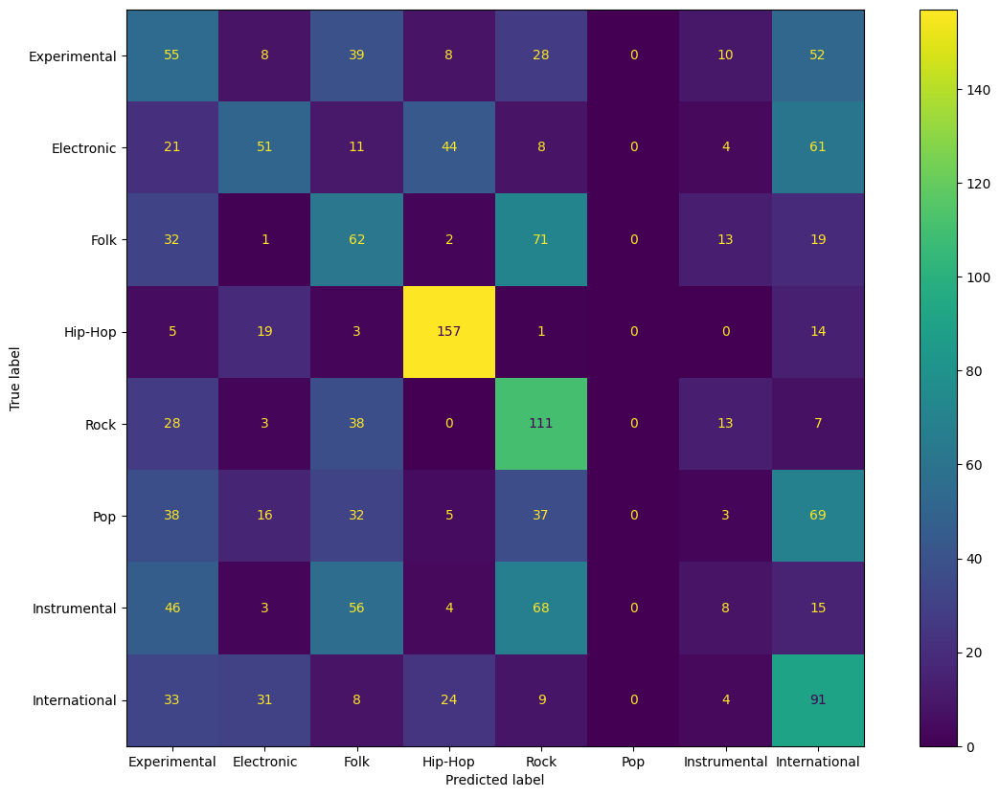

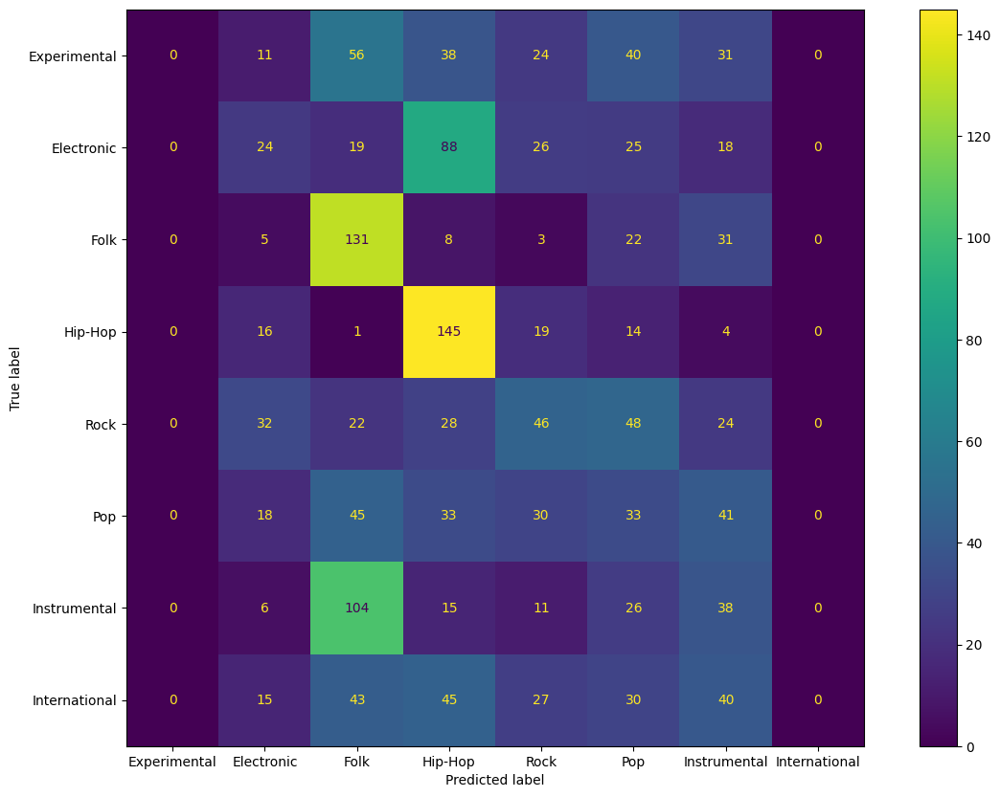

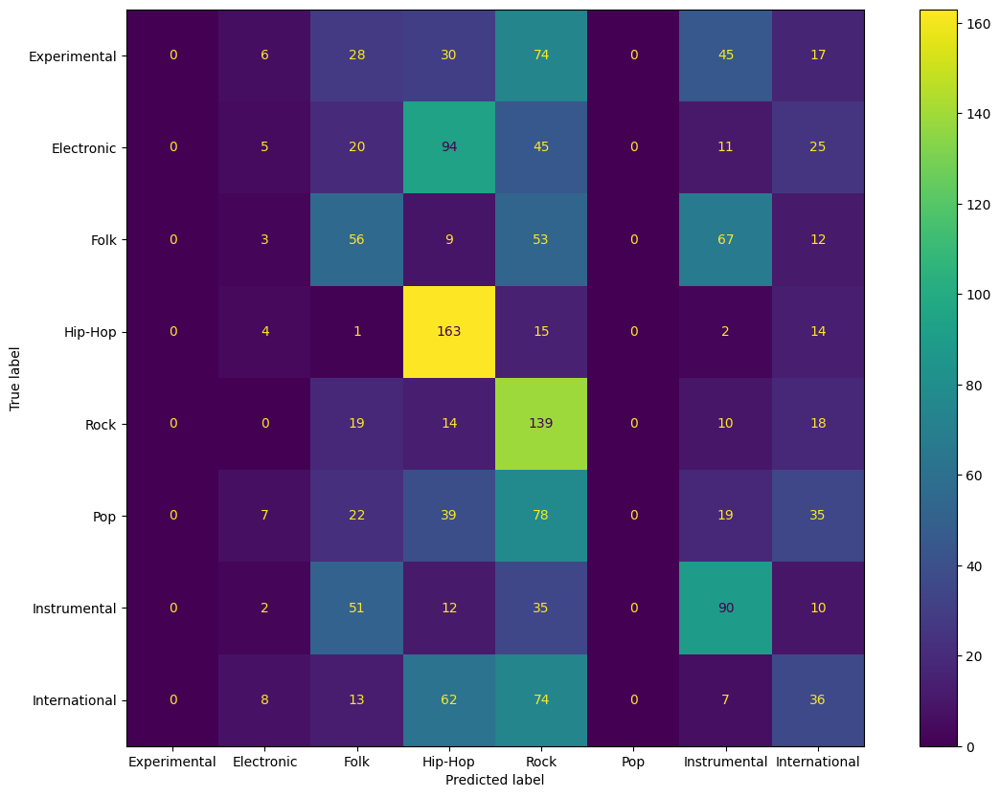

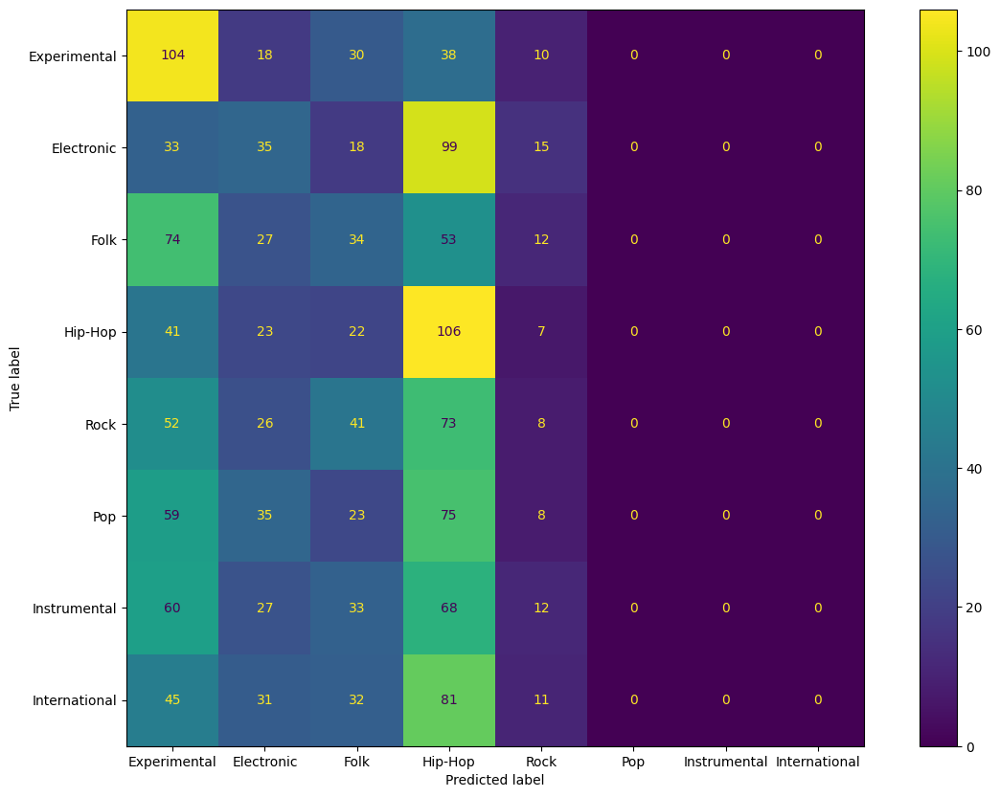

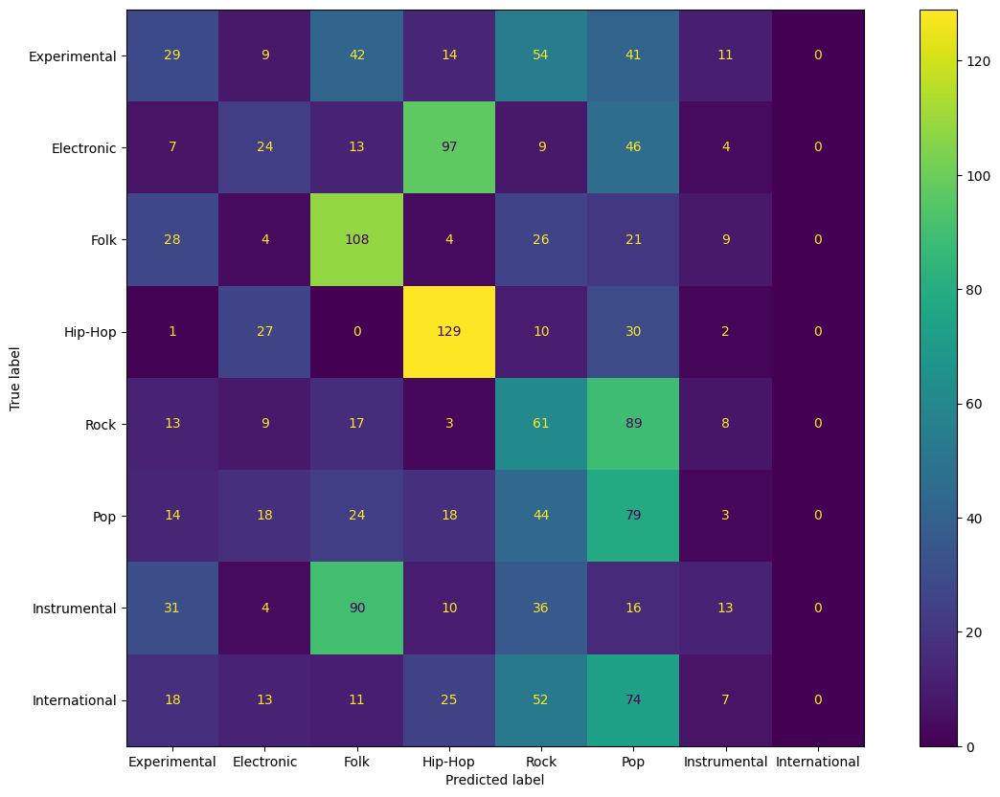

...

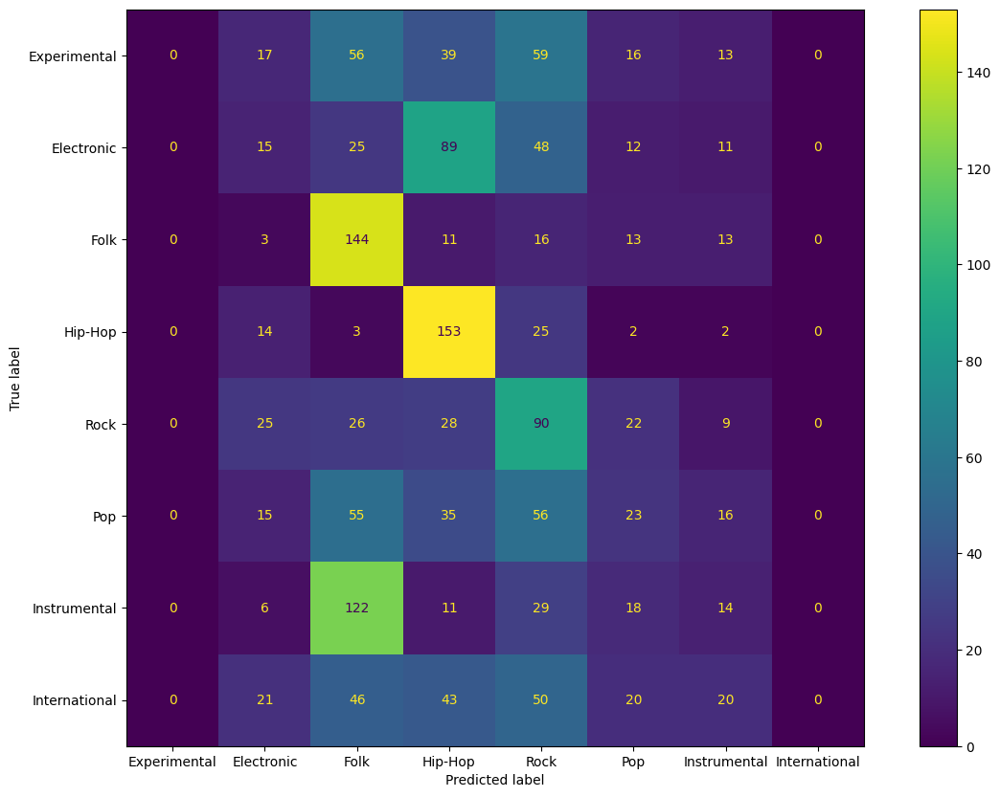

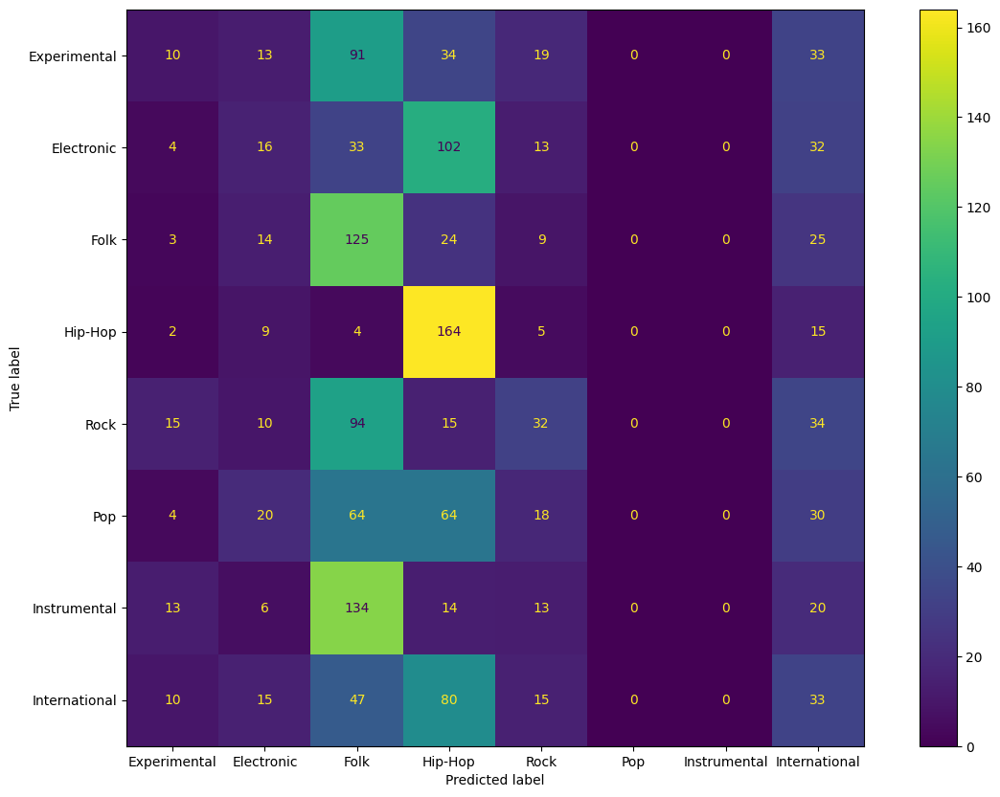

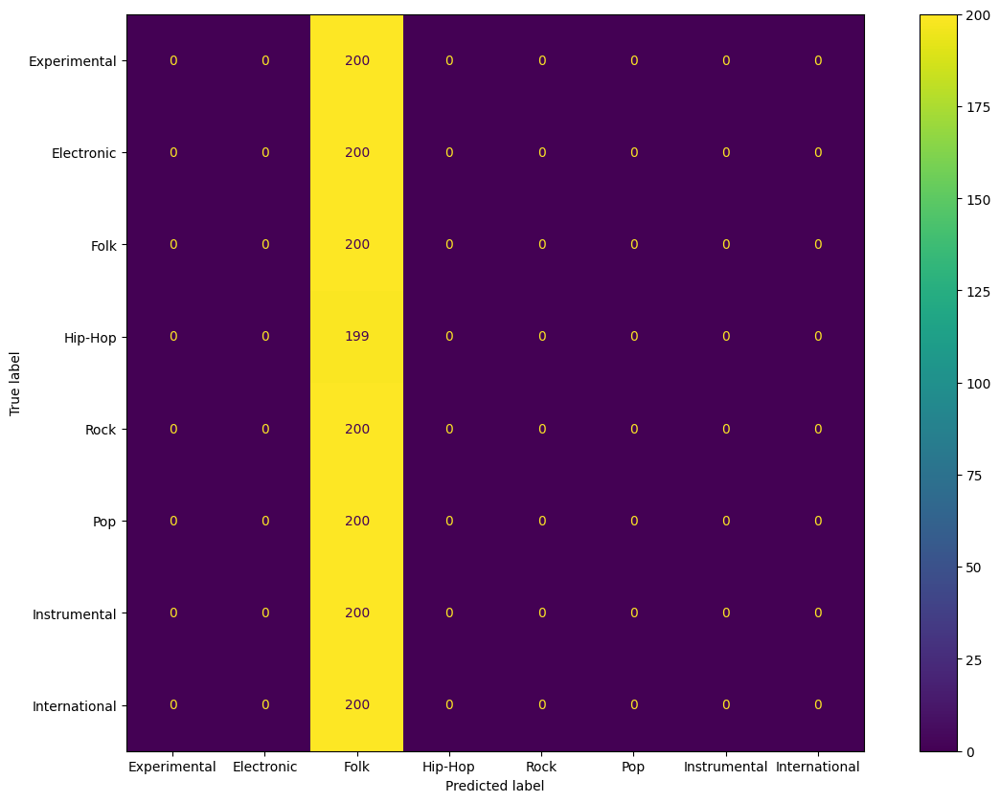

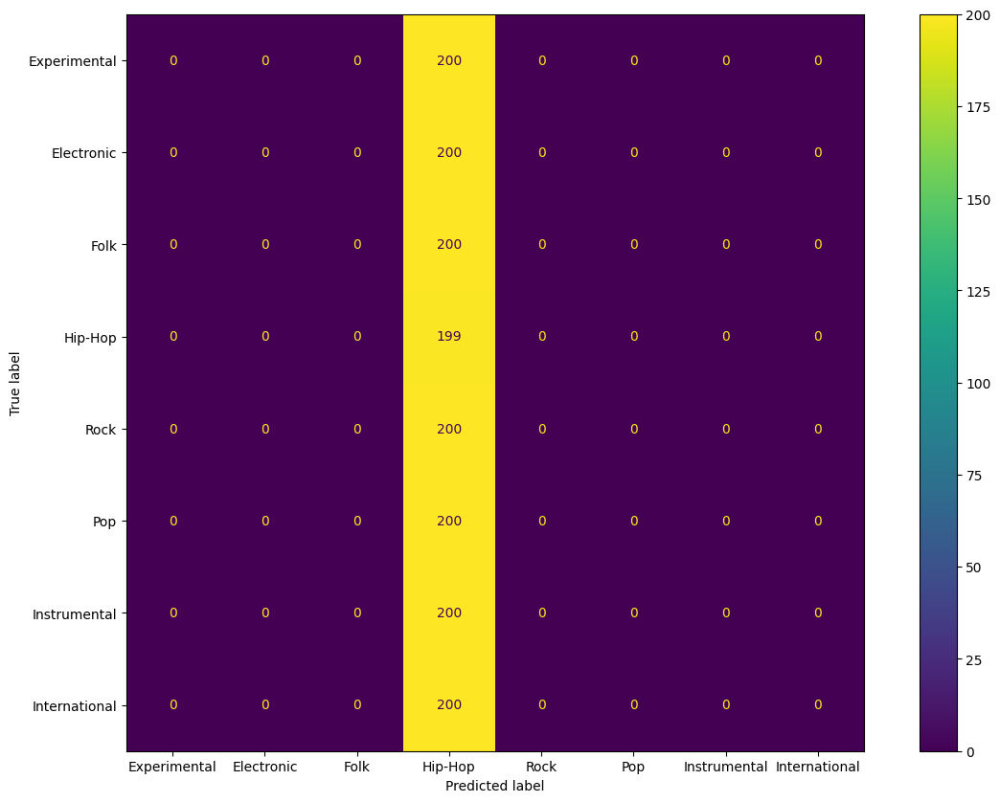

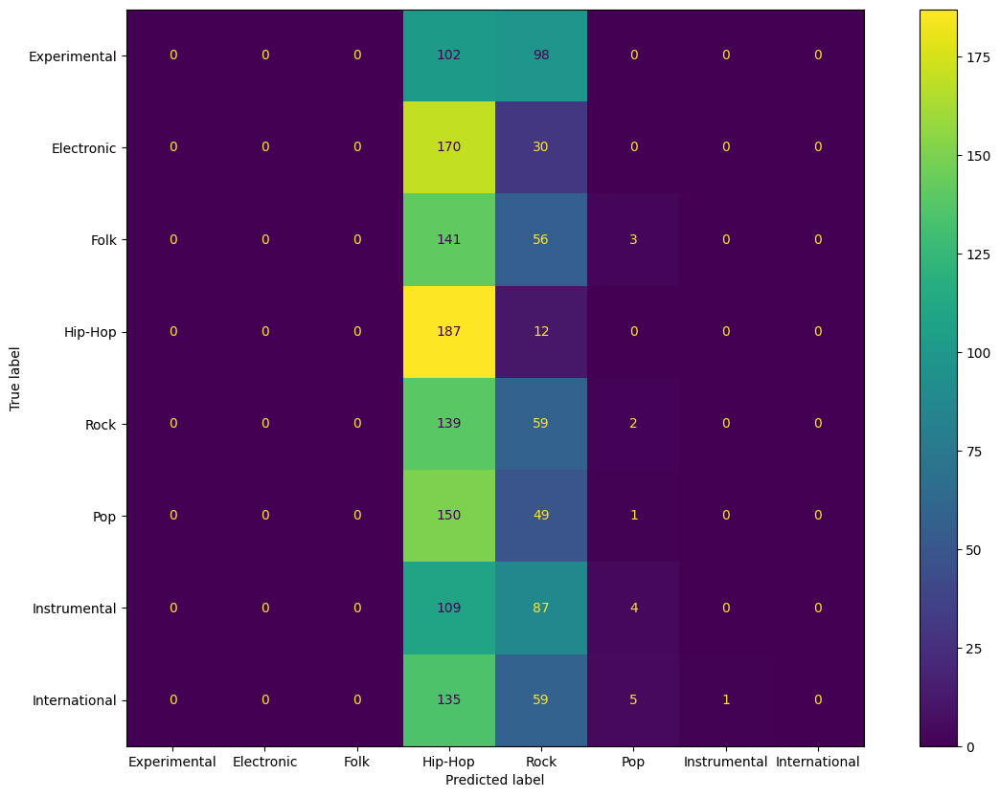

In [ ]:
num_classes = len(df['genre'].unique())
criterion = nn.CrossEntropyLoss()

# for each feature, train a model and evaluate it
for norm in [False, True]:
    for feature in features:
        print(f"-"*50)
        norm_text = "normalized" if norm else "original"
        print(f"Training model for feature: {feature}_{norm_text}")
        model = CNN_GRU_Classifier(n_dim=features_dim[feature], to_layers=cnn_to_layers[feature], num_classes=num_classes).to(device)
        optimizer = optim.Adam(model.parameters(), lr=0.0001)

        train_loader, val_loader, test_loader = get_data_loader(train_df, val_df, test_df, feature, norm=norm)

        train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=50)
        model.load_state_dict(torch.load('best_model.pth'))

        # Avaliar o modelo
        crnn_report[f'{feature}_{norm_text}'] = evaluate_model(model, test_loader, device)

### For all features

In [ ]:
# CNN de Classificação
class FeatureBranch(nn.Module):
    def __init__(self, n_dim, to_layers, num_classes=8):
        super(FeatureBranch, self).__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(n_dim, to_layers[0], kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(to_layers[0]),
            nn.ELU(),
            nn.MaxPool1d(kernel_size=4, stride=4),

            nn.Conv1d(to_layers[0], to_layers[1], kernel_size=3, stride=1, padding=1),
            nn.ELU(),
            nn.MaxPool1d(kernel_size=4, stride=4)
        )

        self.gru = nn.GRU(input_size=to_layers[1], hidden_size=8, num_layers=16, batch_first=True, bidirectional=True)

        self.fc = nn.Sequential(
            nn.Linear(16, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.ReLU()
        )

    def forward(self, x):
        x = self.cnn(x)
        x = x.permute(0, 2, 1)

        gru_out, _ = self.gru(x)
        gru_out = gru_out[:, -1, :]

        out = self.fc(gru_out)

        return out

class CNN_GRU_MusicGenreClassifier(nn.Module):
    def __init__(self, n_dim, num_classes=8):
        super(CNN_GRU_MusicGenreClassifier, self).__init__()
        self.mfcc_branch = FeatureBranch(n_dim=13, to_layers=[32, 64])
        self.chroma_branch = FeatureBranch(n_dim=12, to_layers=[32, 64])
        self.spectral_branch = FeatureBranch(n_dim=1, to_layers=[32, 64])
        self.tempo_branch = FeatureBranch(n_dim=1, to_layers=[8, 16])
        self.stft_branch = FeatureBranch(n_dim=1025, to_layers=[256, 128])
        self.mel_spectrogram_branch = FeatureBranch(n_dim=128, to_layers=[64, 32])

        # Camada fully connected para classificação
        self.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(32 * 2 * 6, 64),  # Bidirectional GRU output (32*2)
            nn.ELU(),
            nn.Linear(64, num_classes)
        )

    def forward(self, mfcc, chroma, spectral, tempo, stft, mel_spectrogram):
        mfcc_out = self.mfcc_branch(mfcc)
        chroma_out = self.chroma_branch(chroma)
        spectral_out = self.spectral_branch(spectral)
        tempo_out = self.tempo_branch(tempo)
        stft_out = self.stft_branch(stft)
        mel_spectrogram_out = self.mel_spectrogram_branch(mel_spectrogram)
        combined = torch.cat([mfcc_out, chroma_out, spectral_out, tempo_out, stft_out, mel_spectrogram_out], dim=1)

        return self.fc(combined)

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Função para avaliar o modelo e gerar o classification report
def evaluate_model_all(model, test_loader, device):
    model.eval()  # Colocar o modelo em modo de avaliação
    y_pred = []
    y_true = []

    with torch.no_grad():
        for mfcc, chroma, spectral, tempo, stft, mel_spectrogram, y in test_loader:
            mfcc, chroma, spectral, tempo, stft, mel_spectrogram, y = mfcc.to(device), chroma.to(device), spectral.to(device), tempo.to(device), stft.to(device), mel_spectrogram.to(device), y.to(device).long()

            outputs = model(mfcc, chroma, spectral, tempo, stft, mel_spectrogram)
            preds = torch.argmax(outputs, dim=1)

            y_pred.extend(preds.cpu().numpy())
            y_true.extend(y.cpu().numpy())

    # Gerar o classification report
    print(classification_report(y_true, y_pred, target_names=test_df['genre'].unique(), output_dict=False))
    report = classification_report(y_true, y_pred, target_names=test_df['genre'].unique(), output_dict=True)

    # Display confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=test_df['label'].unique())
    cmd = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=test_df['genre'].unique())
    fig, ax = plt.subplots(figsize=(15,10))
    display(cmd.plot(ax=ax))

    return report

--------------------------------------------------
Training model for feature: ALL_original


/tmp/ipykernel_25480/3272134119.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.25      0.07      0.10       200
   Electronic       0.38      0.67      0.48       200
         Folk       0.34      0.21      0.26       200
      Hip-Hop       0.41      0.26      0.32       200
         Rock       0.46      0.66      0.54       200
          Pop       0.49      0.44      0.46       200
 Instrumental       0.49      0.68      0.57       199
International       0.33      0.34      0.33       200

     accuracy                           0.41      1599
    macro avg       0.39      0.41      0.38      1599
 weighted avg       0.39      0.41      0.38      1599



--------------------------------------------------
Training model for feature: ALL_normalized


Epoch 1/50: 100%|██████████| 160/160 [00:24<00:00,  6.57it/s]


Validation Loss: 2.0794
Model saved with validation loss: 2.0794


Epoch 2/50: 100%|██████████| 160/160 [00:23<00:00,  6.75it/s]


Validation Loss: 2.0545
Model saved with validation loss: 2.0545


Epoch 3/50: 100%|██████████| 160/160 [00:23<00:00,  6.77it/s]


Validation Loss: 1.9363
Model saved with validation loss: 1.9363


Epoch 4/50: 100%|██████████| 160/160 [00:23<00:00,  6.76it/s]


Validation Loss: 1.9298
Model saved with validation loss: 1.9298


Epoch 5/50: 100%|██████████| 160/160 [00:23<00:00,  6.82it/s]


Validation Loss: 1.9545


Epoch 6/50: 100%|██████████| 160/160 [00:23<00:00,  6.75it/s]


Validation Loss: 1.9642


Epoch 7/50: 100%|██████████| 160/160 [00:23<00:00,  6.78it/s]


Validation Loss: 1.9714


Epoch 8/50: 100%|██████████| 160/160 [00:23<00:00,  6.87it/s]


Validation Loss: 1.9803


Epoch 9/50: 100%|██████████| 160/160 [00:23<00:00,  6.89it/s]


Validation Loss: 1.9432


Epoch 10/50: 100%|██████████| 160/160 [00:23<00:00,  6.89it/s]


Validation Loss: 1.9644


Epoch 11/50: 100%|██████████| 160/160 [00:23<00:00,  6.80it/s]


Validation Loss: 1.9938


Epoch 12/50: 100%|██████████| 160/160 [00:23<00:00,  6.83it/s]


Validation Loss: 1.9675


Epoch 13/50: 100%|██████████| 160/160 [00:23<00:00,  6.83it/s]


Validation Loss: 2.1477


Epoch 14/50: 100%|██████████| 160/160 [00:23<00:00,  6.74it/s]


Validation Loss: 1.9902


/tmp/ipykernel_25480/3272134119.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


               precision    recall  f1-score   support

 Experimental       0.22      0.02      0.04       200
   Electronic       0.36      0.20      0.25       200
         Folk       0.17      0.44      0.24       200
      Hip-Hop       0.00      0.00      0.00       200
         Rock       0.40      0.18      0.25       200
          Pop       0.22      0.58      0.32       200
 Instrumental       0.29      0.46      0.36       199
International       0.50      0.01      0.02       200

     accuracy                           0.24      1599
    macro avg       0.27      0.24      0.18      1599
 weighted avg       0.27      0.24      0.18      1599



/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

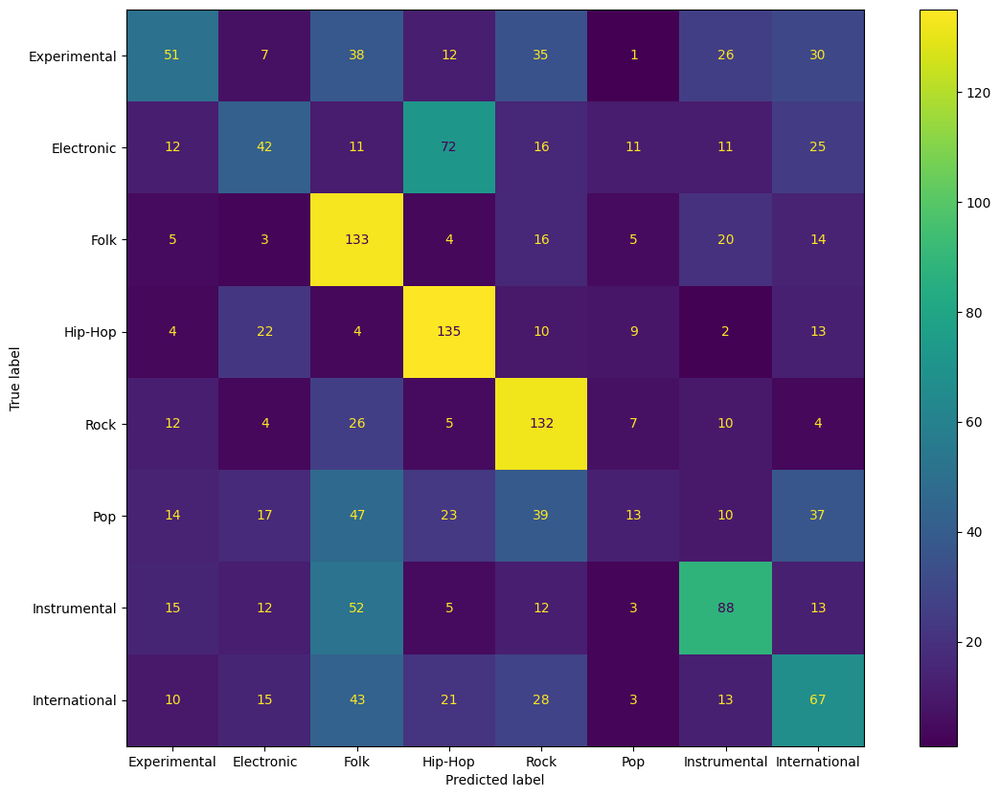

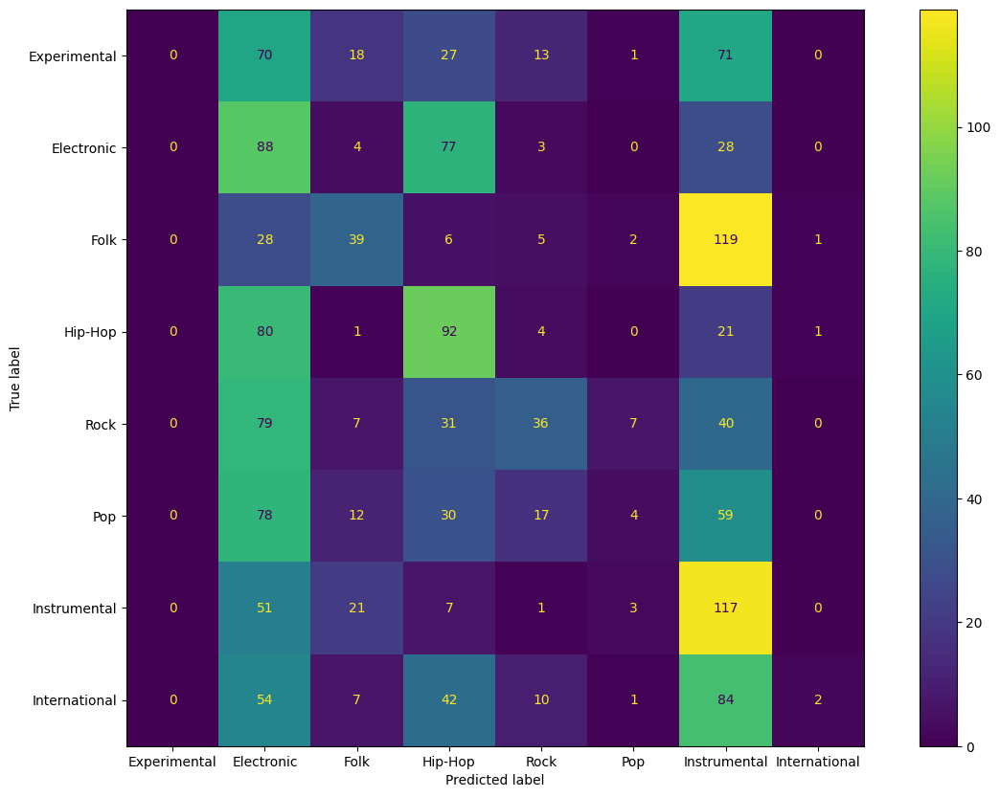

In [ ]:
num_classes = len(df['genre'].unique())
criterion = nn.CrossEntropyLoss()

all_dim = sum([features_dim[feature] for feature in features])

# for raw feature, train a model and evaluate it
for norm in [False, True]:
    log(f"-"*50)
    norm_text = "normalized" if norm else "original"
    log(f"Training model for feature: ALL_{norm_text}")
    model = CNN_GRU_MusicGenreClassifier(n_dim=all_dim, num_classes=num_classes).to(device)
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    train_loader, val_loader, test_loader = get_data_loader_features(train_df, val_df, test_df, norm=norm)

    train_model_features(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=50)
    model.load_state_dict(torch.load('best_model.pth'))

    # Avaliar o modelo
    crnn_report[f'all_{norm_text}'] = evaluate_model_all(model, test_loader, device)


In [ ]:
# save cnn_report
crnn_report_df = pd.DataFrame(crnn_report)
crnn_report_df.to_pickle('crnn_report.pkl')

## Time Inception

In [ ]:
log('Experiment: Time Inception')

Experiment: Time Inception


In [ ]:
time_inception_report = {}

In [ ]:
def fit_and_evaluate(X_train, y_train, X_test, y_test, model):
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    log('Train Accuracy: {:.2f}%'.format(100*accuracy_score(y_train, y_train_pred)))

    y_test_pred = model.predict(X_test)
    log('Test Accuracy: {:.2f}%'.format(100*accuracy_score(y_test, y_test_pred)))

    log(f"Classification report for feature ")
    log(classification_report(y_test, y_test_pred, target_names=test_df['genre'].unique()))

    cm = confusion_matrix(y_test, y_test_pred, labels=test_df['label'].unique())
    cmd = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=test_df['genre'].unique())
    fig, ax = plt.subplots(figsize=(15,10))
    cmd.plot(ax=ax)

    return classification_report(y_test, y_test_pred, target_names=test_df['genre'].unique(), output_dict=True)

In [ ]:
def get_dataset(train_df, test_df, val_df, feature, norm):
    if norm:
        train_df, test_df, val_df = normalize_df(train_df, test_df, val_df)

    X_train = np.concatenate((np.stack(train_df[feature].values), np.stack(val_df[feature].values)), axis=0)
    y_train = np.concatenate((train_df['label'].values, val_df['label'].values))

    X_test = np.stack(test_df[feature].values)
    y_test = test_df['label'].values

    return X_train, y_train, X_test, y_test

def get_dataset_all(train_df, test_df, val_df, features, norm):
    if norm:
        train_df, test_df, val_df = normalize_df(train_df, test_df, val_df)

    X_train = np.concatenate([np.stack(train_df[feature].values) for feature in features], axis=1)
    X_val = np.concatenate([np.stack(val_df[feature].values) for feature in features], axis=1)

    X_train = np.concatenate((X_train, X_val), axis=0)
    y_train = np.concatenate((train_df['label'].values, val_df['label'].values))

    X_test = np.concatenate([np.stack(test_df[feature].values) for feature in features], axis=1)
    y_test = test_df['label'].values

    return X_train, y_train, X_test, y_test

--------------------------------------------------
Training model for feature: mfcc_original


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_160 (Conv1D) │ (None, 1291, 32)  │        416 │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_30    │ (None, 1291, 13)  │          0 │ input_layer_5[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_161 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_160[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_162 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_160[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_163 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_160[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_164 (Conv1D) │ (None, 1291, 32)  │        416 │ max_pooling1d_30… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_30      │ (None, 1291, 128) │          0 │ conv1d_161[0][0], │
│ (Concatenate)       │                   │            │ conv1d_162[0][0], │
│                     │                   │            │ conv1d_163[0][0], │
│                     │                   │            │ conv1d_164[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_30[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_40       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_165 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_40[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_31    │ (None, 1291, 128) │          0 │ activation_40[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_166 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_165[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_167 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_165[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_168 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_165[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_169 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_31… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_31      │ (None, 1291, 128) │          0 │ conv1d_166[0][0], │
│ (Concatenate)       │                   │            │ conv1d_167[0][0], │
│                     │                   │            │ conv1d_168[0][0], │
│                     │                   │            │ conv1d_169[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_31[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_41       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.3311 - loss: 1.8441 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4180 - loss: 1.5777 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4588 - loss: 1.4942 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4817 - loss: 1.4317 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5092 - loss: 1.3776 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.5294 - loss: 1.3341 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.5463 - loss: 1.2916 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5630 - loss: 1.2505 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5775 - loss: 1.2125 - learning_rate: 0.0010


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_192 (Conv1D) │ (None, 1291, 32)  │        416 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_36    │ (None, 1291, 13)  │          0 │ input_layer_6[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_193 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_192[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_194 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_192[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_195 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_192[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_196 (Conv1D) │ (None, 1291, 32)  │        416 │ max_pooling1d_36… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_36      │ (None, 1291, 128) │          0 │ conv1d_193[0][0], │
│ (Concatenate)       │                   │            │ conv1d_194[0][0], │
│                     │                   │            │ conv1d_195[0][0], │
│                     │                   │            │ conv1d_196[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_36[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_48       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_197 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_48[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_37    │ (None, 1291, 128) │          0 │ activation_48[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_198 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_197[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_199 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_197[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_200 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_197[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_201 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_37… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_37      │ (None, 1291, 128) │          0 │ conv1d_198[0][0], │
│ (Concatenate)       │                   │            │ conv1d_199[0][0], │
│                     │                   │            │ conv1d_200[0][0], │
│                     │                   │            │ conv1d_201[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_37[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_49       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.3296 - loss: 1.8609 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4273 - loss: 1.5723 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4633 - loss: 1.4864 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4883 - loss: 1.4124 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5120 - loss: 1.3567 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5314 - loss: 1.3055 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5538 - loss: 1.2528 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5738 - loss: 1.2088 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5901 - loss: 1.1614 - learning_rate: 0.0010


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_224 (Conv1D) │ (None, 1291, 32)  │        416 │ input_layer_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_42    │ (None, 1291, 13)  │          0 │ input_layer_7[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_225 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_224[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_226 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_224[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_227 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_224[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_228 (Conv1D) │ (None, 1291, 32)  │        416 │ max_pooling1d_42… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_42      │ (None, 1291, 128) │          0 │ conv1d_225[0][0], │
│ (Concatenate)       │                   │            │ conv1d_226[0][0], │
│                     │                   │            │ conv1d_227[0][0], │
│                     │                   │            │ conv1d_228[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_42[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_56       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_229 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_56[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_43    │ (None, 1291, 128) │          0 │ activation_56[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_230 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_229[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_231 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_229[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_232 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_229[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_233 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_43… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_43      │ (None, 1291, 128) │          0 │ conv1d_230[0][0], │
│ (Concatenate)       │                   │            │ conv1d_231[0][0], │
│                     │                   │            │ conv1d_232[0][0], │
│                     │                   │            │ conv1d_233[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_43[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_57       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.3427 - loss: 1.8255 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4344 - loss: 1.5590 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4650 - loss: 1.4768 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4881 - loss: 1.4212 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5064 - loss: 1.3737 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5236 - loss: 1.3306 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5439 - loss: 1.2832 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5596 - loss: 1.2324 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5712 - loss: 1.1919 - learning_rate: 0.0010


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_256 (Conv1D) │ (None, 1291, 32)  │        416 │ input_layer_8[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_48    │ (None, 1291, 13)  │          0 │ input_layer_8[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_257 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_256[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_258 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_256[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_259 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_256[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_260 (Conv1D) │ (None, 1291, 32)  │        416 │ max_pooling1d_48… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_48      │ (None, 1291, 128) │          0 │ conv1d_257[0][0], │
│ (Concatenate)       │                   │            │ conv1d_258[0][0], │
│                     │                   │            │ conv1d_259[0][0], │
│                     │                   │            │ conv1d_260[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_48[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_64       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_261 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_64[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_49    │ (None, 1291, 128) │          0 │ activation_64[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_262 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_261[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_263 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_261[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_264 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_261[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_265 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_49… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_49      │ (None, 1291, 128) │          0 │ conv1d_262[0][0], │
│ (Concatenate)       │                   │            │ conv1d_263[0][0], │
│                     │                   │            │ conv1d_264[0][0], │
│                     │                   │            │ conv1d_265[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_49[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_65       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - accuracy: 0.3379 - loss: 1.8185 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4120 - loss: 1.5696 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4517 - loss: 1.4837 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4826 - loss: 1.4203 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5078 - loss: 1.3604 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5247 - loss: 1.3099 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.5461 - loss: 1.2666 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.5603 - loss: 1.2297 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5701 - loss: 1.1878 - learning_rate: 0.0010


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_288 (Conv1D) │ (None, 1291, 32)  │        416 │ input_layer_9[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_54    │ (None, 1291, 13)  │          0 │ input_layer_9[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_289 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_288[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_290 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_288[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_291 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_288[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_292 (Conv1D) │ (None, 1291, 32)  │        416 │ max_pooling1d_54… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_54      │ (None, 1291, 128) │          0 │ conv1d_289[0][0], │
│ (Concatenate)       │                   │            │ conv1d_290[0][0], │
│                     │                   │            │ conv1d_291[0][0], │
│                     │                   │            │ conv1d_292[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_54[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_72       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_293 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_72[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_55    │ (None, 1291, 128) │          0 │ activation_72[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_294 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_293[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_295 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_293[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_296 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_293[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_297 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_55… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_55      │ (None, 1291, 128) │          0 │ conv1d_294[0][0], │
│ (Concatenate)       │                   │            │ conv1d_295[0][0], │
│                     │                   │            │ conv1d_296[0][0], │
│                     │                   │            │ conv1d_297[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_55[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_73       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - accuracy: 0.3301 - loss: 1.8425 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4257 - loss: 1.5992 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4534 - loss: 1.5176 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4744 - loss: 1.4535 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4895 - loss: 1.3962 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5044 - loss: 1.3470 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5228 - loss: 1.3032 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5426 - loss: 1.2643 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5635 - loss: 1.2201 - learning_rate: 0.0010


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_320 (Conv1D) │ (None, 1291, 32)  │        384 │ input_layer_10[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_60    │ (None, 1291, 12)  │          0 │ input_layer_10[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_321 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_320[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_322 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_320[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_323 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_320[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_324 (Conv1D) │ (None, 1291, 32)  │        384 │ max_pooling1d_60… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_60      │ (None, 1291, 128) │          0 │ conv1d_321[0][0], │
│ (Concatenate)       │                   │            │ conv1d_322[0][0], │
│                     │                   │            │ conv1d_323[0][0], │
│                     │                   │            │ conv1d_324[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_60[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_80       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_325 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_80[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_61    │ (None, 1291, 128) │          0 │ activation_80[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_326 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_325[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_327 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_325[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_328 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_325[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_329 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_61… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_61      │ (None, 1291, 128) │          0 │ conv1d_326[0][0], │
│ (Concatenate)       │                   │            │ conv1d_327[0][0], │
│                     │                   │            │ conv1d_328[0][0], │
│                     │                   │            │ conv1d_329[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_61[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_81       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - accuracy: 0.2718 - loss: 1.9185 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3678 - loss: 1.7155 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4008 - loss: 1.6320 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4234 - loss: 1.5769 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4457 - loss: 1.5308 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4696 - loss: 1.4861 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4789 - loss: 1.4431 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4975 - loss: 1.4021 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5116 - loss: 1.3647 - learning_rate: 0.0010


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_352 (Conv1D) │ (None, 1291, 32)  │        384 │ input_layer_11[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_66    │ (None, 1291, 12)  │          0 │ input_layer_11[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_353 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_352[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_354 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_352[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_355 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_352[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_356 (Conv1D) │ (None, 1291, 32)  │        384 │ max_pooling1d_66… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_66      │ (None, 1291, 128) │          0 │ conv1d_353[0][0], │
│ (Concatenate)       │                   │            │ conv1d_354[0][0], │
│                     │                   │            │ conv1d_355[0][0], │
│                     │                   │            │ conv1d_356[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_66[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_88       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_357 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_88[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_67    │ (None, 1291, 128) │          0 │ activation_88[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_358 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_357[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_359 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_357[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_360 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_357[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_361 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_67… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_67      │ (None, 1291, 128) │          0 │ conv1d_358[0][0], │
│ (Concatenate)       │                   │            │ conv1d_359[0][0], │
│                     │                   │            │ conv1d_360[0][0], │
│                     │                   │            │ conv1d_361[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_67[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_89       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.3018 - loss: 1.9056 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3818 - loss: 1.6966 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4076 - loss: 1.6225 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4319 - loss: 1.5706 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4471 - loss: 1.5284 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4692 - loss: 1.4926 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4810 - loss: 1.4576 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4995 - loss: 1.4227 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5118 - loss: 1.3875 - learning_rate: 0.0010


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_384 (Conv1D) │ (None, 1291, 32)  │        384 │ input_layer_12[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_72    │ (None, 1291, 12)  │          0 │ input_layer_12[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_385 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_384[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_386 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_384[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_387 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_384[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_388 (Conv1D) │ (None, 1291, 32)  │        384 │ max_pooling1d_72… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_72      │ (None, 1291, 128) │          0 │ conv1d_385[0][0], │
│ (Concatenate)       │                   │            │ conv1d_386[0][0], │
│                     │                   │            │ conv1d_387[0][0], │
│                     │                   │            │ conv1d_388[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_72[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_96       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_389 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_96[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_73    │ (None, 1291, 128) │          0 │ activation_96[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_390 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_389[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_391 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_389[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_392 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_389[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_393 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_73… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_73      │ (None, 1291, 128) │          0 │ conv1d_390[0][0], │
│ (Concatenate)       │                   │            │ conv1d_391[0][0], │
│                     │                   │            │ conv1d_392[0][0], │
│                     │                   │            │ conv1d_393[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_73[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_97       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - accuracy: 0.2749 - loss: 1.9632 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3750 - loss: 1.7006 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4029 - loss: 1.6355 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4330 - loss: 1.5823 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4494 - loss: 1.5359 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4610 - loss: 1.4944 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4781 - loss: 1.4584 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4897 - loss: 1.4193 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5004 - loss: 1.3811 - learning_rate: 0.0010


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_416 (Conv1D) │ (None, 1291, 32)  │        384 │ input_layer_13[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_78    │ (None, 1291, 12)  │          0 │ input_layer_13[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_417 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_416[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_418 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_416[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_419 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_416[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_420 (Conv1D) │ (None, 1291, 32)  │        384 │ max_pooling1d_78… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_78      │ (None, 1291, 128) │          0 │ conv1d_417[0][0], │
│ (Concatenate)       │                   │            │ conv1d_418[0][0], │
│                     │                   │            │ conv1d_419[0][0], │
│                     │                   │            │ conv1d_420[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_78[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_104      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_421 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_104[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_79    │ (None, 1291, 128) │          0 │ activation_104[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_422 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_421[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_423 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_421[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_424 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_421[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_425 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_79… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_79      │ (None, 1291, 128) │          0 │ conv1d_422[0][0], │
│ (Concatenate)       │                   │            │ conv1d_423[0][0], │
│                     │                   │            │ conv1d_424[0][0], │
│                     │                   │            │ conv1d_425[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_79[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_105      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2834 - loss: 1.9379 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3702 - loss: 1.6931 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.4073 - loss: 1.6190 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4275 - loss: 1.5693 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4418 - loss: 1.5256 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4615 - loss: 1.4834 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4780 - loss: 1.4430 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4976 - loss: 1.4038 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5082 - loss: 1.3684 - learning_rate: 0.0010


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_448 (Conv1D) │ (None, 1291, 32)  │        384 │ input_layer_14[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_84    │ (None, 1291, 12)  │          0 │ input_layer_14[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_449 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_448[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_450 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_448[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_451 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_448[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_452 (Conv1D) │ (None, 1291, 32)  │        384 │ max_pooling1d_84… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_84      │ (None, 1291, 128) │          0 │ conv1d_449[0][0], │
│ (Concatenate)       │                   │            │ conv1d_450[0][0], │
│                     │                   │            │ conv1d_451[0][0], │
│                     │                   │            │ conv1d_452[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_84[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_112      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_453 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_112[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_85    │ (None, 1291, 128) │          0 │ activation_112[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_454 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_453[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_455 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_453[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_456 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_453[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_457 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_85… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_85      │ (None, 1291, 128) │          0 │ conv1d_454[0][0], │
│ (Concatenate)       │                   │            │ conv1d_455[0][0], │
│                     │                   │            │ conv1d_456[0][0], │
│                     │                   │            │ conv1d_457[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_85[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_113      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.2687 - loss: 1.9369 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3602 - loss: 1.7161 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3941 - loss: 1.6443 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4234 - loss: 1.5956 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4422 - loss: 1.5536 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4616 - loss: 1.5116 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4798 - loss: 1.4730 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4912 - loss: 1.4408 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5043 - loss: 1.4055 - learning_rate: 0.0010


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_90    │ (None, 1291, 1)   │          0 │ input_layer_15[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_480 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_15[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_481 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_15[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_482 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_15[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_483 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_90… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_90      │ (None, 1291, 128) │          0 │ conv1d_480[0][0], │
│ (Concatenate)       │                   │            │ conv1d_481[0][0], │
│                     │                   │            │ conv1d_482[0][0], │
│                     │                   │            │ conv1d_483[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_90[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_120      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_484 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_120[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_91    │ (None, 1291, 128) │          0 │ activation_120[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_485 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_484[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_486 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_484[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_487 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_484[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_488 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_91… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_91      │ (None, 1291, 128) │          0 │ conv1d_485[0][0], │
│ (Concatenate)       │                   │            │ conv1d_486[0][0], │
│                     │                   │            │ conv1d_487[0][0], │
│                     │                   │            │ conv1d_488[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_91[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_121      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.2930 - loss: 1.9032 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3730 - loss: 1.7150 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3849 - loss: 1.6765 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.3933 - loss: 1.6482 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3962 - loss: 1.6202 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4072 - loss: 1.5944 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.4186 - loss: 1.5744 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.4307 - loss: 1.5556 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4401 - loss: 1.5346 - learning_rate: 0.0010


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_96    │ (None, 1291, 1)   │          0 │ input_layer_16[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_511 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_16[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_512 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_16[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_513 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_16[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_514 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_96… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_96      │ (None, 1291, 128) │          0 │ conv1d_511[0][0], │
│ (Concatenate)       │                   │            │ conv1d_512[0][0], │
│                     │                   │            │ conv1d_513[0][0], │
│                     │                   │            │ conv1d_514[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_96[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_128      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_515 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_128[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_97    │ (None, 1291, 128) │          0 │ activation_128[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_516 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_515[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_517 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_515[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_518 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_515[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_519 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_97… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_97      │ (None, 1291, 128) │          0 │ conv1d_516[0][0], │
│ (Concatenate)       │                   │            │ conv1d_517[0][0], │
│                     │                   │            │ conv1d_518[0][0], │
│                     │                   │            │ conv1d_519[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_97[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_129      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.2878 - loss: 1.9269 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3664 - loss: 1.7202 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3868 - loss: 1.6789 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3945 - loss: 1.6427 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4074 - loss: 1.6159 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4211 - loss: 1.5894 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4255 - loss: 1.5681 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.4413 - loss: 1.5443 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4478 - loss: 1.5252 - learning_rate: 0.0010


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_102   │ (None, 1291, 1)   │          0 │ input_layer_17[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_542 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_17[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_543 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_17[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_544 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_17[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_545 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_102     │ (None, 1291, 128) │          0 │ conv1d_542[0][0], │
│ (Concatenate)       │                   │            │ conv1d_543[0][0], │
│                     │                   │            │ conv1d_544[0][0], │
│                     │                   │            │ conv1d_545[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_102[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_136      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_546 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_136[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_103   │ (None, 1291, 128) │          0 │ activation_136[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_547 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_546[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_548 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_546[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_549 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_546[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_550 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_103     │ (None, 1291, 128) │          0 │ conv1d_547[0][0], │
│ (Concatenate)       │                   │            │ conv1d_548[0][0], │
│                     │                   │            │ conv1d_549[0][0], │
│                     │                   │            │ conv1d_550[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_103[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_137      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.2959 - loss: 1.9067 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.3632 - loss: 1.7396 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.3864 - loss: 1.6899 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4012 - loss: 1.6499 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4131 - loss: 1.6224 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4206 - loss: 1.5974 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4338 - loss: 1.5736 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4379 - loss: 1.5508 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4532 - loss: 1.5317 - learning_rate: 0.0010

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_108   │ (None, 1291, 1)   │          0 │ input_layer_18[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_573 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_18[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_574 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_18[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_575 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_18[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_576 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_108     │ (None, 1291, 128) │          0 │ conv1d_573[0][0], │
│ (Concatenate)       │                   │            │ conv1d_574[0][0], │
│                     │                   │            │ conv1d_575[0][0], │
│                     │                   │            │ conv1d_576[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_108[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_144      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_577 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_144[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_109   │ (None, 1291, 128) │          0 │ activation_144[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_578 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_577[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_579 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_577[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_580 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_577[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_581 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_10… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_109     │ (None, 1291, 128) │          0 │ conv1d_578[0][0], │
│ (Concatenate)       │                   │            │ conv1d_579[0][0], │
│                     │                   │            │ conv1d_580[0][0], │
│                     │                   │            │ conv1d_581[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_109[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_145      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - accuracy: 0.3098 - loss: 1.8943 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3671 - loss: 1.7120 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3875 - loss: 1.6709 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3993 - loss: 1.6370 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4094 - loss: 1.6075 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4227 - loss: 1.5799 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4317 - loss: 1.5588 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4426 - loss: 1.5351 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4543 - loss: 1.5127 - learning_rate: 0.0010


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_19      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_114   │ (None, 1291, 1)   │          0 │ input_layer_19[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_604 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_19[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_605 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_19[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_606 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_19[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_607 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_114     │ (None, 1291, 128) │          0 │ conv1d_604[0][0], │
│ (Concatenate)       │                   │            │ conv1d_605[0][0], │
│                     │                   │            │ conv1d_606[0][0], │
│                     │                   │            │ conv1d_607[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_114[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_152      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_608 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_152[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_115   │ (None, 1291, 128) │          0 │ activation_152[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_609 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_608[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_610 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_608[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_611 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_608[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_612 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_115     │ (None, 1291, 128) │          0 │ conv1d_609[0][0], │
│ (Concatenate)       │                   │            │ conv1d_610[0][0], │
│                     │                   │            │ conv1d_611[0][0], │
│                     │                   │            │ conv1d_612[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_115[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_153      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - accuracy: 0.3136 - loss: 1.9081 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3718 - loss: 1.7064 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3915 - loss: 1.6593 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4042 - loss: 1.6267 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4127 - loss: 1.6013 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4259 - loss: 1.5770 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4343 - loss: 1.5550 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4426 - loss: 1.5379 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4527 - loss: 1.5164 - learning_rate: 0.0010


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_120   │ (None, 1291, 1)   │          0 │ input_layer_20[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_635 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_20[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_636 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_20[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_637 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_20[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_638 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_120     │ (None, 1291, 128) │          0 │ conv1d_635[0][0], │
│ (Concatenate)       │                   │            │ conv1d_636[0][0], │
│                     │                   │            │ conv1d_637[0][0], │
│                     │                   │            │ conv1d_638[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_120[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_160      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_639 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_160[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_121   │ (None, 1291, 128) │          0 │ activation_160[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_640 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_639[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_641 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_639[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_642 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_639[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_643 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_121     │ (None, 1291, 128) │          0 │ conv1d_640[0][0], │
│ (Concatenate)       │                   │            │ conv1d_641[0][0], │
│                     │                   │            │ conv1d_642[0][0], │
│                     │                   │            │ conv1d_643[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_121[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_161      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - accuracy: 0.1707 - loss: 2.1253 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1983 - loss: 2.0377 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2125 - loss: 2.0251 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2153 - loss: 2.0145 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2271 - loss: 2.0058 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2300 - loss: 1.9954 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2314 - loss: 1.9907 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2394 - loss: 1.9857 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2419 - loss: 1.9838 - learning_rate: 0.0010


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_21      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_126   │ (None, 1291, 1)   │          0 │ input_layer_21[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_666 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_21[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_667 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_21[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_668 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_21[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_669 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_126     │ (None, 1291, 128) │          0 │ conv1d_666[0][0], │
│ (Concatenate)       │                   │            │ conv1d_667[0][0], │
│                     │                   │            │ conv1d_668[0][0], │
│                     │                   │            │ conv1d_669[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_126[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_168      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_670 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_168[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_127   │ (None, 1291, 128) │          0 │ activation_168[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_671 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_670[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_672 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_670[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_673 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_670[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_674 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_127     │ (None, 1291, 128) │          0 │ conv1d_671[0][0], │
│ (Concatenate)       │                   │            │ conv1d_672[0][0], │
│                     │                   │            │ conv1d_673[0][0], │
│                     │                   │            │ conv1d_674[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_127[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_169      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.1755 - loss: 2.1104 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.2096 - loss: 2.0330 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2271 - loss: 2.0121 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2318 - loss: 2.0068 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.2399 - loss: 1.9968 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2463 - loss: 1.9889 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2443 - loss: 1.9855 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.2446 - loss: 1.9830 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2471 - loss: 1.9767 - learning_rate: 0.0010


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_22      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_132   │ (None, 1291, 1)   │          0 │ input_layer_22[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_697 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_22[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_698 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_22[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_699 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_22[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_700 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_132     │ (None, 1291, 128) │          0 │ conv1d_697[0][0], │
│ (Concatenate)       │                   │            │ conv1d_698[0][0], │
│                     │                   │            │ conv1d_699[0][0], │
│                     │                   │            │ conv1d_700[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_132[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_176      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_701 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_176[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_133   │ (None, 1291, 128) │          0 │ activation_176[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_702 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_701[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_703 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_701[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_704 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_701[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_705 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_133     │ (None, 1291, 128) │          0 │ conv1d_702[0][0], │
│ (Concatenate)       │                   │            │ conv1d_703[0][0], │
│                     │                   │            │ conv1d_704[0][0], │
│                     │                   │            │ conv1d_705[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_133[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_177      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.1641 - loss: 2.1323 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1949 - loss: 2.0561 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2136 - loss: 2.0376 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2287 - loss: 2.0211 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2273 - loss: 2.0109 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2320 - loss: 2.0055 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2382 - loss: 2.0024 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2431 - loss: 2.0004 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2402 - loss: 1.9985 - learning_rate: 0.0010


Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_23      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_138   │ (None, 1291, 1)   │          0 │ input_layer_23[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_728 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_23[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_729 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_23[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_730 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_23[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_731 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_138     │ (None, 1291, 128) │          0 │ conv1d_728[0][0], │
│ (Concatenate)       │                   │            │ conv1d_729[0][0], │
│                     │                   │            │ conv1d_730[0][0], │
│                     │                   │            │ conv1d_731[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_138[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_184      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_732 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_184[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_139   │ (None, 1291, 128) │          0 │ activation_184[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_733 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_732[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_734 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_732[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_735 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_732[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_736 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_139     │ (None, 1291, 128) │          0 │ conv1d_733[0][0], │
│ (Concatenate)       │                   │            │ conv1d_734[0][0], │
│                     │                   │            │ conv1d_735[0][0], │
│                     │                   │            │ conv1d_736[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_139[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_185      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - accuracy: 0.1675 - loss: 2.1421 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.1898 - loss: 2.0417 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2028 - loss: 2.0283 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.2210 - loss: 2.0098 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2269 - loss: 1.9976 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2241 - loss: 1.9910 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2309 - loss: 1.9879 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2343 - loss: 1.9827 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2350 - loss: 1.9800 - learning_rate: 0.0010


Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_24      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_144   │ (None, 1291, 1)   │          0 │ input_layer_24[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_759 (Conv1D) │ (None, 1291, 32)  │      1,280 │ input_layer_24[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_760 (Conv1D) │ (None, 1291, 32)  │        640 │ input_layer_24[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_761 (Conv1D) │ (None, 1291, 32)  │        320 │ input_layer_24[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_762 (Conv1D) │ (None, 1291, 32)  │         32 │ max_pooling1d_14… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_144     │ (None, 1291, 128) │          0 │ conv1d_759[0][0], │
│ (Concatenate)       │                   │            │ conv1d_760[0][0], │
│                     │                   │            │ conv1d_761[0][0], │
│                     │                   │            │ conv1d_762[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_144[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_192      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_763 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_192[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_145   │ (None, 1291, 128) │          0 │ activation_192[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_764 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_763[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_765 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_763[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_766 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_763[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_767 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_14… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_145     │ (None, 1291, 128) │          0 │ conv1d_764[0][0], │
│ (Concatenate)       │                   │            │ conv1d_765[0][0], │
│                     │                   │            │ conv1d_766[0][0], │
│                     │                   │            │ conv1d_767[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_145[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_193      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - accuracy: 0.1708 - loss: 2.1368 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1882 - loss: 2.0495 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1936 - loss: 2.0383 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2126 - loss: 2.0192 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2226 - loss: 2.0105 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2260 - loss: 2.0058 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2325 - loss: 1.9995 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2381 - loss: 1.9933 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.2425 - loss: 1.9894 - learning_rate: 0.0010


/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_25      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_790 (Conv1D) │ (None, 1291, 32)  │        352 │ input_layer_25[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_150   │ (None, 1291, 11)  │          0 │ input_layer_25[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_791 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_790[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_792 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_790[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_793 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_790[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_794 (Conv1D) │ (None, 1291, 32)  │        352 │ max_pooling1d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_150     │ (None, 1291, 128) │          0 │ conv1d_791[0][0], │
│ (Concatenate)       │                   │            │ conv1d_792[0][0], │
│                     │                   │            │ conv1d_793[0][0], │
│                     │                   │            │ conv1d_794[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_150[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_200      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_795 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_200[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_151   │ (None, 1291, 128) │          0 │ activation_200[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_796 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_795[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_797 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_795[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_798 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_795[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_799 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_151     │ (None, 1291, 128) │          0 │ conv1d_796[0][0], │
│ (Concatenate)       │                   │            │ conv1d_797[0][0], │
│                     │                   │            │ conv1d_798[0][0], │
│                     │                   │            │ conv1d_799[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_151[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_201      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.2557 - loss: 1.9657 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3466 - loss: 1.7618 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3736 - loss: 1.7048 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3906 - loss: 1.6621 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4093 - loss: 1.6234 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4223 - loss: 1.5885 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4354 - loss: 1.5528 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4462 - loss: 1.5166 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4600 - loss: 1.4786 - learning_rate: 0.0010


Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_26      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_822 (Conv1D) │ (None, 1291, 32)  │        352 │ input_layer_26[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_156   │ (None, 1291, 11)  │          0 │ input_layer_26[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_823 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_822[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_824 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_822[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_825 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_822[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_826 (Conv1D) │ (None, 1291, 32)  │        352 │ max_pooling1d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_156     │ (None, 1291, 128) │          0 │ conv1d_823[0][0], │
│ (Concatenate)       │                   │            │ conv1d_824[0][0], │
│                     │                   │            │ conv1d_825[0][0], │
│                     │                   │            │ conv1d_826[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_156[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_208      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_827 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_208[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_157   │ (None, 1291, 128) │          0 │ activation_208[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_828 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_827[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_829 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_827[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_830 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_827[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_831 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_15… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_157     │ (None, 1291, 128) │          0 │ conv1d_828[0][0], │
│ (Concatenate)       │                   │            │ conv1d_829[0][0], │
│                     │                   │            │ conv1d_830[0][0], │
│                     │                   │            │ conv1d_831[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_157[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_209      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.2565 - loss: 1.9727 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.3244 - loss: 1.7705 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3560 - loss: 1.7116 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3827 - loss: 1.6661 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3940 - loss: 1.6296 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4132 - loss: 1.5893 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4349 - loss: 1.5497 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4467 - loss: 1.5091 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.4647 - loss: 1.4664 - learning_rate: 0.0010


Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_27      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_854 (Conv1D) │ (None, 1291, 32)  │        352 │ input_layer_27[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_162   │ (None, 1291, 11)  │          0 │ input_layer_27[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_855 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_854[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_856 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_854[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_857 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_854[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_858 (Conv1D) │ (None, 1291, 32)  │        352 │ max_pooling1d_16… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_162     │ (None, 1291, 128) │          0 │ conv1d_855[0][0], │
│ (Concatenate)       │                   │            │ conv1d_856[0][0], │
│                     │                   │            │ conv1d_857[0][0], │
│                     │                   │            │ conv1d_858[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_162[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_216      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_859 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_216[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_163   │ (None, 1291, 128) │          0 │ activation_216[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_860 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_859[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_861 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_859[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_862 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_859[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_863 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_16… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_163     │ (None, 1291, 128) │          0 │ conv1d_860[0][0], │
│ (Concatenate)       │                   │            │ conv1d_861[0][0], │
│                     │                   │            │ conv1d_862[0][0], │
│                     │                   │            │ conv1d_863[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_163[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_217      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.2332 - loss: 2.0059 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.3346 - loss: 1.7720 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3717 - loss: 1.7095 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3838 - loss: 1.6680 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3965 - loss: 1.6332 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4087 - loss: 1.5952 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4239 - loss: 1.5610 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4431 - loss: 1.5258 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.4560 - loss: 1.4905 - learning_rate: 0.0010


Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_28      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_886 (Conv1D) │ (None, 1291, 32)  │        352 │ input_layer_28[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_168   │ (None, 1291, 11)  │          0 │ input_layer_28[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_887 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_886[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_888 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_886[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_889 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_886[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_890 (Conv1D) │ (None, 1291, 32)  │        352 │ max_pooling1d_16… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_168     │ (None, 1291, 128) │          0 │ conv1d_887[0][0], │
│ (Concatenate)       │                   │            │ conv1d_888[0][0], │
│                     │                   │            │ conv1d_889[0][0], │
│                     │                   │            │ conv1d_890[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_168[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_224      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_891 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_224[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_169   │ (None, 1291, 128) │          0 │ activation_224[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_892 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_891[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_893 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_891[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_894 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_891[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_895 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_16… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_169     │ (None, 1291, 128) │          0 │ conv1d_892[0][0], │
│ (Concatenate)       │                   │            │ conv1d_893[0][0], │
│                     │                   │            │ conv1d_894[0][0], │
│                     │                   │            │ conv1d_895[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_169[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_225      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - accuracy: 0.2371 - loss: 1.9995 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.3152 - loss: 1.7914 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3432 - loss: 1.7423 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3562 - loss: 1.7050 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.3808 - loss: 1.6680 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3888 - loss: 1.6413 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4013 - loss: 1.6144 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4138 - loss: 1.5888 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4229 - loss: 1.5643 - learning_rate: 0.0010


Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_29      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_918 (Conv1D) │ (None, 1291, 32)  │        352 │ input_layer_29[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_174   │ (None, 1291, 11)  │          0 │ input_layer_29[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_919 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_918[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_920 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_918[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_921 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_918[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_922 (Conv1D) │ (None, 1291, 32)  │        352 │ max_pooling1d_17… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_174     │ (None, 1291, 128) │          0 │ conv1d_919[0][0], │
│ (Concatenate)       │                   │            │ conv1d_920[0][0], │
│                     │                   │            │ conv1d_921[0][0], │
│                     │                   │            │ conv1d_922[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_174[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_232      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_923 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_232[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_175   │ (None, 1291, 128) │          0 │ activation_232[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_924 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_923[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_925 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_923[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_926 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_923[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_927 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_17… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_175     │ (None, 1291, 128) │          0 │ conv1d_924[0][0], │
│ (Concatenate)       │                   │            │ conv1d_925[0][0], │
│                     │                   │            │ conv1d_926[0][0], │
│                     │                   │            │ conv1d_927[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_175[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_233      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.2424 - loss: 2.0192 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3368 - loss: 1.7817 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3612 - loss: 1.7249 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3748 - loss: 1.6895 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3837 - loss: 1.6621 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3936 - loss: 1.6315 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4049 - loss: 1.6043 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4204 - loss: 1.5743 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4383 - loss: 1.5320 - learning_rate: 0.0010


Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_30      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_950 (Conv1D) │ (None, 1291, 32)  │      4,096 │ input_layer_30[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_180   │ (None, 1291, 128) │          0 │ input_layer_30[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_951 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_950[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_952 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_950[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_953 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_950[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_954 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_18… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_180     │ (None, 1291, 128) │          0 │ conv1d_951[0][0], │
│ (Concatenate)       │                   │            │ conv1d_952[0][0], │
│                     │                   │            │ conv1d_953[0][0], │
│                     │                   │            │ conv1d_954[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_180[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_240      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_955 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_240[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_181   │ (None, 1291, 128) │          0 │ activation_240[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_956 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_955[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_957 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_955[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_958 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_955[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_959 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_18… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_181     │ (None, 1291, 128) │          0 │ conv1d_956[0][0], │
│ (Concatenate)       │                   │            │ conv1d_957[0][0], │
│                     │                   │            │ conv1d_958[0][0], │
│                     │                   │            │ conv1d_959[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_181[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_241      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.2134 - loss: 2.0521 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.2784 - loss: 1.8738 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.3035 - loss: 1.8253 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.3269 - loss: 1.7811 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3418 - loss: 1.7432 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.3563 - loss: 1.7097 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3646 - loss: 1.6804 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3770 - loss: 1.6527 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3927 - loss: 1.6229 - learning_rate: 0.0010


Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_31      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_982 (Conv1D) │ (None, 1291, 32)  │      4,096 │ input_layer_31[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_186   │ (None, 1291, 128) │          0 │ input_layer_31[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_983 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_982[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_984 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_982[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_985 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_982[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_986 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_18… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_186     │ (None, 1291, 128) │          0 │ conv1d_983[0][0], │
│ (Concatenate)       │                   │            │ conv1d_984[0][0], │
│                     │                   │            │ conv1d_985[0][0], │
│                     │                   │            │ conv1d_986[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_186[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_248      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_987 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_248[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_187   │ (None, 1291, 128) │          0 │ activation_248[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_988 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_987[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_989 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_987[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_990 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_987[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_991 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_18… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_187     │ (None, 1291, 128) │          0 │ conv1d_988[0][0], │
│ (Concatenate)       │                   │            │ conv1d_989[0][0], │
│                     │                   │            │ conv1d_990[0][0], │
│                     │                   │            │ conv1d_991[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_187[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_249      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.2306 - loss: 2.0282 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.2980 - loss: 1.8461 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.3105 - loss: 1.7964 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.3320 - loss: 1.7502 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.3541 - loss: 1.7079 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3736 - loss: 1.6703 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3863 - loss: 1.6400 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3964 - loss: 1.6141 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.4040 - loss: 1.5897 - learning_rate: 0.0010


Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_32      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1014         │ (None, 1291, 32)  │      4,096 │ input_layer_32[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_192   │ (None, 1291, 128) │          0 │ input_layer_32[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1015         │ (None, 1291, 32)  │     40,960 │ conv1d_1014[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1016         │ (None, 1291, 32)  │     20,480 │ conv1d_1014[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1017         │ (None, 1291, 32)  │     10,240 │ conv1d_1014[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1018         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_19… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_192     │ (None, 1291, 128) │          0 │ conv1d_1015[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1016[0][0… │
│                     │                   │            │ conv1d_1017[0][0… │
│                     │                   │            │ conv1d_1018[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_192[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_256      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1019         │ (None, 1291, 32)  │      4,096 │ activation_256[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_193   │ (None, 1291, 128) │          0 │ activation_256[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1020         │ (None, 1291, 32)  │     40,960 │ conv1d_1019[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1021         │ (None, 1291, 32)  │     20,480 │ conv1d_1019[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1022         │ (None, 1291, 32)  │     10,240 │ conv1d_1019[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1023         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_19… │
│ (Conv1D)            │                   │            │                 

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.2148 - loss: 2.0377 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.2724 - loss: 1.8881 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.3012 - loss: 1.8264 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3220 - loss: 1.7890 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3413 - loss: 1.7522 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.3602 - loss: 1.7116 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3716 - loss: 1.6786 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - accuracy: 0.3862 - loss: 1.6485 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.4034 - loss: 1.6215 - learning_rate: 0.0010


Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_33      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1046         │ (None, 1291, 32)  │      4,096 │ input_layer_33[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_198   │ (None, 1291, 128) │          0 │ input_layer_33[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1047         │ (None, 1291, 32)  │     40,960 │ conv1d_1046[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1048         │ (None, 1291, 32)  │     20,480 │ conv1d_1046[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1049         │ (None, 1291, 32)  │     10,240 │ conv1d_1046[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1050         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_19… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_198     │ (None, 1291, 128) │          0 │ conv1d_1047[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1048[0][0… │
│                     │                   │            │ conv1d_1049[0][0… │
│                     │                   │            │ conv1d_1050[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_198[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_264      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1051         │ (None, 1291, 32)  │      4,096 │ activation_264[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_199   │ (None, 1291, 128) │          0 │ activation_264[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1052         │ (None, 1291, 32)  │     40,960 │ conv1d_1051[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1053         │ (None, 1291, 32)  │     20,480 │ conv1d_1051[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1054         │ (None, 1291, 32)  │     10,240 │ conv1d_1051[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1055         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_19… │
│ (Conv1D)            │                   │            │                 

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.2017 - loss: 2.0655 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.2755 - loss: 1.8849 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2893 - loss: 1.8320 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.3135 - loss: 1.7887 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.3299 - loss: 1.7535 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3517 - loss: 1.7183 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.3697 - loss: 1.6882 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.3904 - loss: 1.6606 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3978 - loss: 1.6374 - learning_rate: 0.0010


Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_34      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1078         │ (None, 1291, 32)  │      4,096 │ input_layer_34[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_204   │ (None, 1291, 128) │          0 │ input_layer_34[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1079         │ (None, 1291, 32)  │     40,960 │ conv1d_1078[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1080         │ (None, 1291, 32)  │     20,480 │ conv1d_1078[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1081         │ (None, 1291, 32)  │     10,240 │ conv1d_1078[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1082         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_20… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_204     │ (None, 1291, 128) │          0 │ conv1d_1079[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1080[0][0… │
│                     │                   │            │ conv1d_1081[0][0… │
│                     │                   │            │ conv1d_1082[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_204[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_272      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1083         │ (None, 1291, 32)  │      4,096 │ activation_272[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_205   │ (None, 1291, 128) │          0 │ activation_272[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1084         │ (None, 1291, 32)  │     40,960 │ conv1d_1083[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1085         │ (None, 1291, 32)  │     20,480 │ conv1d_1083[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1086         │ (None, 1291, 32)  │     10,240 │ conv1d_1083[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1087         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_20… │
│ (Conv1D)            │                   │            │                 

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.2133 - loss: 2.0158 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.2838 - loss: 1.8730 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3085 - loss: 1.8152 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3367 - loss: 1.7632 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - accuracy: 0.3536 - loss: 1.7177 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.3742 - loss: 1.6825 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.3946 - loss: 1.6515 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.4053 - loss: 1.6234 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.4142 - loss: 1.5955 - learning_rate: 0.0010


Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_35      │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1110         │ (None, 1291, 32)  │        416 │ input_layer_35[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_210   │ (None, 1291, 13)  │          0 │ input_layer_35[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1111         │ (None, 1291, 32)  │     40,960 │ conv1d_1110[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1112         │ (None, 1291, 32)  │     20,480 │ conv1d_1110[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1113         │ (None, 1291, 32)  │     10,240 │ conv1d_1110[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1114         │ (None, 1291, 32)  │        416 │ max_pooling1d_21… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_210     │ (None, 1291, 128) │          0 │ conv1d_1111[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1112[0][0… │
│                     │                   │            │ conv1d_1113[0][0… │
│                     │                   │            │ conv1d_1114[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_210[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_280      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1115         │ (None, 1291, 32)  │      4,096 │ activation_280[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_211   │ (None, 1291, 128) │          0 │ activation_280[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1116         │ (None, 1291, 32)  │     40,960 │ conv1d_1115[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1117         │ (None, 1291, 32)  │     20,480 │ conv1d_1115[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1118         │ (None, 1291, 32)  │     10,240 │ conv1d_1115[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1119         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_21… │
│ (Conv1D)            │                   │            │                 

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - accuracy: 0.2871 - loss: 1.9632 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3822 - loss: 1.6785 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4174 - loss: 1.5966 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - accuracy: 0.4392 - loss: 1.5386 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4546 - loss: 1.4930 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4778 - loss: 1.4528 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5003 - loss: 1.4139 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5054 - loss: 1.3801 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5137 - loss: 1.3517 - learning_rate: 0.0010


Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_36      │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1142         │ (None, 1291, 32)  │        416 │ input_layer_36[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_216   │ (None, 1291, 13)  │          0 │ input_layer_36[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1143         │ (None, 1291, 32)  │     40,960 │ conv1d_1142[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1144         │ (None, 1291, 32)  │     20,480 │ conv1d_1142[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1145         │ (None, 1291, 32)  │     10,240 │ conv1d_1142[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1146         │ (None, 1291, 32)  │        416 │ max_pooling1d_21… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_216     │ (None, 1291, 128) │          0 │ conv1d_1143[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1144[0][0… │
│                     │                   │            │ conv1d_1145[0][0… │
│                     │                   │            │ conv1d_1146[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_216[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_288      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1147         │ (None, 1291, 32)  │      4,096 │ activation_288[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_217   │ (None, 1291, 128) │          0 │ activation_288[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1148         │ (None, 1291, 32)  │     40,960 │ conv1d_1147[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1149         │ (None, 1291, 32)  │     20,480 │ conv1d_1147[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1150         │ (None, 1291, 32)  │     10,240 │ conv1d_1147[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1151         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_21… │
│ (Conv1D)            │                   │            │                 

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.2745 - loss: 1.9182 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3699 - loss: 1.6961 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4027 - loss: 1.6270 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4195 - loss: 1.5725 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4410 - loss: 1.5254 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4588 - loss: 1.4851 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4764 - loss: 1.4520 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4873 - loss: 1.4114 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4983 - loss: 1.3770 - learning_rate: 0.0010


Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_37      │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1174         │ (None, 1291, 32)  │        416 │ input_layer_37[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_222   │ (None, 1291, 13)  │          0 │ input_layer_37[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1175         │ (None, 1291, 32)  │     40,960 │ conv1d_1174[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1176         │ (None, 1291, 32)  │     20,480 │ conv1d_1174[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1177         │ (None, 1291, 32)  │     10,240 │ conv1d_1174[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1178         │ (None, 1291, 32)  │        416 │ max_pooling1d_22… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_222     │ (None, 1291, 128) │          0 │ conv1d_1175[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1176[0][0… │
│                     │                   │            │ conv1d_1177[0][0… │
│                     │                   │            │ conv1d_1178[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_222[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_296      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1179         │ (None, 1291, 32)  │      4,096 │ activation_296[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_223   │ (None, 1291, 128) │          0 │ activation_296[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1180         │ (None, 1291, 32)  │     40,960 │ conv1d_1179[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1181         │ (None, 1291, 32)  │     20,480 │ conv1d_1179[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1182         │ (None, 1291, 32)  │     10,240 │ conv1d_1179[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1183         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_22… │
│ (Conv1D)            │                   │            │                 

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.2859 - loss: 1.9234 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3509 - loss: 1.7121 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3834 - loss: 1.6466 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4163 - loss: 1.5877 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4391 - loss: 1.5420 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4542 - loss: 1.5029 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4623 - loss: 1.4737 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4782 - loss: 1.4446 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4875 - loss: 1.4131 - learning_rate: 0.0010


Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_38      │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1206         │ (None, 1291, 32)  │        416 │ input_layer_38[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_228   │ (None, 1291, 13)  │          0 │ input_layer_38[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1207         │ (None, 1291, 32)  │     40,960 │ conv1d_1206[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1208         │ (None, 1291, 32)  │     20,480 │ conv1d_1206[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1209         │ (None, 1291, 32)  │     10,240 │ conv1d_1206[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1210         │ (None, 1291, 32)  │        416 │ max_pooling1d_22… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_228     │ (None, 1291, 128) │          0 │ conv1d_1207[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1208[0][0… │
│                     │                   │            │ conv1d_1209[0][0… │
│                     │                   │            │ conv1d_1210[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_228[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_304      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1211         │ (None, 1291, 32)  │      4,096 │ activation_304[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_229   │ (None, 1291, 128) │          0 │ activation_304[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1212         │ (None, 1291, 32)  │     40,960 │ conv1d_1211[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1213         │ (None, 1291, 32)  │     20,480 │ conv1d_1211[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1214         │ (None, 1291, 32)  │     10,240 │ conv1d_1211[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1215         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_22… │
│ (Conv1D)            │                   │            │                 

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.2957 - loss: 1.9070 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3865 - loss: 1.6566 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4155 - loss: 1.5896 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4425 - loss: 1.5275 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4632 - loss: 1.4863 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4768 - loss: 1.4449 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4969 - loss: 1.4068 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5082 - loss: 1.3743 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5203 - loss: 1.3423 - learning_rate: 0.0010


Model: "functional_39"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_39      │ (None, 1291, 13)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1238         │ (None, 1291, 32)  │        416 │ input_layer_39[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_234   │ (None, 1291, 13)  │          0 │ input_layer_39[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1239         │ (None, 1291, 32)  │     40,960 │ conv1d_1238[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1240         │ (None, 1291, 32)  │     20,480 │ conv1d_1238[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1241         │ (None, 1291, 32)  │     10,240 │ conv1d_1238[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1242         │ (None, 1291, 32)  │        416 │ max_pooling1d_23… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_234     │ (None, 1291, 128) │          0 │ conv1d_1239[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1240[0][0… │
│                     │                   │            │ conv1d_1241[0][0… │
│                     │                   │            │ conv1d_1242[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_234[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_312      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1243         │ (None, 1291, 32)  │      4,096 │ activation_312[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_235   │ (None, 1291, 128) │          0 │ activation_312[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1244         │ (None, 1291, 32)  │     40,960 │ conv1d_1243[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1245         │ (None, 1291, 32)  │     20,480 │ conv1d_1243[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1246         │ (None, 1291, 32)  │     10,240 │ conv1d_1243[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1247         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_23… │
│ (Conv1D)            │                   │            │                 

 Total params: 495,048 (1.89 MB)

 Trainable params: 493,000 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.2793 - loss: 1.9381 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3724 - loss: 1.7047 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4064 - loss: 1.6172 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4299 - loss: 1.5651 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4444 - loss: 1.5188 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4623 - loss: 1.4789 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4807 - loss: 1.4411 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.5013 - loss: 1.4054 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.5083 - loss: 1.3724 - learning_rate: 0.0010


Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_40      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1270         │ (None, 1291, 32)  │        384 │ input_layer_40[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_240   │ (None, 1291, 12)  │          0 │ input_layer_40[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1271         │ (None, 1291, 32)  │     40,960 │ conv1d_1270[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1272         │ (None, 1291, 32)  │     20,480 │ conv1d_1270[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1273         │ (None, 1291, 32)  │     10,240 │ conv1d_1270[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1274         │ (None, 1291, 32)  │        384 │ max_pooling1d_24… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_240     │ (None, 1291, 128) │          0 │ conv1d_1271[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1272[0][0… │
│                     │                   │            │ conv1d_1273[0][0… │
│                     │                   │            │ conv1d_1274[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_240[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_320      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1275         │ (None, 1291, 32)  │      4,096 │ activation_320[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_241   │ (None, 1291, 128) │          0 │ activation_320[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1276         │ (None, 1291, 32)  │     40,960 │ conv1d_1275[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1277         │ (None, 1291, 32)  │     20,480 │ conv1d_1275[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1278         │ (None, 1291, 32)  │     10,240 │ conv1d_1275[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1279         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_24… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.2864 - loss: 1.8986 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3731 - loss: 1.6917 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4161 - loss: 1.6100 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4368 - loss: 1.5539 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4591 - loss: 1.5049 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4792 - loss: 1.4629 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4927 - loss: 1.4245 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4991 - loss: 1.3878 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5135 - loss: 1.3510 - learning_rate: 0.0010


Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_41      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1302         │ (None, 1291, 32)  │        384 │ input_layer_41[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_246   │ (None, 1291, 12)  │          0 │ input_layer_41[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1303         │ (None, 1291, 32)  │     40,960 │ conv1d_1302[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1304         │ (None, 1291, 32)  │     20,480 │ conv1d_1302[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1305         │ (None, 1291, 32)  │     10,240 │ conv1d_1302[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1306         │ (None, 1291, 32)  │        384 │ max_pooling1d_24… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_246     │ (None, 1291, 128) │          0 │ conv1d_1303[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1304[0][0… │
│                     │                   │            │ conv1d_1305[0][0… │
│                     │                   │            │ conv1d_1306[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_246[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_328      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1307         │ (None, 1291, 32)  │      4,096 │ activation_328[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_247   │ (None, 1291, 128) │          0 │ activation_328[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1308         │ (None, 1291, 32)  │     40,960 │ conv1d_1307[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1309         │ (None, 1291, 32)  │     20,480 │ conv1d_1307[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1310         │ (None, 1291, 32)  │     10,240 │ conv1d_1307[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1311         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_24… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.2812 - loss: 1.9241 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3789 - loss: 1.7002 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - accuracy: 0.4079 - loss: 1.6320 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4166 - loss: 1.5862 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - accuracy: 0.4395 - loss: 1.5449 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - accuracy: 0.4584 - loss: 1.5084 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4746 - loss: 1.4693 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4878 - loss: 1.4319 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.4968 - loss: 1.3936 - learning_rate: 0.0010


Model: "functional_42"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_42      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1334         │ (None, 1291, 32)  │        384 │ input_layer_42[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_252   │ (None, 1291, 12)  │          0 │ input_layer_42[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1335         │ (None, 1291, 32)  │     40,960 │ conv1d_1334[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1336         │ (None, 1291, 32)  │     20,480 │ conv1d_1334[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1337         │ (None, 1291, 32)  │     10,240 │ conv1d_1334[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1338         │ (None, 1291, 32)  │        384 │ max_pooling1d_25… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_252     │ (None, 1291, 128) │          0 │ conv1d_1335[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1336[0][0… │
│                     │                   │            │ conv1d_1337[0][0… │
│                     │                   │            │ conv1d_1338[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_252[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_336      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1339         │ (None, 1291, 32)  │      4,096 │ activation_336[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_253   │ (None, 1291, 128) │          0 │ activation_336[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1340         │ (None, 1291, 32)  │     40,960 │ conv1d_1339[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1341         │ (None, 1291, 32)  │     20,480 │ conv1d_1339[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1342         │ (None, 1291, 32)  │     10,240 │ conv1d_1339[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1343         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_25… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - accuracy: 0.2843 - loss: 1.9212 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3832 - loss: 1.6959 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.4162 - loss: 1.6160 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - accuracy: 0.4383 - loss: 1.5584 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.4578 - loss: 1.5094 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - accuracy: 0.4756 - loss: 1.4675 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - accuracy: 0.4937 - loss: 1.4289 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5086 - loss: 1.3921 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5230 - loss: 1.3573 - learning_rate: 0.0010


Model: "functional_43"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_43      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1366         │ (None, 1291, 32)  │        384 │ input_layer_43[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_258   │ (None, 1291, 12)  │          0 │ input_layer_43[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1367         │ (None, 1291, 32)  │     40,960 │ conv1d_1366[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1368         │ (None, 1291, 32)  │     20,480 │ conv1d_1366[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1369         │ (None, 1291, 32)  │     10,240 │ conv1d_1366[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1370         │ (None, 1291, 32)  │        384 │ max_pooling1d_25… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_258     │ (None, 1291, 128) │          0 │ conv1d_1367[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1368[0][0… │
│                     │                   │            │ conv1d_1369[0][0… │
│                     │                   │            │ conv1d_1370[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_258[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_344      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1371         │ (None, 1291, 32)  │      4,096 │ activation_344[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_259   │ (None, 1291, 128) │          0 │ activation_344[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1372         │ (None, 1291, 32)  │     40,960 │ conv1d_1371[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1373         │ (None, 1291, 32)  │     20,480 │ conv1d_1371[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1374         │ (None, 1291, 32)  │     10,240 │ conv1d_1371[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1375         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_25… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.2672 - loss: 1.9426 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3602 - loss: 1.7093 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4032 - loss: 1.6357 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4289 - loss: 1.5825 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4391 - loss: 1.5378 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4566 - loss: 1.4984 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4737 - loss: 1.4586 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4902 - loss: 1.4176 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5037 - loss: 1.3787 - learning_rate: 0.0010


Model: "functional_44"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_44      │ (None, 1291, 12)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1398         │ (None, 1291, 32)  │        384 │ input_layer_44[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_264   │ (None, 1291, 12)  │          0 │ input_layer_44[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1399         │ (None, 1291, 32)  │     40,960 │ conv1d_1398[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1400         │ (None, 1291, 32)  │     20,480 │ conv1d_1398[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1401         │ (None, 1291, 32)  │     10,240 │ conv1d_1398[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1402         │ (None, 1291, 32)  │        384 │ max_pooling1d_26… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_264     │ (None, 1291, 128) │          0 │ conv1d_1399[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1400[0][0… │
│                     │                   │            │ conv1d_1401[0][0… │
│                     │                   │            │ conv1d_1402[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_264[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_352      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1403         │ (None, 1291, 32)  │      4,096 │ activation_352[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_265   │ (None, 1291, 128) │          0 │ activation_352[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1404         │ (None, 1291, 32)  │     40,960 │ conv1d_1403[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1405         │ (None, 1291, 32)  │     20,480 │ conv1d_1403[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1406         │ (None, 1291, 32)  │     10,240 │ conv1d_1403[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1407         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_26… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,856 (1.89 MB)

 Trainable params: 492,808 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - accuracy: 0.2881 - loss: 1.8915 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3815 - loss: 1.6930 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4125 - loss: 1.6208 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4381 - loss: 1.5665 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4577 - loss: 1.5184 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4764 - loss: 1.4737 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4879 - loss: 1.4321 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5038 - loss: 1.3938 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5190 - loss: 1.3578 - learning_rate: 0.0010


Model: "functional_45"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_45      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_270   │ (None, 1291, 1)   │          0 │ input_layer_45[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1430         │ (None, 1291, 32)  │      1,280 │ input_layer_45[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1431         │ (None, 1291, 32)  │        640 │ input_layer_45[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1432         │ (None, 1291, 32)  │        320 │ input_layer_45[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1433         │ (None, 1291, 32)  │         32 │ max_pooling1d_27… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_270     │ (None, 1291, 128) │          0 │ conv1d_1430[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1431[0][0… │
│                     │                   │            │ conv1d_1432[0][0… │
│                     │                   │            │ conv1d_1433[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_270[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_360      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1434         │ (None, 1291, 32)  │      4,096 │ activation_360[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_271   │ (None, 1291, 128) │          0 │ activation_360[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1435         │ (None, 1291, 32)  │     40,960 │ conv1d_1434[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1436         │ (None, 1291, 32)  │     20,480 │ conv1d_1434[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1437         │ (None, 1291, 32)  │     10,240 │ conv1d_1434[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1438         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_27… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_271     │ (None, 1291, 128) │          0 │ conv1d_1435[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1436[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.2446 - loss: 2.0086 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3249 - loss: 1.8234 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3474 - loss: 1.7636 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3623 - loss: 1.7233 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3767 - loss: 1.6966 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.3890 - loss: 1.6684 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3937 - loss: 1.6440 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4141 - loss: 1.6154 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4340 - loss: 1.5817 - learning_rate: 0.0010


Model: "functional_46"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_46      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_276   │ (None, 1291, 1)   │          0 │ input_layer_46[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1461         │ (None, 1291, 32)  │      1,280 │ input_layer_46[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1462         │ (None, 1291, 32)  │        640 │ input_layer_46[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1463         │ (None, 1291, 32)  │        320 │ input_layer_46[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1464         │ (None, 1291, 32)  │         32 │ max_pooling1d_27… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_276     │ (None, 1291, 128) │          0 │ conv1d_1461[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1462[0][0… │
│                     │                   │            │ conv1d_1463[0][0… │
│                     │                   │            │ conv1d_1464[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_276[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_368      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1465         │ (None, 1291, 32)  │      4,096 │ activation_368[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_277   │ (None, 1291, 128) │          0 │ activation_368[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1466         │ (None, 1291, 32)  │     40,960 │ conv1d_1465[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1467         │ (None, 1291, 32)  │     20,480 │ conv1d_1465[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1468         │ (None, 1291, 32)  │     10,240 │ conv1d_1465[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1469         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_27… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_277     │ (None, 1291, 128) │          0 │ conv1d_1466[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1467[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step - accuracy: 0.2593 - loss: 1.9937 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3229 - loss: 1.8291 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3471 - loss: 1.7707 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3693 - loss: 1.7275 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3820 - loss: 1.6928 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3822 - loss: 1.6681 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.4000 - loss: 1.6359 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4109 - loss: 1.6100 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4196 - loss: 1.5901 - learning_rate: 0.0010


Model: "functional_47"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_47      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_282   │ (None, 1291, 1)   │          0 │ input_layer_47[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1492         │ (None, 1291, 32)  │      1,280 │ input_layer_47[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1493         │ (None, 1291, 32)  │        640 │ input_layer_47[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1494         │ (None, 1291, 32)  │        320 │ input_layer_47[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1495         │ (None, 1291, 32)  │         32 │ max_pooling1d_28… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_282     │ (None, 1291, 128) │          0 │ conv1d_1492[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1493[0][0… │
│                     │                   │            │ conv1d_1494[0][0… │
│                     │                   │            │ conv1d_1495[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_282[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_376      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1496         │ (None, 1291, 32)  │      4,096 │ activation_376[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_283   │ (None, 1291, 128) │          0 │ activation_376[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1497         │ (None, 1291, 32)  │     40,960 │ conv1d_1496[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1498         │ (None, 1291, 32)  │     20,480 │ conv1d_1496[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1499         │ (None, 1291, 32)  │     10,240 │ conv1d_1496[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1500         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_28… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_283     │ (None, 1291, 128) │          0 │ conv1d_1497[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1498[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - accuracy: 0.2522 - loss: 1.9896 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3273 - loss: 1.8253 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3522 - loss: 1.7726 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3701 - loss: 1.7202 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3883 - loss: 1.6784 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.3965 - loss: 1.6476 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.4147 - loss: 1.6187 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4243 - loss: 1.5894 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.4364 - loss: 1.5701 - learning_rate: 0.0010


Model: "functional_48"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_48      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_288   │ (None, 1291, 1)   │          0 │ input_layer_48[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1523         │ (None, 1291, 32)  │      1,280 │ input_layer_48[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1524         │ (None, 1291, 32)  │        640 │ input_layer_48[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1525         │ (None, 1291, 32)  │        320 │ input_layer_48[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1526         │ (None, 1291, 32)  │         32 │ max_pooling1d_28… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_288     │ (None, 1291, 128) │          0 │ conv1d_1523[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1524[0][0… │
│                     │                   │            │ conv1d_1525[0][0… │
│                     │                   │            │ conv1d_1526[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_288[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_384      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1527         │ (None, 1291, 32)  │      4,096 │ activation_384[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_289   │ (None, 1291, 128) │          0 │ activation_384[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1528         │ (None, 1291, 32)  │     40,960 │ conv1d_1527[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1529         │ (None, 1291, 32)  │     20,480 │ conv1d_1527[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1530         │ (None, 1291, 32)  │     10,240 │ conv1d_1527[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1531         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_28… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_289     │ (None, 1291, 128) │          0 │ conv1d_1528[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1529[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - accuracy: 0.2376 - loss: 2.0103 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.3051 - loss: 1.8540 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3462 - loss: 1.7907 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3664 - loss: 1.7426 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3823 - loss: 1.7047 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3919 - loss: 1.6753 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4048 - loss: 1.6473 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4125 - loss: 1.6206 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4255 - loss: 1.5958 - learning_rate: 0.0010


Model: "functional_49"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_49      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_294   │ (None, 1291, 1)   │          0 │ input_layer_49[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1554         │ (None, 1291, 32)  │      1,280 │ input_layer_49[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1555         │ (None, 1291, 32)  │        640 │ input_layer_49[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1556         │ (None, 1291, 32)  │        320 │ input_layer_49[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1557         │ (None, 1291, 32)  │         32 │ max_pooling1d_29… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_294     │ (None, 1291, 128) │          0 │ conv1d_1554[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1555[0][0… │
│                     │                   │            │ conv1d_1556[0][0… │
│                     │                   │            │ conv1d_1557[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_294[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_392      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1558         │ (None, 1291, 32)  │      4,096 │ activation_392[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_295   │ (None, 1291, 128) │          0 │ activation_392[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1559         │ (None, 1291, 32)  │     40,960 │ conv1d_1558[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1560         │ (None, 1291, 32)  │     20,480 │ conv1d_1558[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1561         │ (None, 1291, 32)  │     10,240 │ conv1d_1558[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1562         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_29… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_295     │ (None, 1291, 128) │          0 │ conv1d_1559[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1560[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - accuracy: 0.2455 - loss: 2.0058 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3265 - loss: 1.8413 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3480 - loss: 1.7821 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3770 - loss: 1.7345 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3906 - loss: 1.7011 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3952 - loss: 1.6730 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4026 - loss: 1.6449 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4116 - loss: 1.6177 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.4226 - loss: 1.5926 - learning_rate: 0.0010


Model: "functional_50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_50      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_300   │ (None, 1291, 1)   │          0 │ input_layer_50[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1585         │ (None, 1291, 32)  │      1,280 │ input_layer_50[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1586         │ (None, 1291, 32)  │        640 │ input_layer_50[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1587         │ (None, 1291, 32)  │        320 │ input_layer_50[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1588         │ (None, 1291, 32)  │         32 │ max_pooling1d_30… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_300     │ (None, 1291, 128) │          0 │ conv1d_1585[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1586[0][0… │
│                     │                   │            │ conv1d_1587[0][0… │
│                     │                   │            │ conv1d_1588[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_300[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_400      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1589         │ (None, 1291, 32)  │      4,096 │ activation_400[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_301   │ (None, 1291, 128) │          0 │ activation_400[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1590         │ (None, 1291, 32)  │     40,960 │ conv1d_1589[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1591         │ (None, 1291, 32)  │     20,480 │ conv1d_1589[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1592         │ (None, 1291, 32)  │     10,240 │ conv1d_1589[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1593         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_30… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_301     │ (None, 1291, 128) │          0 │ conv1d_1590[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1591[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.1390 - loss: 2.1574 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1438 - loss: 2.0938 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1366 - loss: 2.0876 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1415 - loss: 2.0855 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1401 - loss: 2.0841 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1385 - loss: 2.0832 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1421 - loss: 2.0819 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1447 - loss: 2.0814 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1414 - loss: 2.0815 - learning_rate: 0.0010


Model: "functional_51"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_51      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_306   │ (None, 1291, 1)   │          0 │ input_layer_51[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1616         │ (None, 1291, 32)  │      1,280 │ input_layer_51[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1617         │ (None, 1291, 32)  │        640 │ input_layer_51[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1618         │ (None, 1291, 32)  │        320 │ input_layer_51[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1619         │ (None, 1291, 32)  │         32 │ max_pooling1d_30… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_306     │ (None, 1291, 128) │          0 │ conv1d_1616[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1617[0][0… │
│                     │                   │            │ conv1d_1618[0][0… │
│                     │                   │            │ conv1d_1619[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_306[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_408      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1620         │ (None, 1291, 32)  │      4,096 │ activation_408[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_307   │ (None, 1291, 128) │          0 │ activation_408[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1621         │ (None, 1291, 32)  │     40,960 │ conv1d_1620[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1622         │ (None, 1291, 32)  │     20,480 │ conv1d_1620[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1623         │ (None, 1291, 32)  │     10,240 │ conv1d_1620[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1624         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_30… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_307     │ (None, 1291, 128) │          0 │ conv1d_1621[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1622[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - accuracy: 0.1340 - loss: 2.1384 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1267 - loss: 2.1005 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1355 - loss: 2.0927 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1331 - loss: 2.0912 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1366 - loss: 2.0896 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1361 - loss: 2.0884 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.1322 - loss: 2.0890 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1361 - loss: 2.0862 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1380 - loss: 2.0860 - learning_rate: 0.0010


Model: "functional_52"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_52      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_312   │ (None, 1291, 1)   │          0 │ input_layer_52[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1647         │ (None, 1291, 32)  │      1,280 │ input_layer_52[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1648         │ (None, 1291, 32)  │        640 │ input_layer_52[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1649         │ (None, 1291, 32)  │        320 │ input_layer_52[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1650         │ (None, 1291, 32)  │         32 │ max_pooling1d_31… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_312     │ (None, 1291, 128) │          0 │ conv1d_1647[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1648[0][0… │
│                     │                   │            │ conv1d_1649[0][0… │
│                     │                   │            │ conv1d_1650[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_312[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_416      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1651         │ (None, 1291, 32)  │      4,096 │ activation_416[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_313   │ (None, 1291, 128) │          0 │ activation_416[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1652         │ (None, 1291, 32)  │     40,960 │ conv1d_1651[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1653         │ (None, 1291, 32)  │     20,480 │ conv1d_1651[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1654         │ (None, 1291, 32)  │     10,240 │ conv1d_1651[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1655         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_31… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_313     │ (None, 1291, 128) │          0 │ conv1d_1652[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1653[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - accuracy: 0.1188 - loss: 2.1459 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1372 - loss: 2.0918 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1286 - loss: 2.0891 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1282 - loss: 2.0872 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1304 - loss: 2.0860 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1353 - loss: 2.0850 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1357 - loss: 2.0848 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1361 - loss: 2.0843 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1350 - loss: 2.0837 - learning_rate: 0.0010


Model: "functional_53"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_53      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_318   │ (None, 1291, 1)   │          0 │ input_layer_53[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1678         │ (None, 1291, 32)  │      1,280 │ input_layer_53[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1679         │ (None, 1291, 32)  │        640 │ input_layer_53[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1680         │ (None, 1291, 32)  │        320 │ input_layer_53[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1681         │ (None, 1291, 32)  │         32 │ max_pooling1d_31… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_318     │ (None, 1291, 128) │          0 │ conv1d_1678[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1679[0][0… │
│                     │                   │            │ conv1d_1680[0][0… │
│                     │                   │            │ conv1d_1681[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_318[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_424      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1682         │ (None, 1291, 32)  │      4,096 │ activation_424[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_319   │ (None, 1291, 128) │          0 │ activation_424[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1683         │ (None, 1291, 32)  │     40,960 │ conv1d_1682[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1684         │ (None, 1291, 32)  │     20,480 │ conv1d_1682[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1685         │ (None, 1291, 32)  │     10,240 │ conv1d_1682[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1686         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_31… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_319     │ (None, 1291, 128) │          0 │ conv1d_1683[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1684[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - accuracy: 0.1240 - loss: 2.1532 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1219 - loss: 2.0969 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.1219 - loss: 2.0908 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1203 - loss: 2.0880 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1217 - loss: 2.0859 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1238 - loss: 2.0843 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1213 - loss: 2.0824 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1262 - loss: 2.0815 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1224 - loss: 2.0810 - learning_rate: 0.0010


Model: "functional_54"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_54      │ (None, 1291, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_324   │ (None, 1291, 1)   │          0 │ input_layer_54[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1709         │ (None, 1291, 32)  │      1,280 │ input_layer_54[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1710         │ (None, 1291, 32)  │        640 │ input_layer_54[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1711         │ (None, 1291, 32)  │        320 │ input_layer_54[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1712         │ (None, 1291, 32)  │         32 │ max_pooling1d_32… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_324     │ (None, 1291, 128) │          0 │ conv1d_1709[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1710[0][0… │
│                     │                   │            │ conv1d_1711[0][0… │
│                     │                   │            │ conv1d_1712[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_324[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_432      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1713         │ (None, 1291, 32)  │      4,096 │ activation_432[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_325   │ (None, 1291, 128) │          0 │ activation_432[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1714         │ (None, 1291, 32)  │     40,960 │ conv1d_1713[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1715         │ (None, 1291, 32)  │     20,480 │ conv1d_1713[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1716         │ (None, 1291, 32)  │     10,240 │ conv1d_1713[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1717         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_32… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_325     │ (None, 1291, 128) │          0 │ conv1d_1714[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1715[0][0

 Total params: 423,272 (1.61 MB)

 Trainable params: 421,224 (1.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - accuracy: 0.1267 - loss: 2.1469 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1343 - loss: 2.0921 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1336 - loss: 2.0911 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1347 - loss: 2.0904 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1330 - loss: 2.0897 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1346 - loss: 2.0892 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1345 - loss: 2.0889 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1344 - loss: 2.0884 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.1337 - loss: 2.0876 - learning_rate: 0.0010


Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_55      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1740         │ (None, 1291, 32)  │        352 │ input_layer_55[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_330   │ (None, 1291, 11)  │          0 │ input_layer_55[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1741         │ (None, 1291, 32)  │     40,960 │ conv1d_1740[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1742         │ (None, 1291, 32)  │     20,480 │ conv1d_1740[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1743         │ (None, 1291, 32)  │     10,240 │ conv1d_1740[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1744         │ (None, 1291, 32)  │        352 │ max_pooling1d_33… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_330     │ (None, 1291, 128) │          0 │ conv1d_1741[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1742[0][0… │
│                     │                   │            │ conv1d_1743[0][0… │
│                     │                   │            │ conv1d_1744[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_330[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_440      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1745         │ (None, 1291, 32)  │      4,096 │ activation_440[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_331   │ (None, 1291, 128) │          0 │ activation_440[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1746         │ (None, 1291, 32)  │     40,960 │ conv1d_1745[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1747         │ (None, 1291, 32)  │     20,480 │ conv1d_1745[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1748         │ (None, 1291, 32)  │     10,240 │ conv1d_1745[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1749         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_33… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.2418 - loss: 1.9905 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3226 - loss: 1.7957 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3481 - loss: 1.7435 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3698 - loss: 1.7054 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3905 - loss: 1.6675 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4106 - loss: 1.6308 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4216 - loss: 1.5898 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4402 - loss: 1.5543 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4460 - loss: 1.5297 - learning_rate: 0.0010


Model: "functional_56"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_56      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1772         │ (None, 1291, 32)  │        352 │ input_layer_56[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_336   │ (None, 1291, 11)  │          0 │ input_layer_56[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1773         │ (None, 1291, 32)  │     40,960 │ conv1d_1772[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1774         │ (None, 1291, 32)  │     20,480 │ conv1d_1772[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1775         │ (None, 1291, 32)  │     10,240 │ conv1d_1772[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1776         │ (None, 1291, 32)  │        352 │ max_pooling1d_33… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_336     │ (None, 1291, 128) │          0 │ conv1d_1773[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1774[0][0… │
│                     │                   │            │ conv1d_1775[0][0… │
│                     │                   │            │ conv1d_1776[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_336[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_448      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1777         │ (None, 1291, 32)  │      4,096 │ activation_448[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_337   │ (None, 1291, 128) │          0 │ activation_448[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1778         │ (None, 1291, 32)  │     40,960 │ conv1d_1777[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1779         │ (None, 1291, 32)  │     20,480 │ conv1d_1777[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1780         │ (None, 1291, 32)  │     10,240 │ conv1d_1777[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1781         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_33… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2437 - loss: 2.0080 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3070 - loss: 1.8044 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3373 - loss: 1.7547 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3515 - loss: 1.7256 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3658 - loss: 1.6994 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3730 - loss: 1.6796 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3791 - loss: 1.6604 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3962 - loss: 1.6293 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4067 - loss: 1.6003 - learning_rate: 0.0010


Model: "functional_57"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_57      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1804         │ (None, 1291, 32)  │        352 │ input_layer_57[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_342   │ (None, 1291, 11)  │          0 │ input_layer_57[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1805         │ (None, 1291, 32)  │     40,960 │ conv1d_1804[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1806         │ (None, 1291, 32)  │     20,480 │ conv1d_1804[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1807         │ (None, 1291, 32)  │     10,240 │ conv1d_1804[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1808         │ (None, 1291, 32)  │        352 │ max_pooling1d_34… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_342     │ (None, 1291, 128) │          0 │ conv1d_1805[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1806[0][0… │
│                     │                   │            │ conv1d_1807[0][0… │
│                     │                   │            │ conv1d_1808[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_342[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_456      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1809         │ (None, 1291, 32)  │      4,096 │ activation_456[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_343   │ (None, 1291, 128) │          0 │ activation_456[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1810         │ (None, 1291, 32)  │     40,960 │ conv1d_1809[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1811         │ (None, 1291, 32)  │     20,480 │ conv1d_1809[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1812         │ (None, 1291, 32)  │     10,240 │ conv1d_1809[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1813         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_34… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2361 - loss: 2.0284 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3065 - loss: 1.8226 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3269 - loss: 1.7798 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3476 - loss: 1.7503 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3650 - loss: 1.7197 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3789 - loss: 1.6925 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3856 - loss: 1.6643 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - accuracy: 0.3966 - loss: 1.6332 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.4150 - loss: 1.6001 - learning_rate: 0.0010


Model: "functional_58"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_58      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1836         │ (None, 1291, 32)  │        352 │ input_layer_58[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_348   │ (None, 1291, 11)  │          0 │ input_layer_58[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1837         │ (None, 1291, 32)  │     40,960 │ conv1d_1836[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1838         │ (None, 1291, 32)  │     20,480 │ conv1d_1836[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1839         │ (None, 1291, 32)  │     10,240 │ conv1d_1836[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1840         │ (None, 1291, 32)  │        352 │ max_pooling1d_34… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_348     │ (None, 1291, 128) │          0 │ conv1d_1837[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1838[0][0… │
│                     │                   │            │ conv1d_1839[0][0… │
│                     │                   │            │ conv1d_1840[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_348[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_464      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1841         │ (None, 1291, 32)  │      4,096 │ activation_464[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_349   │ (None, 1291, 128) │          0 │ activation_464[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1842         │ (None, 1291, 32)  │     40,960 │ conv1d_1841[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1843         │ (None, 1291, 32)  │     20,480 │ conv1d_1841[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1844         │ (None, 1291, 32)  │     10,240 │ conv1d_1841[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1845         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_34… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.2359 - loss: 2.0376 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3042 - loss: 1.8272 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3215 - loss: 1.7777 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3379 - loss: 1.7491 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3548 - loss: 1.7201 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3590 - loss: 1.6960 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3762 - loss: 1.6779 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3854 - loss: 1.6559 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3957 - loss: 1.6346 - learning_rate: 0.0010


Model: "functional_59"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_59      │ (None, 1291, 11)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1868         │ (None, 1291, 32)  │        352 │ input_layer_59[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_354   │ (None, 1291, 11)  │          0 │ input_layer_59[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1869         │ (None, 1291, 32)  │     40,960 │ conv1d_1868[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1870         │ (None, 1291, 32)  │     20,480 │ conv1d_1868[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1871         │ (None, 1291, 32)  │     10,240 │ conv1d_1868[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1872         │ (None, 1291, 32)  │        352 │ max_pooling1d_35… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_354     │ (None, 1291, 128) │          0 │ conv1d_1869[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1870[0][0… │
│                     │                   │            │ conv1d_1871[0][0… │
│                     │                   │            │ conv1d_1872[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_354[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_472      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1873         │ (None, 1291, 32)  │      4,096 │ activation_472[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_355   │ (None, 1291, 128) │          0 │ activation_472[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1874         │ (None, 1291, 32)  │     40,960 │ conv1d_1873[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1875         │ (None, 1291, 32)  │     20,480 │ conv1d_1873[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1876         │ (None, 1291, 32)  │     10,240 │ conv1d_1873[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1877         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_35… │
│ (Conv1D)            │                   │            │                 

 Total params: 494,664 (1.89 MB)

 Trainable params: 492,616 (1.88 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.2292 - loss: 2.0179 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.3096 - loss: 1.8179 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3356 - loss: 1.7698 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3470 - loss: 1.7354 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3642 - loss: 1.7155 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3697 - loss: 1.6873 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3825 - loss: 1.6628 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.3922 - loss: 1.6409 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.4027 - loss: 1.6191 - learning_rate: 0.0010


Model: "functional_60"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_60      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1900         │ (None, 1291, 32)  │      4,096 │ input_layer_60[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_360   │ (None, 1291, 128) │          0 │ input_layer_60[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1901         │ (None, 1291, 32)  │     40,960 │ conv1d_1900[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1902         │ (None, 1291, 32)  │     20,480 │ conv1d_1900[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1903         │ (None, 1291, 32)  │     10,240 │ conv1d_1900[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1904         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_36… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_360     │ (None, 1291, 128) │          0 │ conv1d_1901[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1902[0][0… │
│                     │                   │            │ conv1d_1903[0][0… │
│                     │                   │            │ conv1d_1904[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_360[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_480      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1905         │ (None, 1291, 32)  │      4,096 │ activation_480[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_361   │ (None, 1291, 128) │          0 │ activation_480[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1906         │ (None, 1291, 32)  │     40,960 │ conv1d_1905[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1907         │ (None, 1291, 32)  │     20,480 │ conv1d_1905[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1908         │ (None, 1291, 32)  │     10,240 │ conv1d_1905[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1909         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_36… │
│ (Conv1D)            │                   │            │                 

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - accuracy: 0.1296 - loss: 2.1053 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1697 - loss: 2.0212 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1741 - loss: 2.0080 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1816 - loss: 1.9994 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1784 - loss: 1.9913 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1859 - loss: 1.9863 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1904 - loss: 1.9788 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1970 - loss: 1.9753 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - accuracy: 0.1966 - loss: 1.9741 - learning_rate: 0.0010


Model: "functional_61"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_61      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1932         │ (None, 1291, 32)  │      4,096 │ input_layer_61[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_366   │ (None, 1291, 128) │          0 │ input_layer_61[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1933         │ (None, 1291, 32)  │     40,960 │ conv1d_1932[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1934         │ (None, 1291, 32)  │     20,480 │ conv1d_1932[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1935         │ (None, 1291, 32)  │     10,240 │ conv1d_1932[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1936         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_36… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_366     │ (None, 1291, 128) │          0 │ conv1d_1933[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1934[0][0… │
│                     │                   │            │ conv1d_1935[0][0… │
│                     │                   │            │ conv1d_1936[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_366[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_488      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1937         │ (None, 1291, 32)  │      4,096 │ activation_488[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_367   │ (None, 1291, 128) │          0 │ activation_488[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1938         │ (None, 1291, 32)  │     40,960 │ conv1d_1937[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1939         │ (None, 1291, 32)  │     20,480 │ conv1d_1937[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1940         │ (None, 1291, 32)  │     10,240 │ conv1d_1937[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1941         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_36… │
│ (Conv1D)            │                   │            │                 

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.1479 - loss: 2.0855 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1621 - loss: 2.0342 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1683 - loss: 2.0283 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1700 - loss: 2.0213 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1679 - loss: 2.0153 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1741 - loss: 2.0140 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1734 - loss: 2.0114 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1769 - loss: 2.0075 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1825 - loss: 2.0042 - learning_rate: 0.0010


Model: "functional_62"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_62      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1964         │ (None, 1291, 32)  │      4,096 │ input_layer_62[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_372   │ (None, 1291, 128) │          0 │ input_layer_62[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1965         │ (None, 1291, 32)  │     40,960 │ conv1d_1964[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1966         │ (None, 1291, 32)  │     20,480 │ conv1d_1964[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1967         │ (None, 1291, 32)  │     10,240 │ conv1d_1964[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1968         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_37… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_372     │ (None, 1291, 128) │          0 │ conv1d_1965[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1966[0][0… │
│                     │                   │            │ conv1d_1967[0][0… │
│                     │                   │            │ conv1d_1968[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_372[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_496      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1969         │ (None, 1291, 32)  │      4,096 │ activation_496[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_373   │ (None, 1291, 128) │          0 │ activation_496[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1970         │ (None, 1291, 32)  │     40,960 │ conv1d_1969[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1971         │ (None, 1291, 32)  │     20,480 │ conv1d_1969[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1972         │ (None, 1291, 32)  │     10,240 │ conv1d_1969[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1973         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_37… │
│ (Conv1D)            │                   │            │                 

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.1461 - loss: 2.0798 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1678 - loss: 2.0315 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1726 - loss: 2.0176 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1729 - loss: 2.0117 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1713 - loss: 2.0074 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1748 - loss: 2.0033 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1664 - loss: 1.9990 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1682 - loss: 1.9945 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1773 - loss: 1.9931 - learning_rate: 0.0010


Model: "functional_63"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_63      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1996         │ (None, 1291, 32)  │      4,096 │ input_layer_63[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_378   │ (None, 1291, 128) │          0 │ input_layer_63[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1997         │ (None, 1291, 32)  │     40,960 │ conv1d_1996[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1998         │ (None, 1291, 32)  │     20,480 │ conv1d_1996[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1999         │ (None, 1291, 32)  │     10,240 │ conv1d_1996[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2000         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_37… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_378     │ (None, 1291, 128) │          0 │ conv1d_1997[0][0… │
│ (Concatenate)       │                   │            │ conv1d_1998[0][0… │
│                     │                   │            │ conv1d_1999[0][0… │
│                     │                   │            │ conv1d_2000[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_378[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_504      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2001         │ (None, 1291, 32)  │      4,096 │ activation_504[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_379   │ (None, 1291, 128) │          0 │ activation_504[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2002         │ (None, 1291, 32)  │     40,960 │ conv1d_2001[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2003         │ (None, 1291, 32)  │     20,480 │ conv1d_2001[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2004         │ (None, 1291, 32)  │     10,240 │ conv1d_2001[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2005         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_37… │
│ (Conv1D)            │                   │            │                 

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.1533 - loss: 2.0692 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1774 - loss: 2.0120 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.1985 - loss: 1.9995 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1955 - loss: 1.9900 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2004 - loss: 1.9823 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.1947 - loss: 1.9806 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2033 - loss: 1.9747 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.2089 - loss: 1.9687 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2130 - loss: 1.9623 - learning_rate: 0.0010


Model: "functional_64"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_64      │ (None, 1291, 128) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2028         │ (None, 1291, 32)  │      4,096 │ input_layer_64[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_384   │ (None, 1291, 128) │          0 │ input_layer_64[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2029         │ (None, 1291, 32)  │     40,960 │ conv1d_2028[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2030         │ (None, 1291, 32)  │     20,480 │ conv1d_2028[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2031         │ (None, 1291, 32)  │     10,240 │ conv1d_2028[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2032         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_38… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_384     │ (None, 1291, 128) │          0 │ conv1d_2029[0][0… │
│ (Concatenate)       │                   │            │ conv1d_2030[0][0… │
│                     │                   │            │ conv1d_2031[0][0… │
│                     │                   │            │ conv1d_2032[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_384[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_512      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2033         │ (None, 1291, 32)  │      4,096 │ activation_512[0… │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_385   │ (None, 1291, 128) │          0 │ activation_512[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2034         │ (None, 1291, 32)  │     40,960 │ conv1d_2033[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2035         │ (None, 1291, 32)  │     20,480 │ conv1d_2033[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2036         │ (None, 1291, 32)  │     10,240 │ conv1d_2033[0][0] │
│ (Conv1D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2037         │ (None, 1291, 32)  │      4,096 │ max_pooling1d_38… │
│ (Conv1D)            │                   │            │                 

 Total params: 517,128 (1.97 MB)

 Trainable params: 515,080 (1.96 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - accuracy: 0.1330 - loss: 2.0802 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1766 - loss: 2.0214 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1832 - loss: 1.9989 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1889 - loss: 1.9867 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1948 - loss: 1.9772 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2007 - loss: 1.9691 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2047 - loss: 1.9650 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2086 - loss: 1.9595 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2150 - loss: 1.9561 - learning_rate: 0.0010


/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

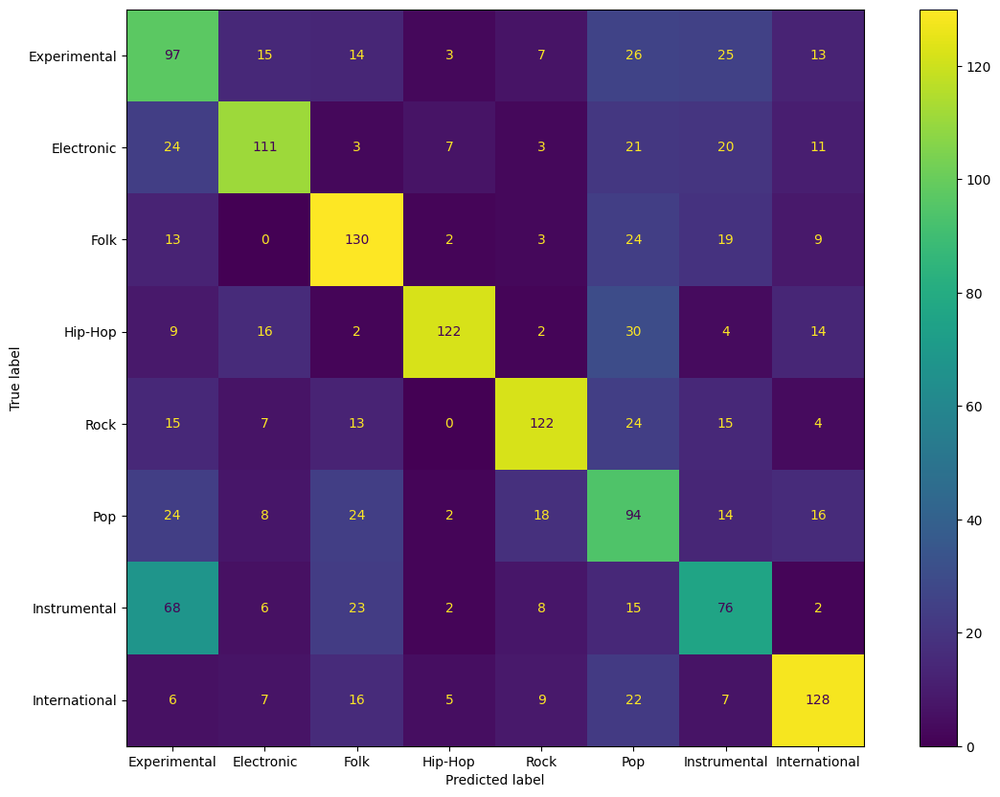

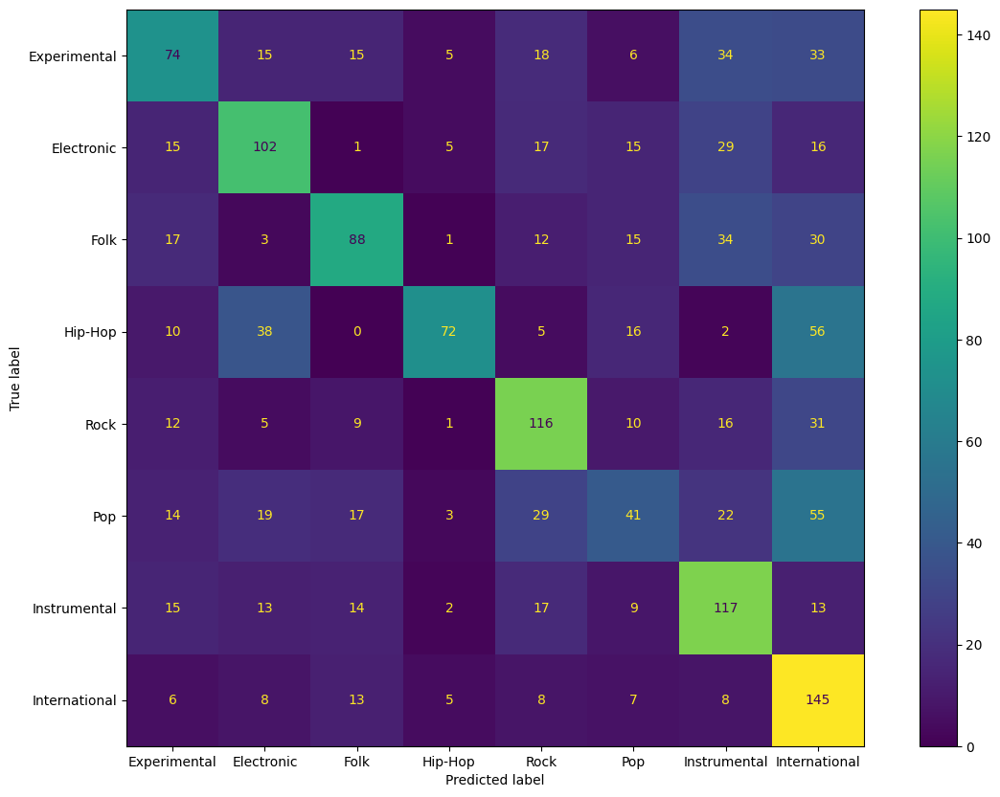

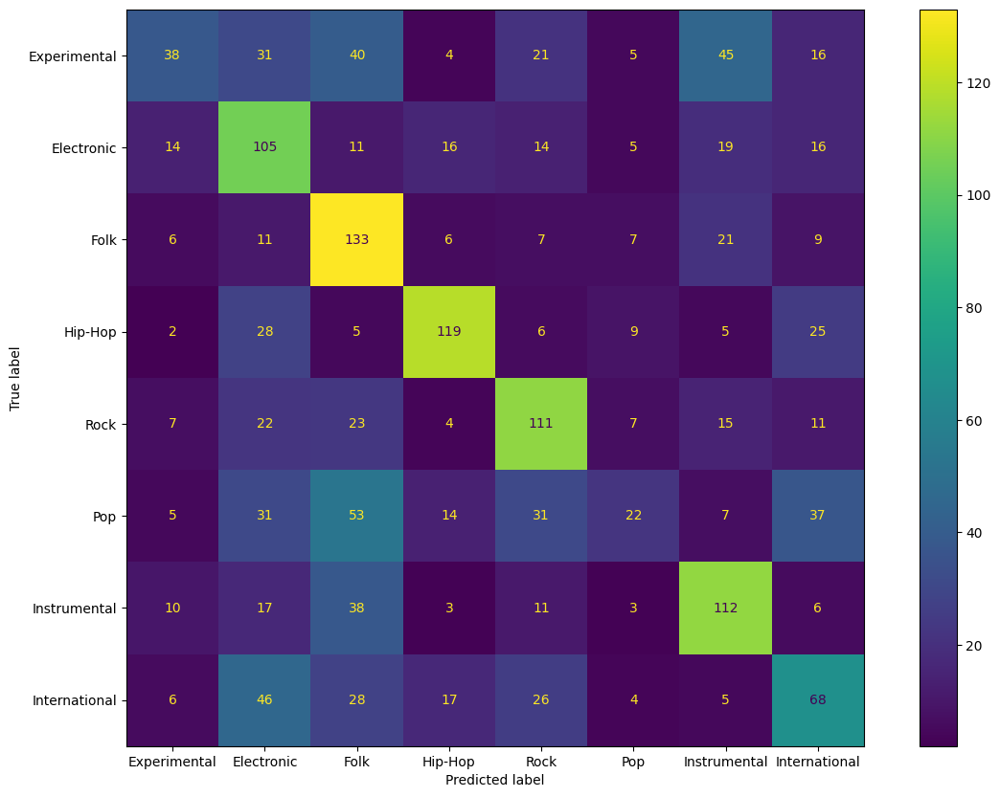

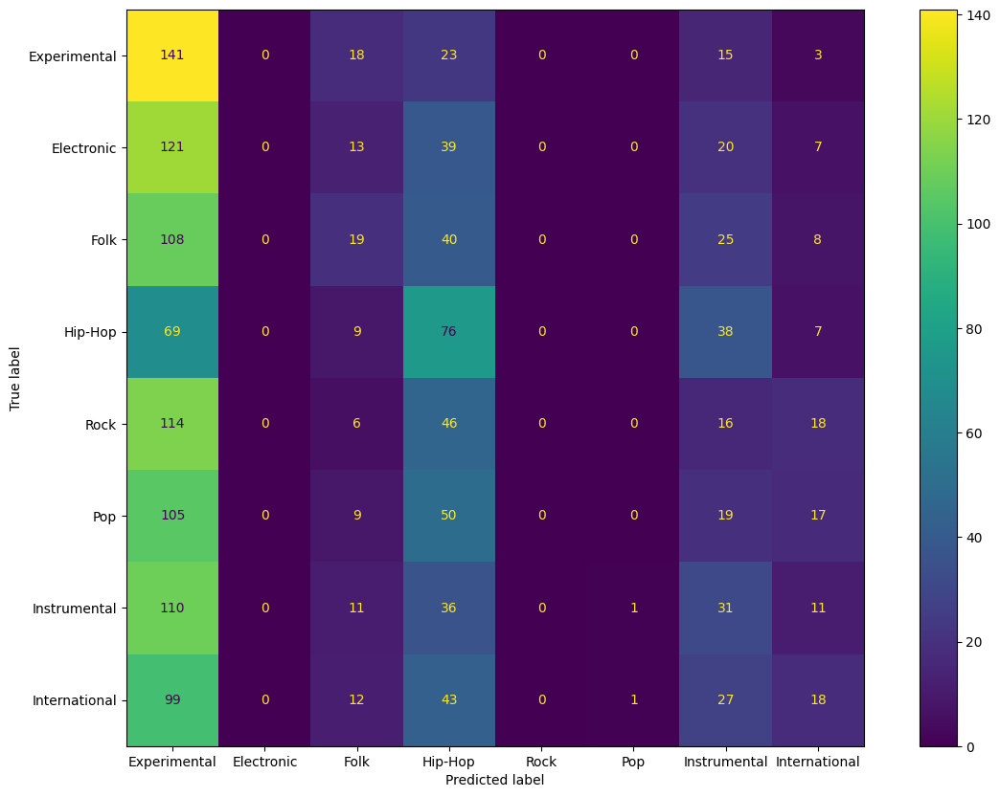

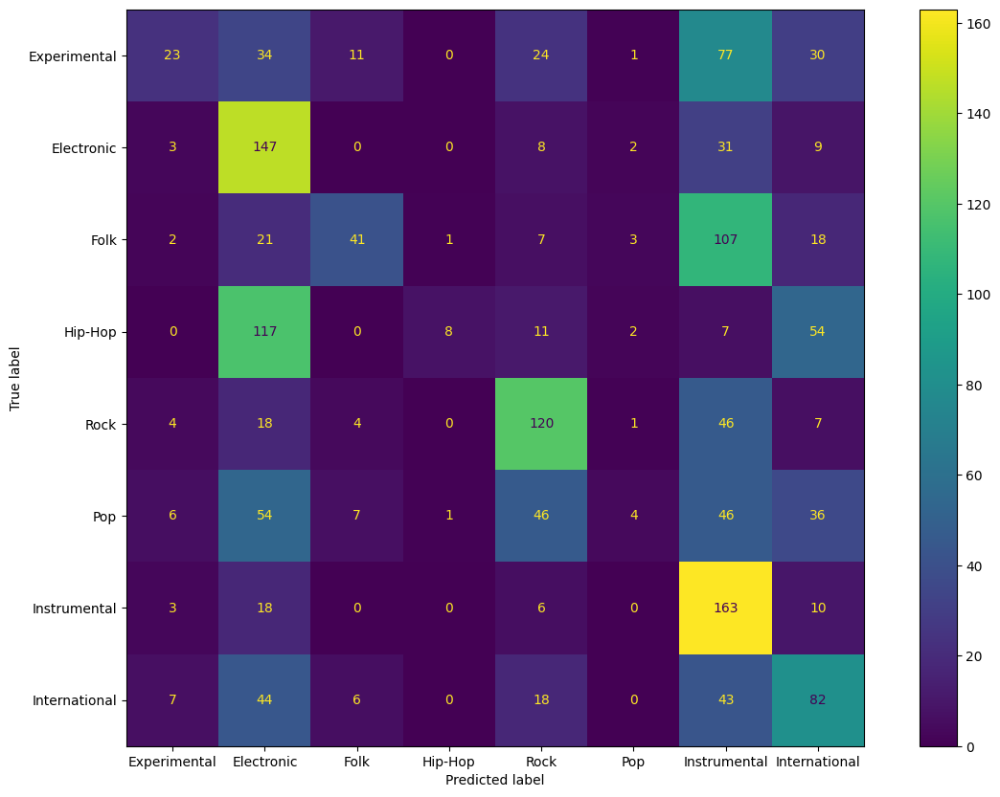

...

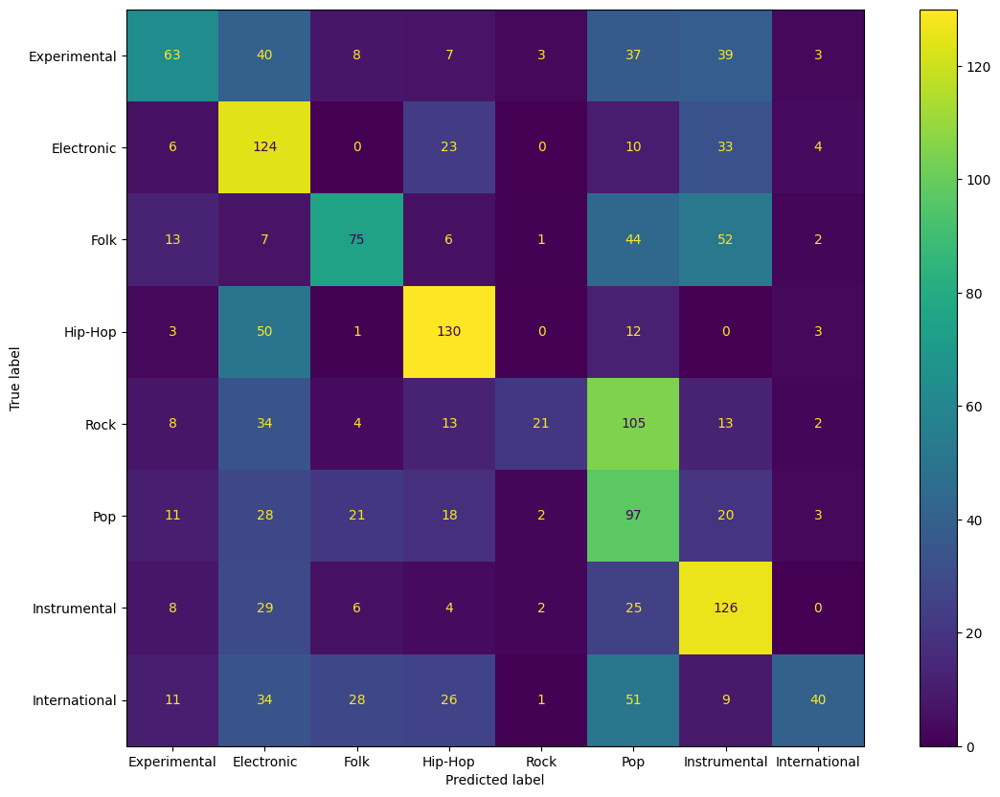

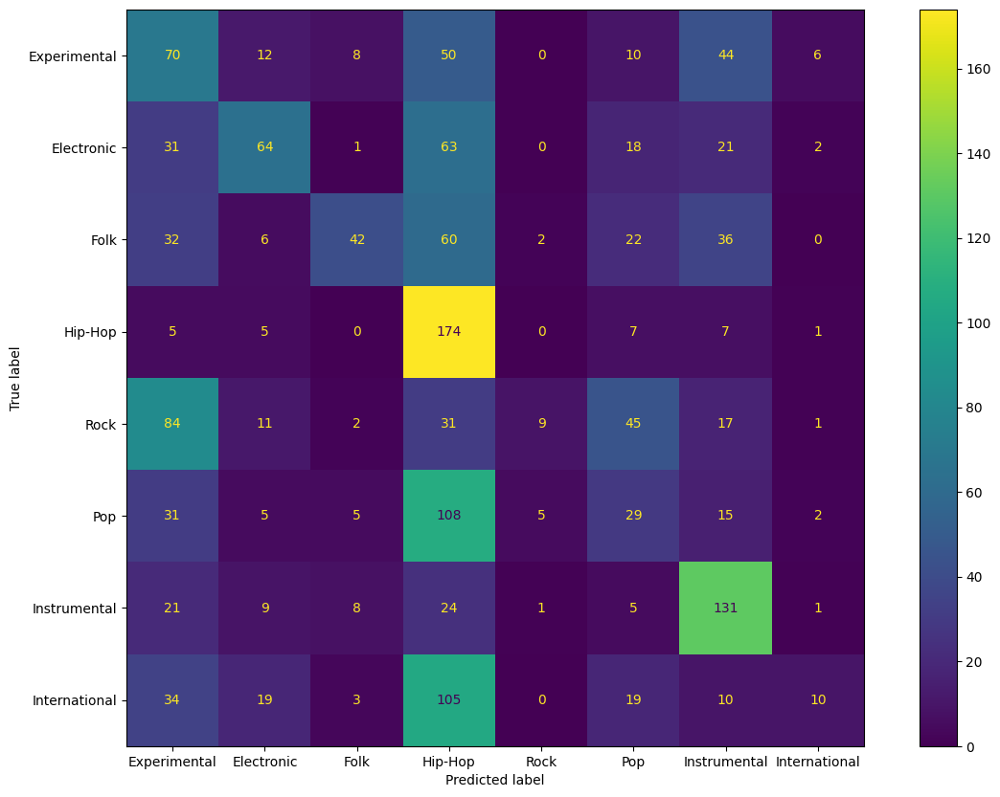

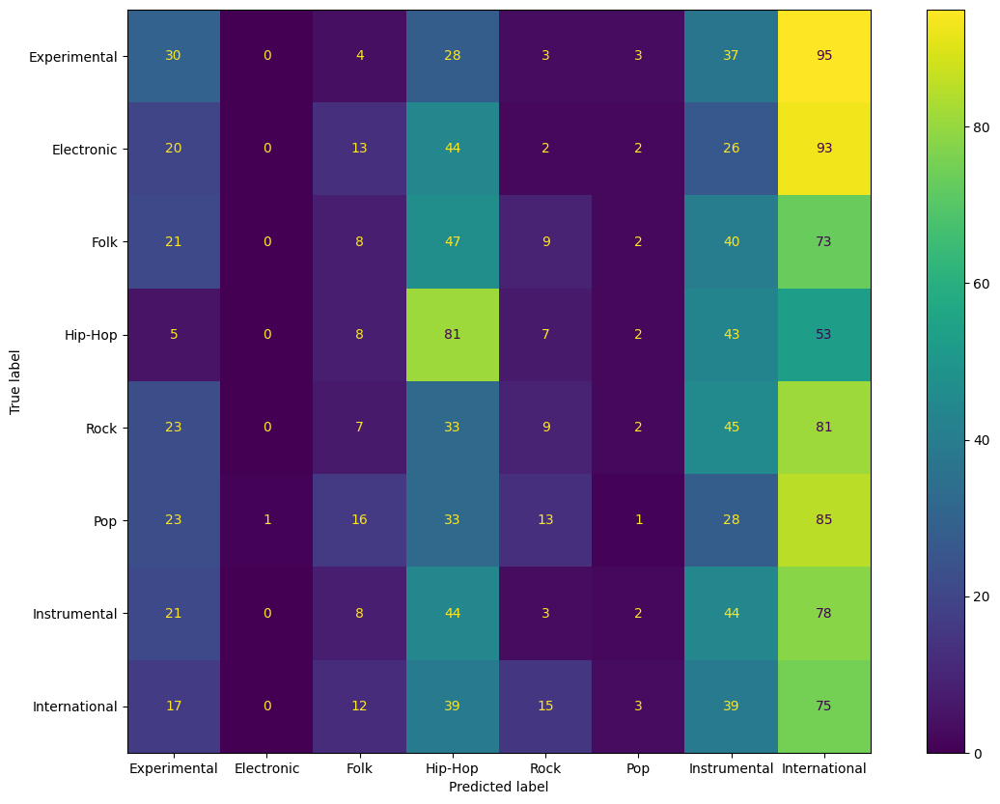

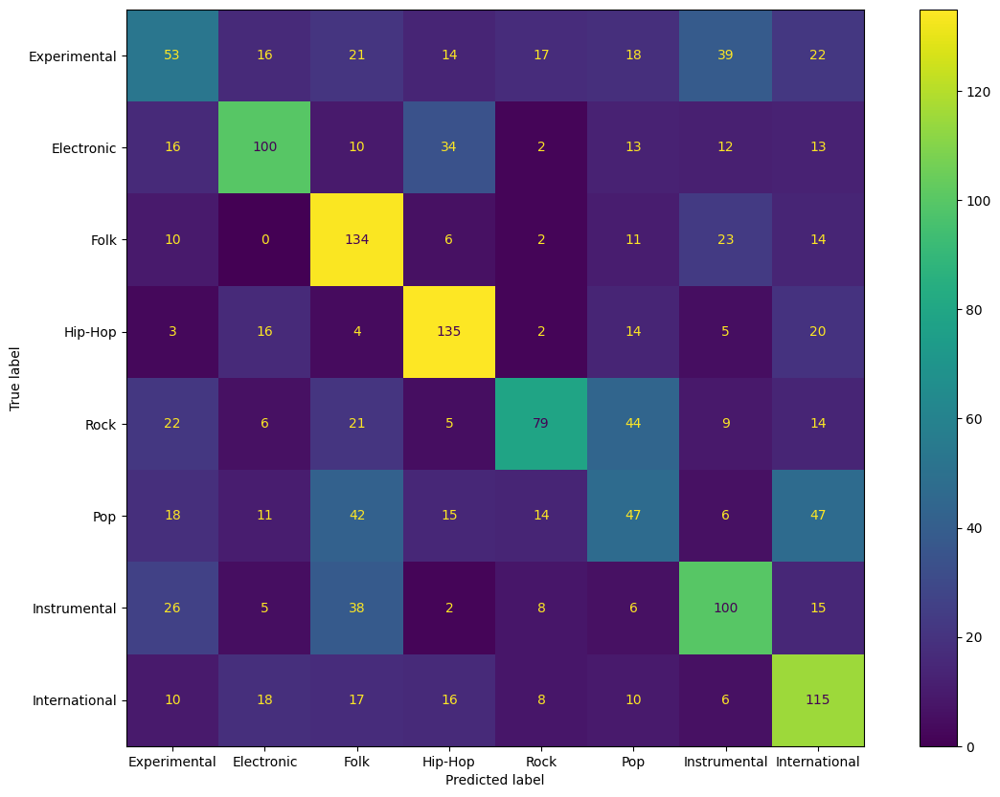

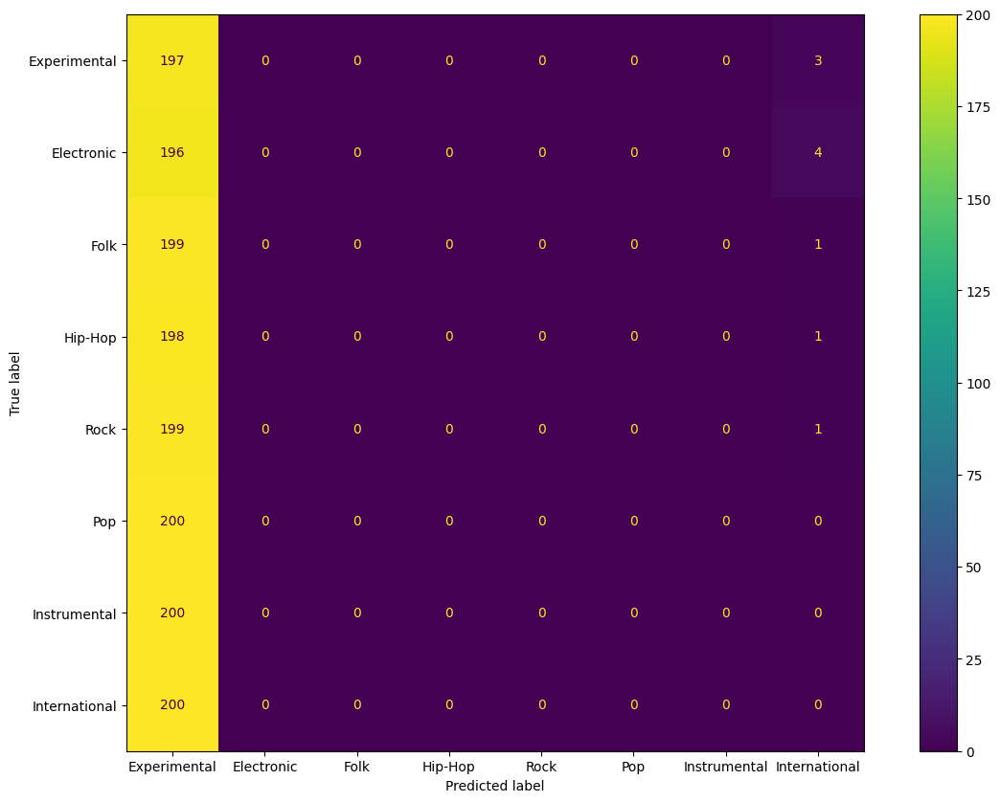

In [ ]:
from aeon.classification.deep_learning import InceptionTimeClassifier

# for each feature, train a model and evaluate it
for norm in [False, True]:
    for feature in features:
        log(f"-"*50)
        norm_text = "normalized" if norm else "original"
        log(f"Training model for feature: {feature}_{norm_text}")

        X_train, y_train, X_test, y_test = get_dataset(train_df, test_df, val_df, feature, norm)

        model = InceptionTimeClassifier(n_epochs=20,batch_size=32, verbose=True)
        time_inception_report[f'{feature}_{norm_text}'] = fit_and_evaluate(X_train, y_train, X_test, y_test, model)

### All features

--------------------------------------------------
Training model for feature: ALL_original


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_160 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_30    │ (None, 1291, 166) │          0 │ input_layer_5[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_161 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_160[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_162 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_160[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_163 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_160[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_164 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_30… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_30      │ (None, 1291, 128) │          0 │ conv1d_161[0][0], │
│ (Concatenate)       │                   │            │ conv1d_162[0][0], │
│                     │                   │            │ conv1d_163[0][0], │
│                     │                   │            │ conv1d_164[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_30[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_40       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_165 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_40[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_31    │ (None, 1291, 128) │          0 │ activation_40[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_166 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_165[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_167 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_165[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_168 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_165[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_169 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_31… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_31      │ (None, 1291, 128) │          0 │ conv1d_166[0][0], │
│ (Concatenate)       │                   │            │ conv1d_167[0][0], │
│                     │                   │            │ conv1d_168[0][0], │
│                     │                   │            │ conv1d_169[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_31[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_41       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - accuracy: 0.3382 - loss: 1.8377 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.4206 - loss: 1.5798 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.4408 - loss: 1.5121 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - accuracy: 0.4641 - loss: 1.4665 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step - accuracy: 0.4758 - loss: 1.4226 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.5011 - loss: 1.3819 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.5125 - loss: 1.3434 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.5281 - loss: 1.3051 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.5357 - loss: 1.2787 - learning_rate:

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_192 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_36    │ (None, 1291, 166) │          0 │ input_layer_6[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_193 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_192[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_194 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_192[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_195 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_192[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_196 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_36… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_36      │ (None, 1291, 128) │          0 │ conv1d_193[0][0], │
│ (Concatenate)       │                   │            │ conv1d_194[0][0], │
│                     │                   │            │ conv1d_195[0][0], │
│                     │                   │            │ conv1d_196[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_36[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_48       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_197 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_48[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_37    │ (None, 1291, 128) │          0 │ activation_48[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_198 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_197[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_199 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_197[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_200 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_197[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_201 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_37… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_37      │ (None, 1291, 128) │          0 │ conv1d_198[0][0], │
│ (Concatenate)       │                   │            │ conv1d_199[0][0], │
│                     │                   │            │ conv1d_200[0][0], │
│                     │                   │            │ conv1d_201[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_37[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_49       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - accuracy: 0.3493 - loss: 1.8027 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - accuracy: 0.4386 - loss: 1.5668 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step - accuracy: 0.4637 - loss: 1.4986 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - accuracy: 0.4823 - loss: 1.4539 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step - accuracy: 0.5047 - loss: 1.4091 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.5141 - loss: 1.3705 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step - accuracy: 0.5291 - loss: 1.3351 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - accuracy: 0.5368 - loss: 1.3008 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step - accuracy: 0.5591 - loss: 1.2631 - learning_rate:

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_224 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_42    │ (None, 1291, 166) │          0 │ input_layer_7[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_225 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_224[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_226 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_224[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_227 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_224[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_228 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_42… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_42      │ (None, 1291, 128) │          0 │ conv1d_225[0][0], │
│ (Concatenate)       │                   │            │ conv1d_226[0][0], │
│                     │                   │            │ conv1d_227[0][0], │
│                     │                   │            │ conv1d_228[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_42[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_56       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_229 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_56[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_43    │ (None, 1291, 128) │          0 │ activation_56[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_230 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_229[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_231 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_229[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_232 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_229[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_233 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_43… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_43      │ (None, 1291, 128) │          0 │ conv1d_230[0][0], │
│ (Concatenate)       │                   │            │ conv1d_231[0][0], │
│                     │                   │            │ conv1d_232[0][0], │
│                     │                   │            │ conv1d_233[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_43[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_57       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - accuracy: 0.3162 - loss: 1.8201 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.4146 - loss: 1.6000 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.4585 - loss: 1.5202 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.4725 - loss: 1.4628 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.4944 - loss: 1.4116 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.5170 - loss: 1.3681 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.5308 - loss: 1.3252 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step - accuracy: 0.5438 - loss: 1.2870 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.5509 - loss: 1.2571 - learning_rate:

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_256 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_8[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_48    │ (None, 1291, 166) │          0 │ input_layer_8[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_257 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_256[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_258 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_256[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_259 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_256[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_260 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_48… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_48      │ (None, 1291, 128) │          0 │ conv1d_257[0][0], │
│ (Concatenate)       │                   │            │ conv1d_258[0][0], │
│                     │                   │            │ conv1d_259[0][0], │
│                     │                   │            │ conv1d_260[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_48[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_64       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_261 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_64[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_49    │ (None, 1291, 128) │          0 │ activation_64[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_262 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_261[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_263 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_261[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_264 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_261[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_265 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_49… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_49      │ (None, 1291, 128) │          0 │ conv1d_262[0][0], │
│ (Concatenate)       │                   │            │ conv1d_263[0][0], │
│                     │                   │            │ conv1d_264[0][0], │
│                     │                   │            │ conv1d_265[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_49[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_65       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - accuracy: 0.3374 - loss: 1.8217 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.4180 - loss: 1.5919 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step - accuracy: 0.4409 - loss: 1.5194 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - accuracy: 0.4558 - loss: 1.4709 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - accuracy: 0.4716 - loss: 1.4317 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.4900 - loss: 1.3922 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.5089 - loss: 1.3495 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step - accuracy: 0.5210 - loss: 1.3149 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.5351 - loss: 1.2826 - learning_rate:

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_288 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_9[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_54    │ (None, 1291, 166) │          0 │ input_layer_9[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_289 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_288[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_290 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_288[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_291 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_288[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_292 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_54… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_54      │ (None, 1291, 128) │          0 │ conv1d_289[0][0], │
│ (Concatenate)       │                   │            │ conv1d_290[0][0], │
│                     │                   │            │ conv1d_291[0][0], │
│                     │                   │            │ conv1d_292[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_54[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_72       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_293 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_72[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_55    │ (None, 1291, 128) │          0 │ activation_72[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_294 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_293[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_295 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_293[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_296 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_293[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_297 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_55… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_55      │ (None, 1291, 128) │          0 │ conv1d_294[0][0], │
│ (Concatenate)       │                   │            │ conv1d_295[0][0], │
│                     │                   │            │ conv1d_296[0][0], │
│                     │                   │            │ conv1d_297[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_55[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_73       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - accuracy: 0.3481 - loss: 1.7927 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.4399 - loss: 1.5649 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.4676 - loss: 1.4975 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - accuracy: 0.4815 - loss: 1.4504 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.5006 - loss: 1.4133 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - accuracy: 0.5206 - loss: 1.3715 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.5364 - loss: 1.3389 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.5425 - loss: 1.3058 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.5530 - loss: 1.2720 - learning_rate:

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_320 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_10[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_60    │ (None, 1291, 166) │          0 │ input_layer_10[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_321 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_320[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_322 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_320[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_323 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_320[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_324 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_60… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_60      │ (None, 1291, 128) │          0 │ conv1d_321[0][0], │
│ (Concatenate)       │                   │            │ conv1d_322[0][0], │
│                     │                   │            │ conv1d_323[0][0], │
│                     │                   │            │ conv1d_324[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_60[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_80       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_325 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_80[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_61    │ (None, 1291, 128) │          0 │ activation_80[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_326 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_325[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_327 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_325[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_328 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_325[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_329 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_61… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_61      │ (None, 1291, 128) │          0 │ conv1d_326[0][0], │
│ (Concatenate)       │                   │            │ conv1d_327[0][0], │
│                     │                   │            │ conv1d_328[0][0], │
│                     │                   │            │ conv1d_329[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_61[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_81       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.1513 - loss: 2.0944 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1821 - loss: 2.0014 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2023 - loss: 1.9662 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2136 - loss: 1.9406 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2142 - loss: 1.9211 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2212 - loss: 1.9073 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.2285 - loss: 1.8912 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2351 - loss: 1.8844 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2368 - loss: 1.8708 - learning_rate: 0.0010


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_352 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_11[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_66    │ (None, 1291, 166) │          0 │ input_layer_11[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_353 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_352[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_354 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_352[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_355 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_352[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_356 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_66… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_66      │ (None, 1291, 128) │          0 │ conv1d_353[0][0], │
│ (Concatenate)       │                   │            │ conv1d_354[0][0], │
│                     │                   │            │ conv1d_355[0][0], │
│                     │                   │            │ conv1d_356[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_66[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_88       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_357 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_88[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_67    │ (None, 1291, 128) │          0 │ activation_88[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_358 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_357[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_359 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_357[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_360 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_357[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_361 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_67… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_67      │ (None, 1291, 128) │          0 │ conv1d_358[0][0], │
│ (Concatenate)       │                   │            │ conv1d_359[0][0], │
│                     │                   │            │ conv1d_360[0][0], │
│                     │                   │            │ conv1d_361[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_67[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_89       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.1385 - loss: 2.0927 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - accuracy: 0.1747 - loss: 2.0190 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - accuracy: 0.1858 - loss: 1.9947 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1828 - loss: 1.9806 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1942 - loss: 1.9676 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.1985 - loss: 1.9542 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.2076 - loss: 1.9469 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2117 - loss: 1.9361 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2158 - loss: 1.9296 - learning_rate: 0.0010

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_384 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_12[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_72    │ (None, 1291, 166) │          0 │ input_layer_12[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_385 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_384[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_386 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_384[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_387 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_384[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_388 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_72… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_72      │ (None, 1291, 128) │          0 │ conv1d_385[0][0], │
│ (Concatenate)       │                   │            │ conv1d_386[0][0], │
│                     │                   │            │ conv1d_387[0][0], │
│                     │                   │            │ conv1d_388[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_72[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_96       │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_389 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_96[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_73    │ (None, 1291, 128) │          0 │ activation_96[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_390 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_389[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_391 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_389[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_392 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_389[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_393 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_73… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_73      │ (None, 1291, 128) │          0 │ conv1d_390[0][0], │
│ (Concatenate)       │                   │            │ conv1d_391[0][0], │
│                     │                   │            │ conv1d_392[0][0], │
│                     │                   │            │ conv1d_393[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_73[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_97       │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.1581 - loss: 2.0761 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1985 - loss: 1.9914 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2157 - loss: 1.9604 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2254 - loss: 1.9340 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.2317 - loss: 1.9137 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2324 - loss: 1.9016 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2451 - loss: 1.8877 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2550 - loss: 1.8771 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2554 - loss: 1.8675 - learning_rate: 0.0010


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_416 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_13[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_78    │ (None, 1291, 166) │          0 │ input_layer_13[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_417 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_416[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_418 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_416[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_419 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_416[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_420 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_78… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_78      │ (None, 1291, 128) │          0 │ conv1d_417[0][0], │
│ (Concatenate)       │                   │            │ conv1d_418[0][0], │
│                     │                   │            │ conv1d_419[0][0], │
│                     │                   │            │ conv1d_420[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_78[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_104      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_421 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_104[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_79    │ (None, 1291, 128) │          0 │ activation_104[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_422 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_421[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_423 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_421[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_424 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_421[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_425 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_79… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_79      │ (None, 1291, 128) │          0 │ conv1d_422[0][0], │
│ (Concatenate)       │                   │            │ conv1d_423[0][0], │
│                     │                   │            │ conv1d_424[0][0], │
│                     │                   │            │ conv1d_425[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_79[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_105      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.1522 - loss: 2.0912 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.1942 - loss: 1.9723 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.2217 - loss: 1.9388 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2276 - loss: 1.9092 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2392 - loss: 1.8910 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2484 - loss: 1.8744 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - accuracy: 0.2486 - loss: 1.8664 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2534 - loss: 1.8590 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - accuracy: 0.2564 - loss: 1.8518 - learning_rate: 0.0010


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, 1291, 166) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_448 (Conv1D) │ (None, 1291, 32)  │      5,312 │ input_layer_14[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_84    │ (None, 1291, 166) │          0 │ input_layer_14[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_449 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_448[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_450 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_448[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_451 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_448[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_452 (Conv1D) │ (None, 1291, 32)  │      5,312 │ max_pooling1d_84… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_84      │ (None, 1291, 128) │          0 │ conv1d_449[0][0], │
│ (Concatenate)       │                   │            │ conv1d_450[0][0], │
│                     │                   │            │ conv1d_451[0][0], │
│                     │                   │            │ conv1d_452[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_84[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_112      │ (None, 1291, 128) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_453 (Conv1D) │ (None, 1291, 32)  │      4,096 │ activation_112[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_85    │ (None, 1291, 128) │          0 │ activation_112[0… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_454 (Conv1D) │ (None, 1291, 32)  │     40,960 │ conv1d_453[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_455 (Conv1D) │ (None, 1291, 32)  │     20,480 │ conv1d_453[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_456 (Conv1D) │ (None, 1291, 32)  │     10,240 │ conv1d_453[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_457 (Conv1D) │ (None, 1291, 32)  │      4,096 │ max_pooling1d_85… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_85      │ (None, 1291, 128) │          0 │ conv1d_454[0][0], │
│ (Concatenate)       │                   │            │ conv1d_455[0][0], │
│                     │                   │            │ conv1d_456[0][0], │
│                     │                   │            │ conv1d_457[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1291, 128) │        512 │ concatenate_85[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_113      │ (None, 1291, 128) │          0 │ batch_normalizat

 Total params: 524,424 (2.00 MB)

 Trainable params: 522,376 (1.99 MB)

 Non-trainable params: 2,048 (8.00 KB)

Epoch 1/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.1648 - loss: 2.0657 - learning_rate: 0.0010
Epoch 2/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.2039 - loss: 1.9672 - learning_rate: 0.0010
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2092 - loss: 1.9375 - learning_rate: 0.0010
Epoch 4/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.2206 - loss: 1.9208 - learning_rate: 0.0010
Epoch 5/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2273 - loss: 1.9043 - learning_rate: 0.0010
Epoch 6/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.2346 - loss: 1.8924 - learning_rate: 0.0010
Epoch 7/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2419 - loss: 1.8803 - learning_rate: 0.0010
Epoch 8/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - accuracy: 0.2444 - loss: 1.8673 - learning_rate: 0.0010
Epoch 9/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.2463 - loss: 1.8563 - learning_rate: 0.0010


/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

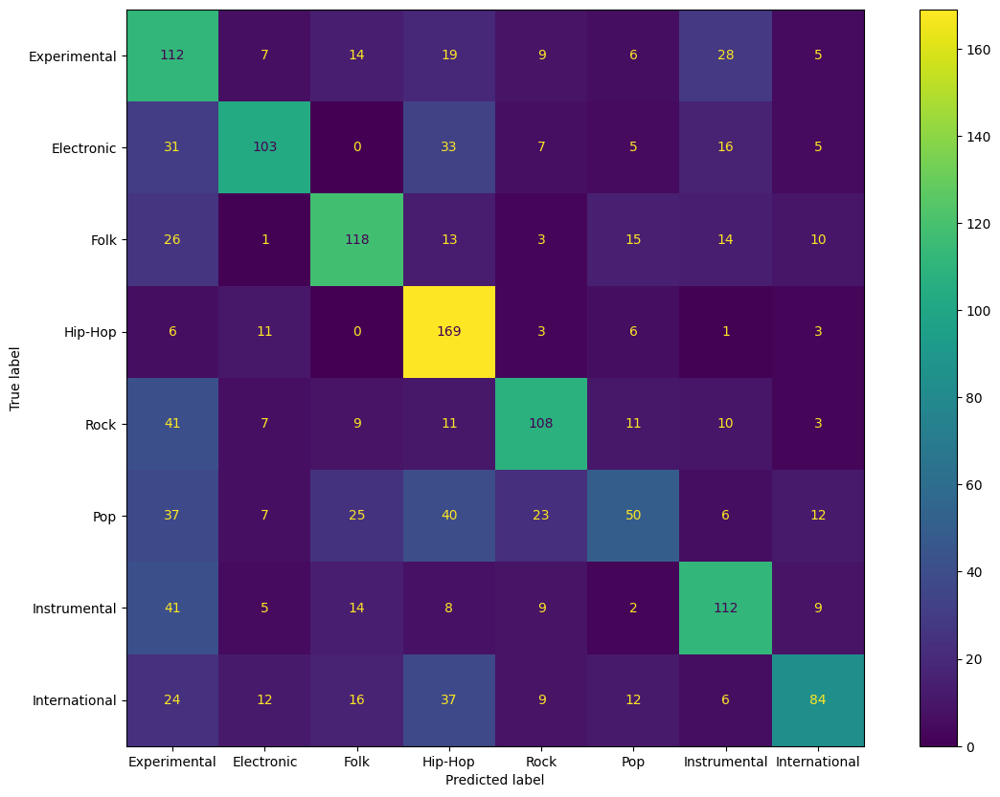

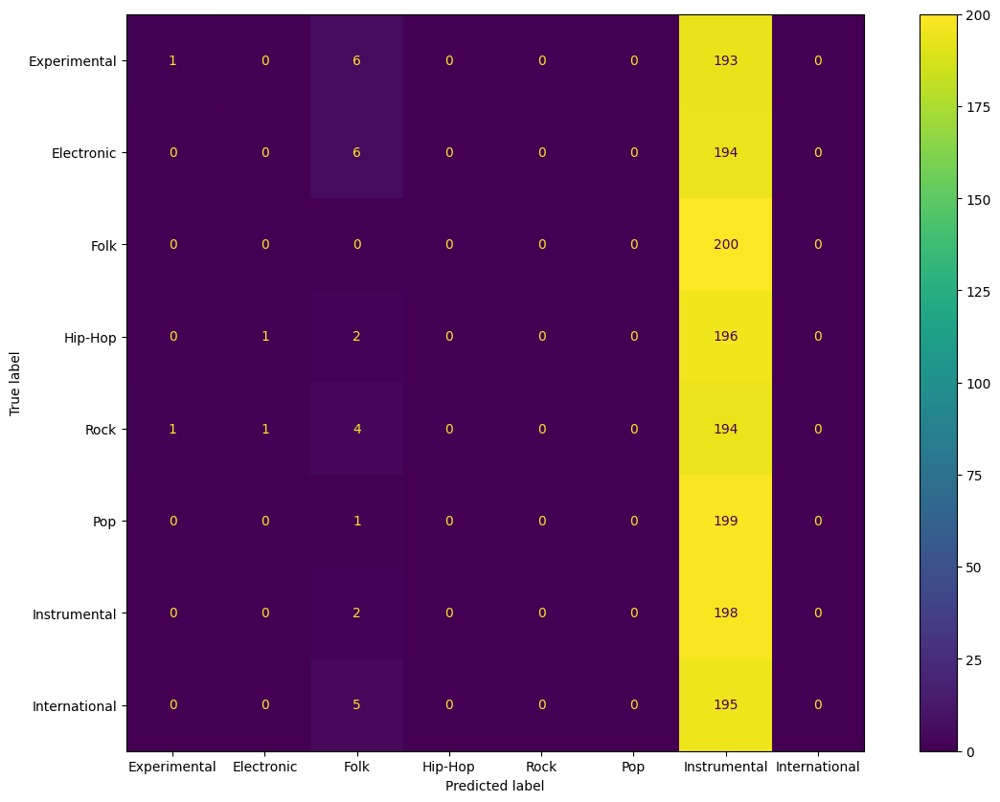

In [ ]:
for norm in [False, True]:
    log(f"-"*50)
    norm_text = "normalized" if norm else "original"
    log(f"Training model for feature: ALL_{norm_text}")

    X_train_all, y_train_all, X_test_all, y_test_all = get_dataset_all(train_df, test_df, val_df, features, norm)

    model = InceptionTimeClassifier(n_epochs=20,batch_size=32, verbose=True)
    time_inception_report[f'all_{norm_text}'] = fit_and_evaluate(X_train_all, y_train_all, X_test_all, y_test_all, model)

In [ ]:
report = pd.read_pickle('time_inception_report.pkl')
report

,mfcc_original,chroma_original,spectral_original,tempo_original,stft_original,mel_spectrogram_original,mfcc_normalized,chroma_normalized,spectral_normalized,tempo_normalized,stft_normalized,mel_spectrogram_normalized,all_original,all_normalized
Experimental,"{'precision': 0.3671875, 'recall': 0.47, 'f1-s...","{'precision': 0.3445378151260504, 'recall': 0....","{'precision': 0.3548387096774194, 'recall': 0....","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.3076923076923077, 'recall': 0....","{'precision': 0.3202614379084967, 'recall': 0....","{'precision': 0.3698630136986301, 'recall': 0....","{'precision': 0.2545931758530184, 'recall': 0....","{'precision': 0.1870967741935484, 'recall': 0....","{'precision': 0.058823529411764705, 'recall': ...","{'precision': 0.2883435582822086, 'recall': 0....","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ..."
Electronic,"{'precision': 0.5777777777777777, 'recall': 0....","{'precision': 0.5605095541401274, 'recall': 0....","{'precision': 0.40181268882175225, 'recall': 0...","{'precision': 0.1958762886597938, 'recall': 0....","{'precision': 0.5942028985507246, 'recall': 0....","{'precision': 0.4318181818181818, 'recall': 0....","{'precision': 0.6666666666666666, 'recall': 0....","{'precision': 0.5244755244755245, 'recall': 0....","{'precision': 0.6086956521739131, 'recall': 0....","{'precision': 0.10526315789473684, 'recall': 0...","{'precision': 0.46689895470383275, 'recall': 0...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ..."
Folk,"{'precision': 0.6529411764705882, 'recall': 0....","{'precision': 0.5024630541871922, 'recall': 0....","{'precision': 0.36082474226804123, 'recall': 0...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.32450331125827814, 'recall': 0...","{'precision': 0.5193370165745856, 'recall': 0....","{'precision': 0.580110497237569, 'recall': 0.5...","{'precision': 0.3583815028901734, 'recall': 0....","{'precision': 0.48854961832061067, 'recall': 0...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.5813953488372093, 'recall': 0....","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.5, 'recall': 0.005, 'f1-score'...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ..."
Hip-Hop,"{'precision': 0.37890625, 'recall': 0.485, 'f1...","{'precision': 0.4539877300613497, 'recall': 0....","{'precision': 0.4318181818181818, 'recall': 0....","{'precision': 0.16262975778546712, 'recall': 0...","{'precision': 0.4791666666666667, 'recall': 0....","{'precision': 0.33774834437086093, 'recall': 0...","{'precision': 0.3597122302158273, 'recall': 0....","{'precision': 0.5121951219512195, 'recall': 0....","{'precision': 0.22727272727272727, 'recall': 0...","{'precision': 0.1875, 'recall': 0.15, 'f1-scor...","{'precision': 0.33544303797468356, 'recall': 0...","{'precision': 0.12397734424166142, 'recall': 0...","{'precision': 1.0, 'recall': 0.005, 'f1-score'...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ..."
Rock,"{'precision': 0.7093023255813954, 'recall': 0....","{'precision': 0.5225225225225225, 'recall': 0....","{'precision': 0.4889867841409692, 'recall': 0....","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.5, 'recall': 0.6, 'f1-score': ...","{'precision': 0.41590214067278286, 'recall': 0...","{'precision': 0.5520361990950227, 'recall': 0....","{'precision': 0.7, 'recall': 0.105, 'f1-score'...","{'precision': 0.5294117647058824, 'recall': 0....","{'precision': 0.14754098360655737, 'recall': 0...","{'precision': 0.5984848484848485, 'recall': 0....","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ..."
Pop,"{'precision': 0.4222222222222222, 'recall': 0....","{'precision': 0.

In [ ]:
# save time_inception_report
time_inception_report_df = pd.DataFrame(time_inception_report)
time_inception_report_df.to_pickle('time_inception_report2.pkl')

## Detach-ROCKET (ou POCKET)

Detach-Rocket: https://github.com/gon-uri/detach_rocket

In [ ]:
log('Experiment: Detach-ROCKET')

Experiment: Detach-ROCKET


In [ ]:
detach_report = {}

### Using MFCC, Chroma and Spectral

In [ ]:
def plot_channel_relevance(model):
  x = range(1, model.num_channels + 1)
  channel_relevance = model.estimate_channel_relevance()

  plt.figure(figsize=(8,3.5))
  plt.bar(x, channel_relevance, color='C7', zorder=2)

  plt.title('Channel relevance estimation')
  plt.grid(True, linestyle='-', alpha=0.5, zorder=1)
  plt.xlabel('Channels')
  plt.ylabel('Relevance Estimation (arb. unit)')
  plt.show()

--------------------------------------------------
Training model for feature: mfcc_original
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 68.32%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 37.93
Train Accuraccy Detach Model: 57.65%
-------------------------
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 69.02%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 428.13
Train Accuraccy Detach Model: 58.98%
-------------------------
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 68.52%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 428.13
Train Accuraccy Detach Model: 63.05%
-------------------------
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 68.30%
-------------------------
TRAINING RESULTS 

/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/detach_rocket/detach_classes.py:610: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at ../aten/src/ATen/native/Copy.cpp:308.)
  self(torch.from_numpy(X[idxs]).float().to(self.device))


TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 47.77%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 37.93
Train Accuraccy Detach Model: 48.12%
-------------------------
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 48.69%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 37.93
Train Accuraccy Detach Model: 49.44%
-------------------------
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 48.07%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 37.93
Train Accuraccy Detach Model: 47.58%
-------------------------
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 47.94%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 37.93
Train Accuraccy Detach Model: 46.41%
----------

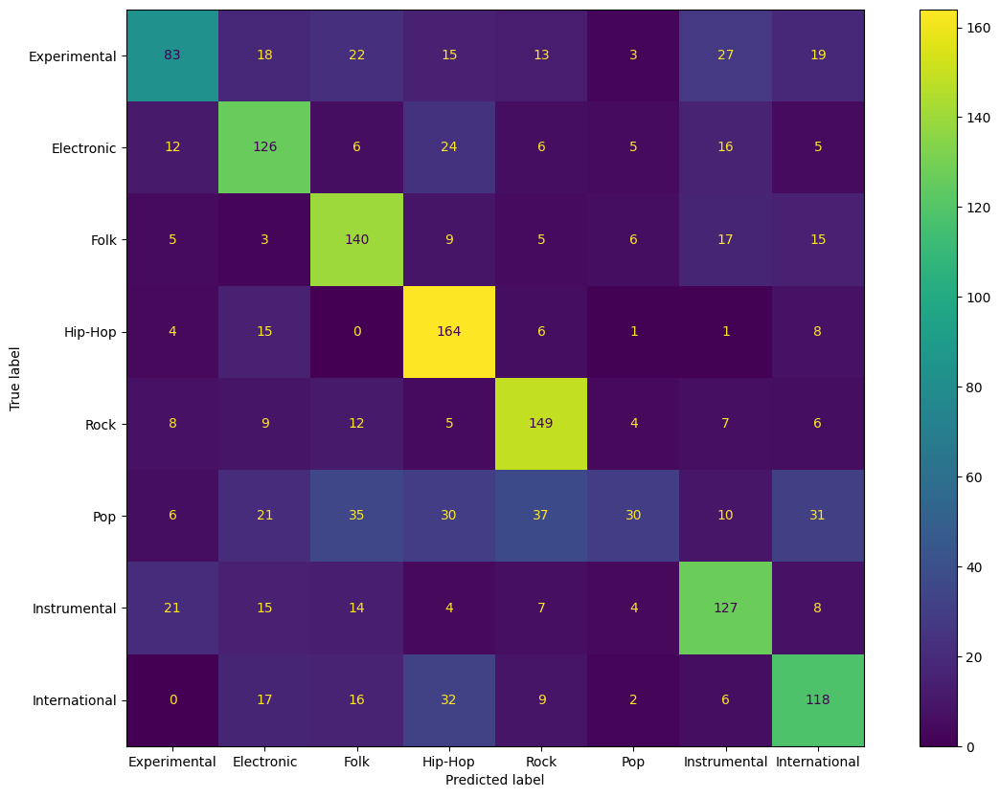

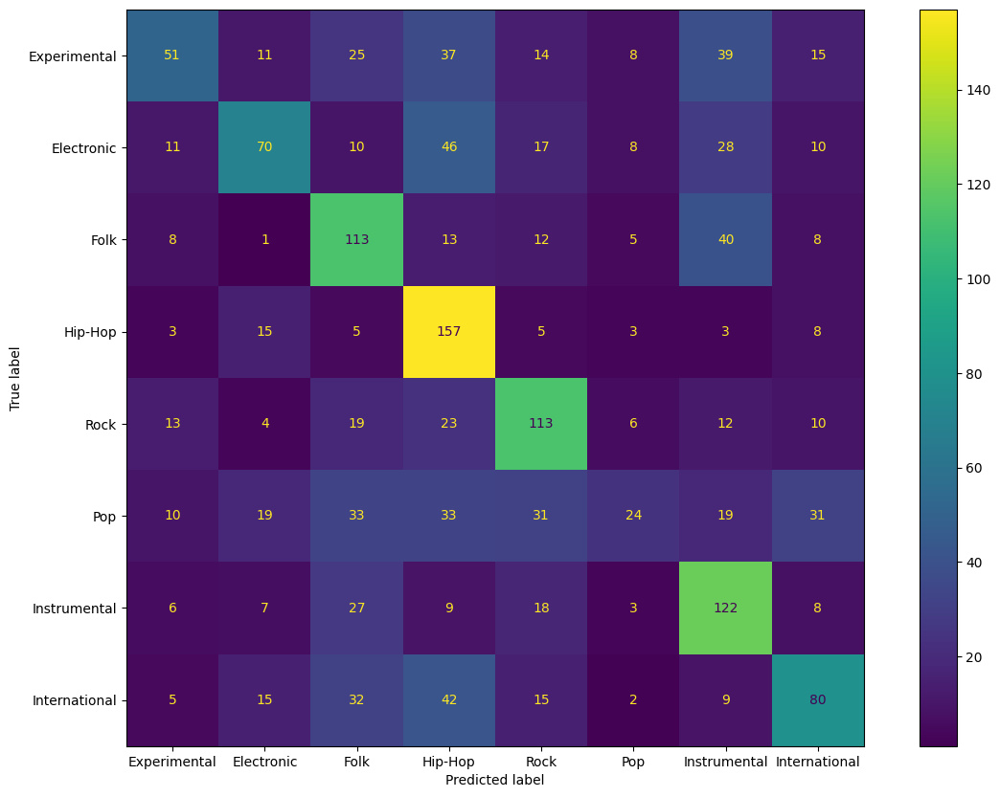

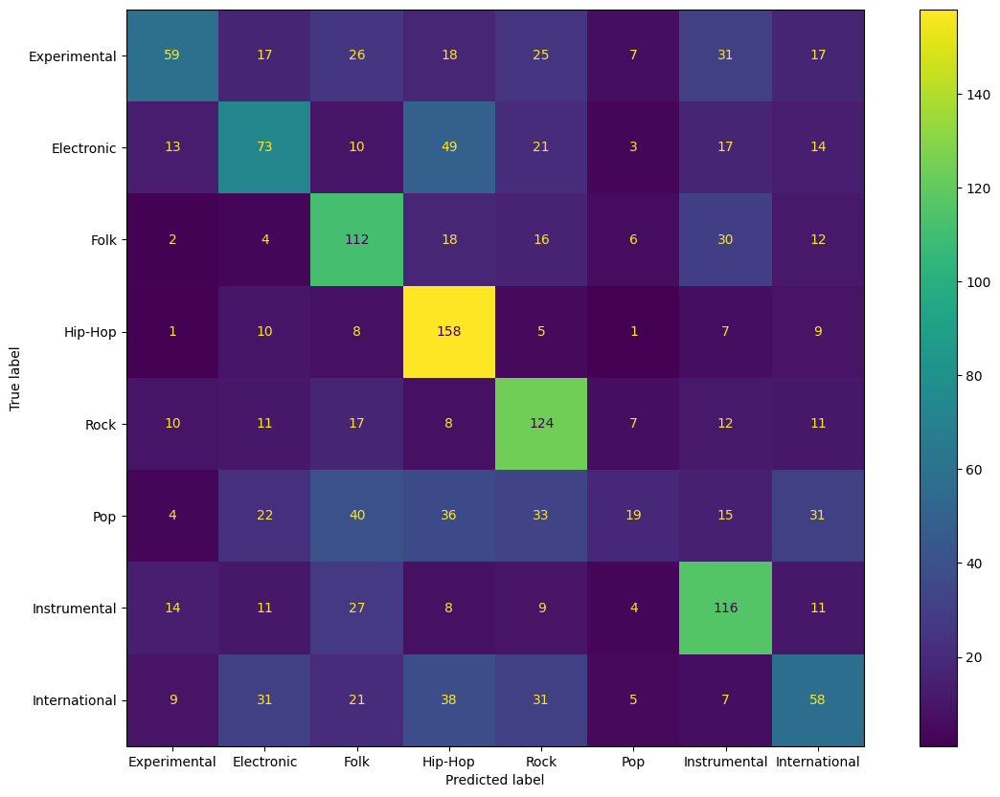

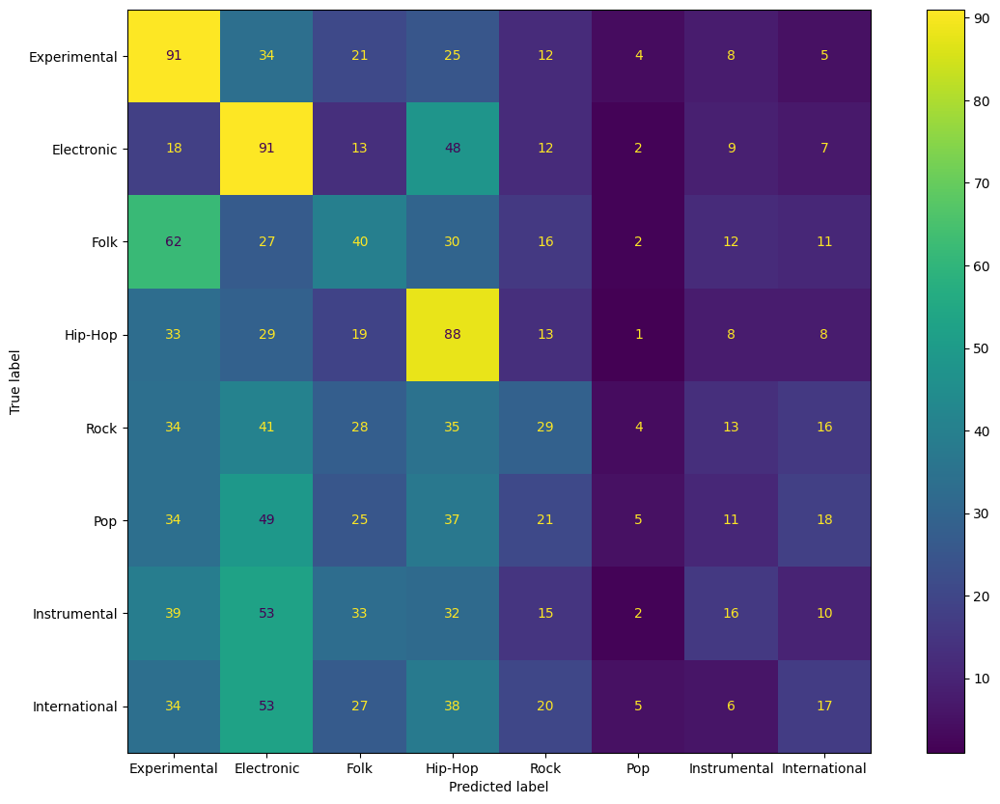

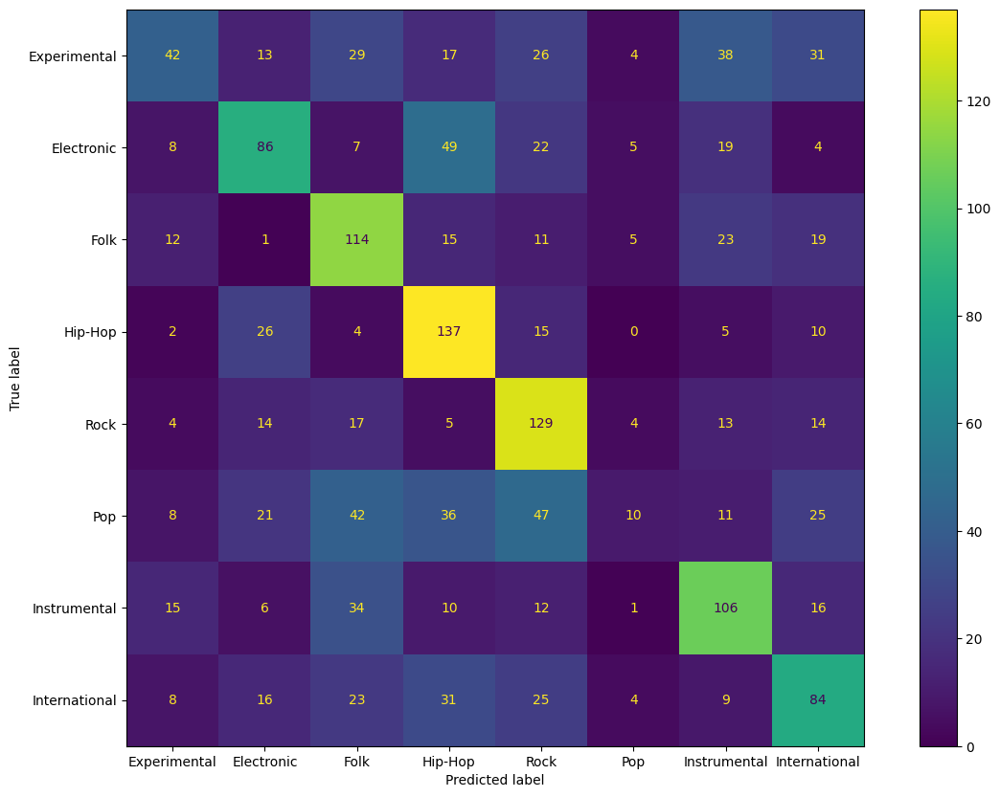

...

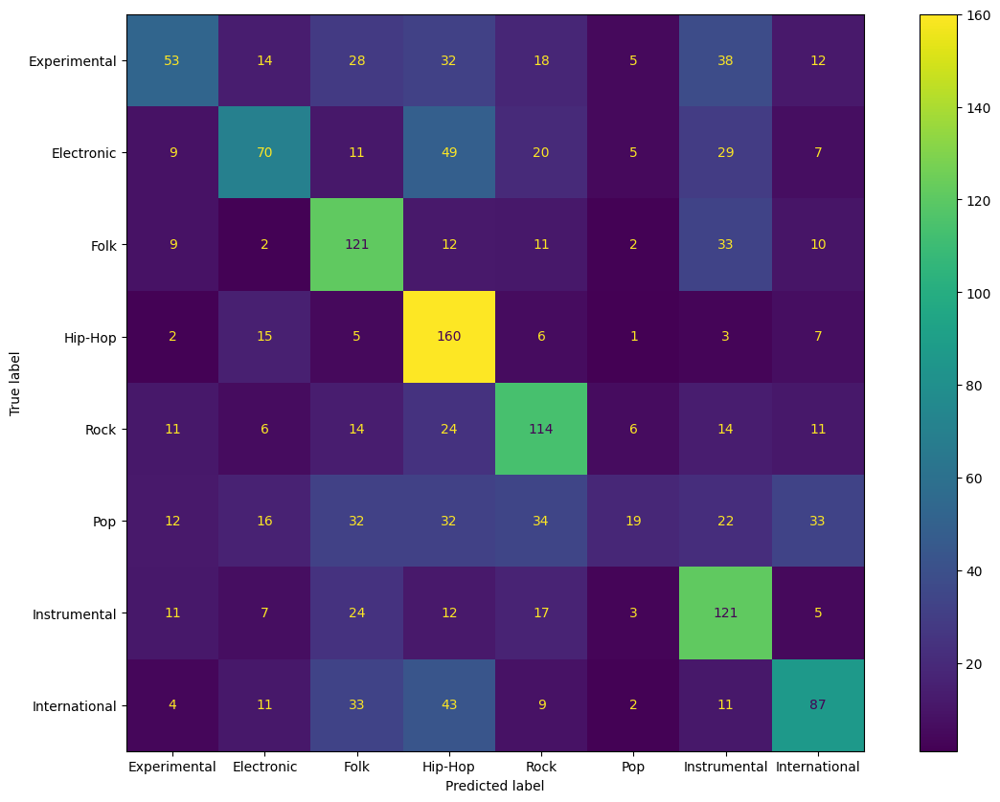

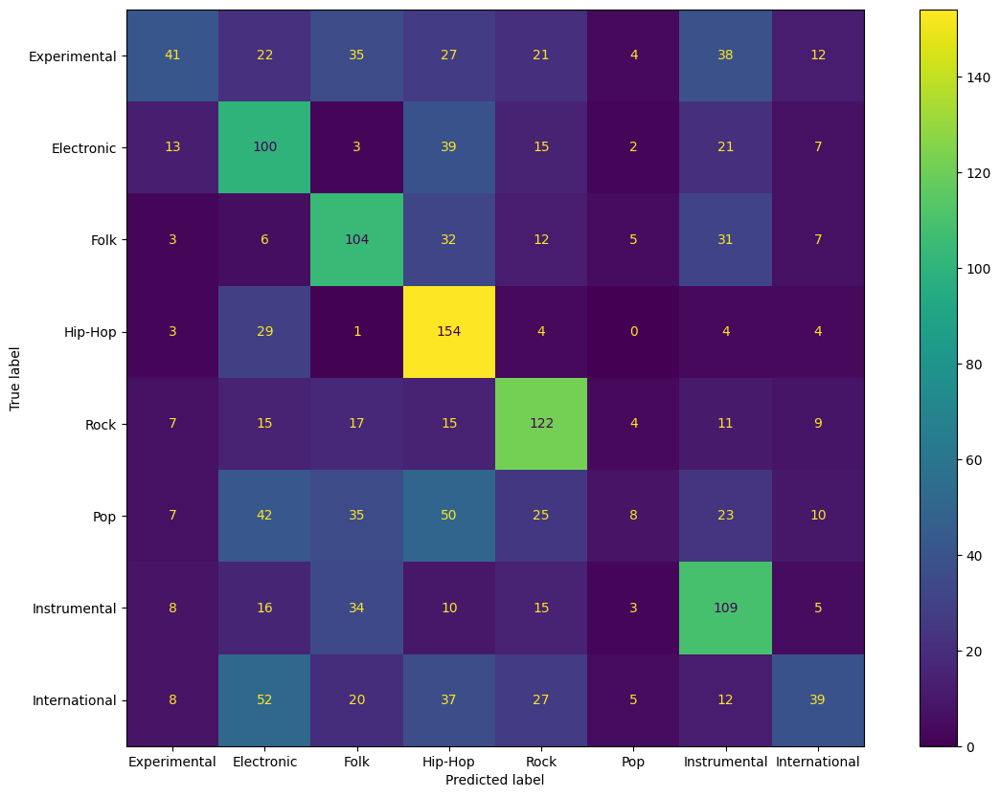

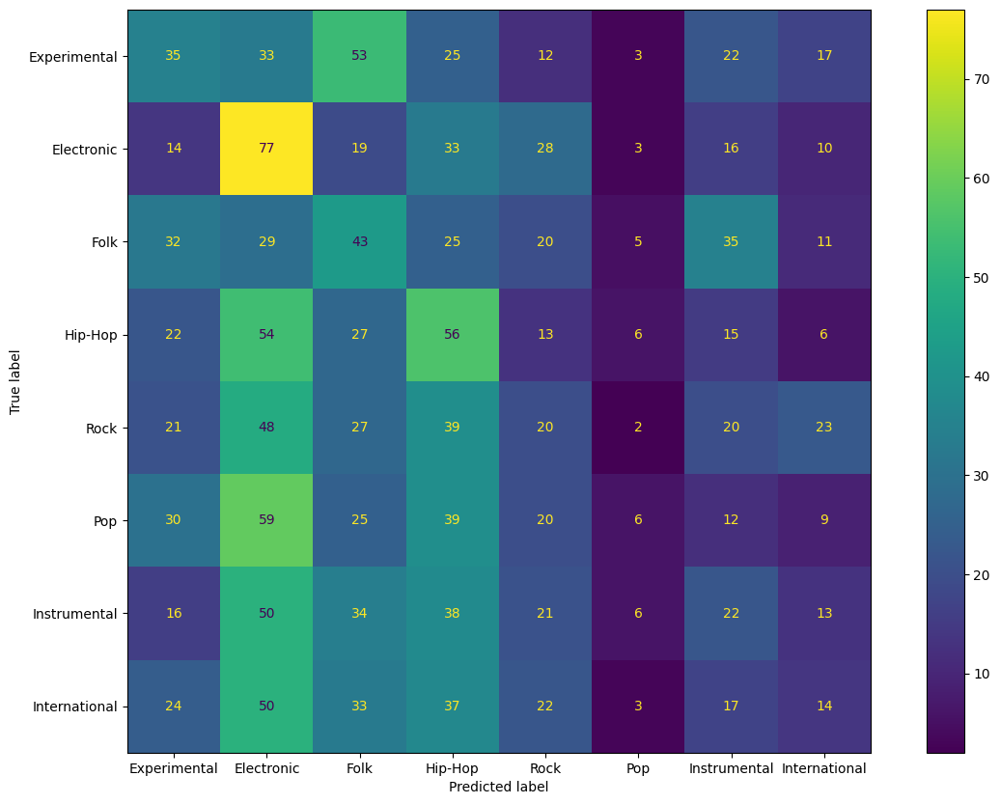

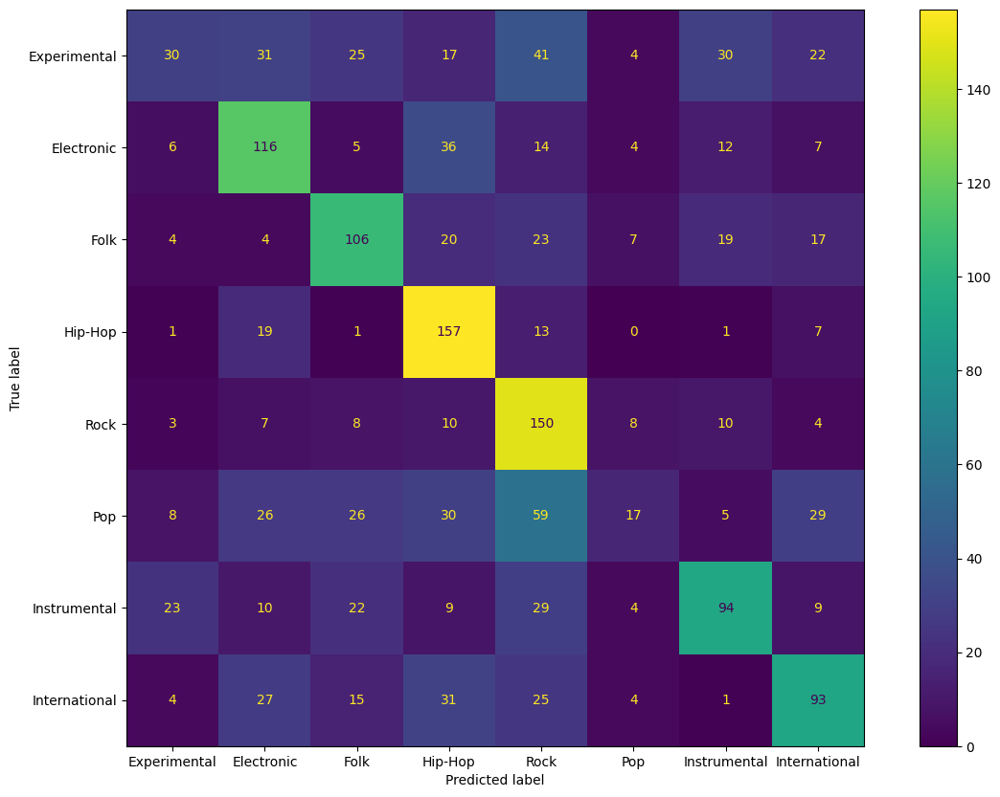

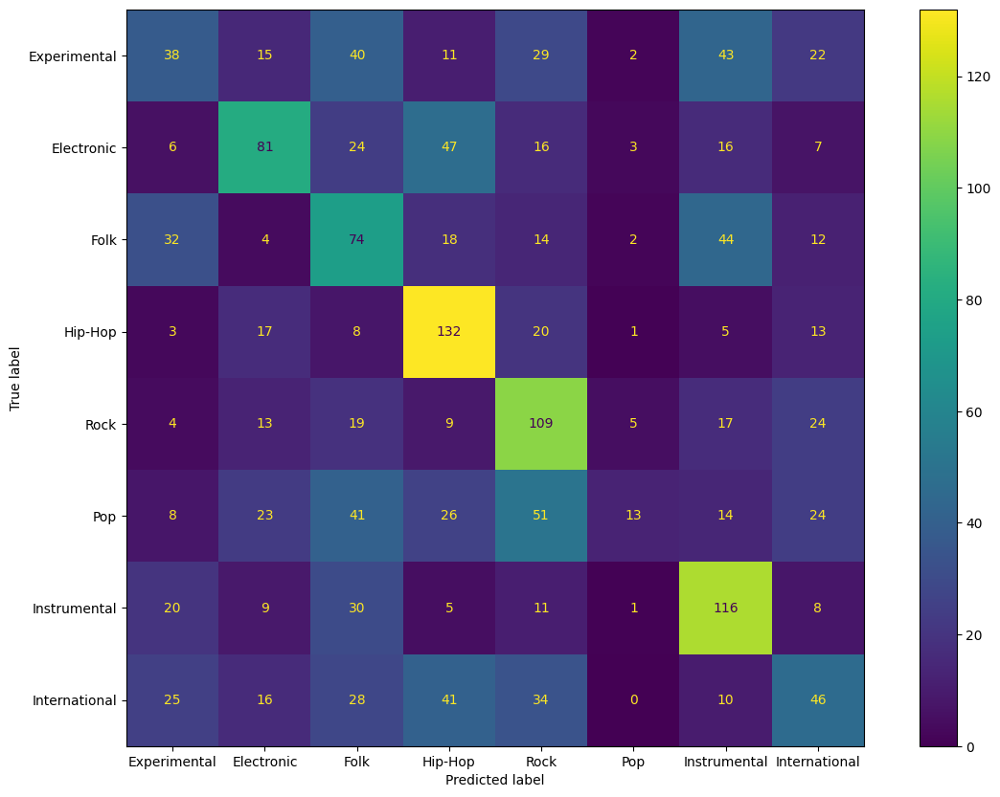

In [ ]:
# for each feature, train a model and evaluate it
for norm in [False, True]:
    for feature in features:
        log(f"-"*50)
        norm_text = "normalized" if norm else "original"
        log(f"Training model for feature: {feature}_{norm_text}")

        X_train, y_train, X_test, y_test = get_dataset(train_df, test_df, val_df, feature, norm)

        model = DetachEnsemble(model_type='pytorch_minirocket', num_models=15, num_kernels=1000)
        detach_report[f'{feature}_{norm_text}'] = fit_and_evaluate(X_train, y_train, X_test, y_test, model)
        # plot_channel_relevance(model)


### Using All features

--------------------------------------------------
Training model for feature: ALL_original


/home/enrique/miniconda3/envs/myenv/lib/python3.11/site-packages/detach_rocket/detach_classes.py:610: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at ../aten/src/ATen/native/Copy.cpp:308.)
  self(torch.from_numpy(X[idxs]).float().to(self.device))


TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 67.68%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 37.93
Train Accuraccy Detach Model: 58.48%
-------------------------
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 67.22%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 428.13
Train Accuraccy Detach Model: 61.09%
-------------------------
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 67.90%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 428.13
Train Accuraccy Detach Model: 59.55%
-------------------------
TRAINING RESULTS Full ROCKET:
Optimal Alpha Full ROCKET: 428.13
Train Accuraccy Full ROCKET: 66.66%
-------------------------
TRAINING RESULTS Detach Model:
Optimal Alpha Detach Model: 428.13
Train Accuraccy Detach Model: 60.27%
-------

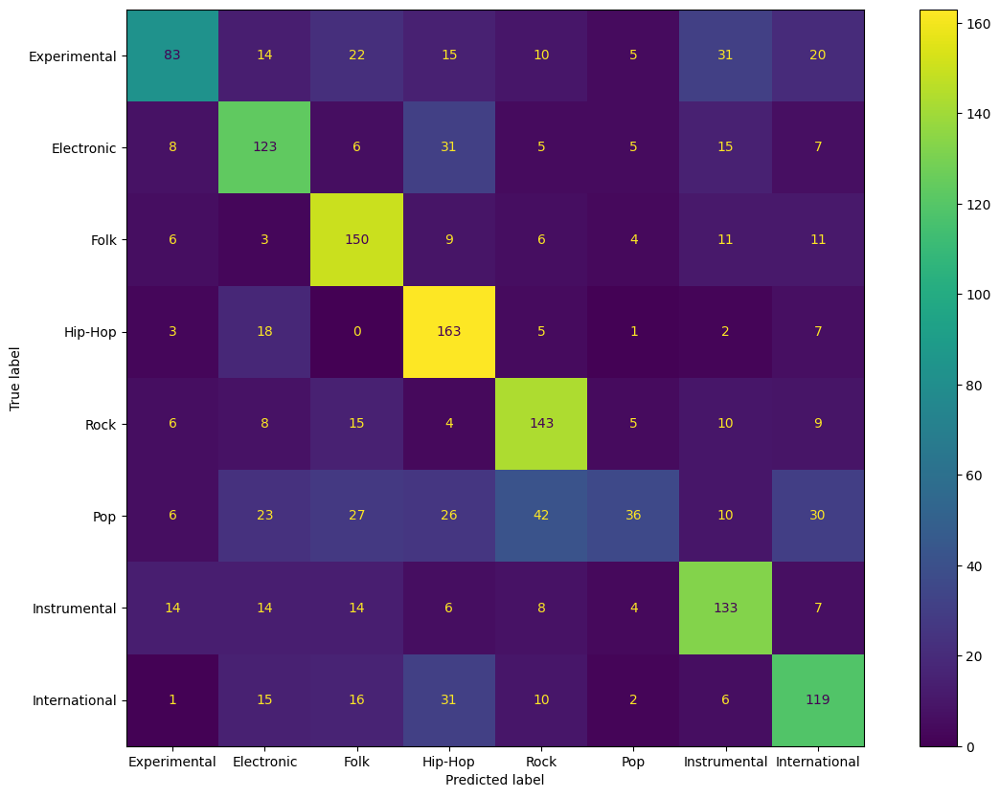

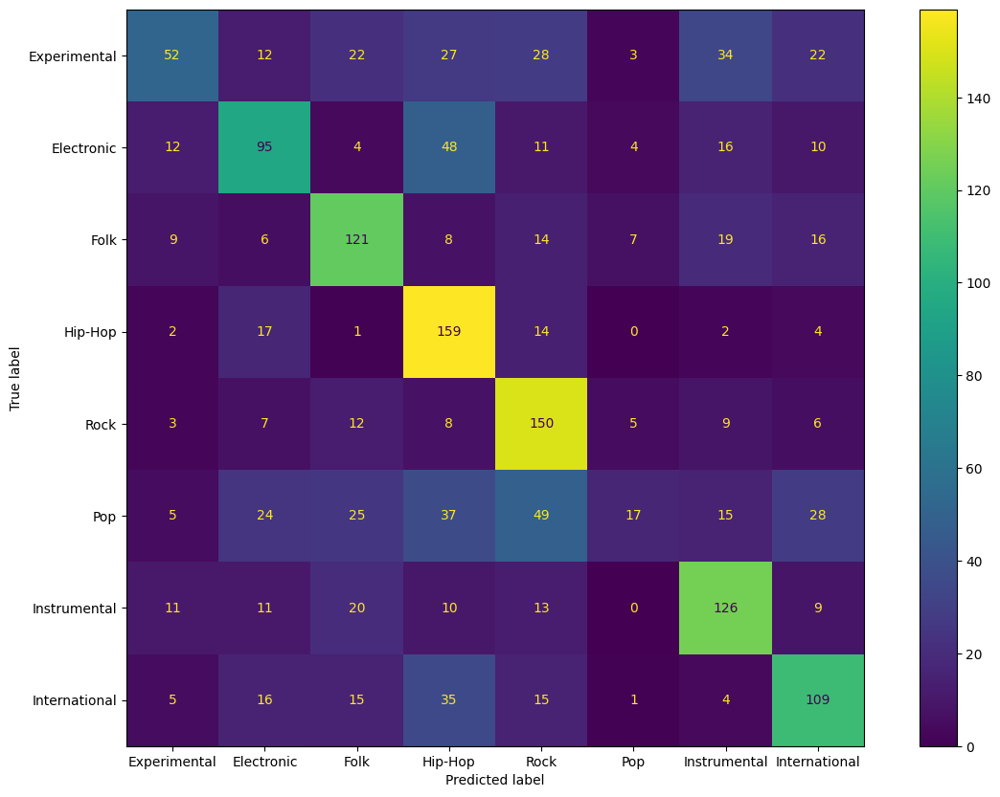

In [ ]:
for norm in [False, True]:
    log(f"-"*50)
    norm_text = "normalized" if norm else "original"
    log(f"Training model for feature: ALL_{norm_text}")

    X_train_all, y_train_all, X_test_all, y_test_all = get_dataset_all(train_df, test_df, val_df, ['mfcc', 'chroma', 'spectral', 'tempo', 'stft'], norm)

    model = DetachEnsemble(model_type='pytorch_minirocket', num_models=15, num_kernels=1000)
    detach_report[f'all_{norm_text}'] = fit_and_evaluate(X_train_all, y_train_all, X_test_all, y_test_all, model)

In [ ]:
# save detach_report
detach_report_df = pd.DataFrame(detach_report)
detach_report_df.to_pickle('detach_report2.pkl')

# Comparison Results

In [3]:
cnn_report_df = pd.read_pickle('cnn_report.pkl')
crnn_report_df = pd.read_pickle('crnn_report.pkl')
time_inception_report_df = pd.read_pickle('time_inception_report.pkl')
detach_report_df = pd.read_pickle('detach_report.pkl')

cnn_report_df = cnn_report_df.add_prefix('CNN_')
crnn_report_df = crnn_report_df.add_prefix('CRNN_')
time_inception_report_df = time_inception_report_df.add_prefix('TIME_INCEPTION_')
detach_report_df = detach_report_df.add_prefix('DETACH_')

results_df = pd.concat([
    cnn_report_df,
    crnn_report_df,
    time_inception_report_df,
    detach_report_df
],  axis=1).transpose()
results_df

,Experimental,Electronic,Folk,Hip-Hop,Rock,Pop,Instrumental,International,accuracy,macro avg,weighted avg
CNN_mfcc_False,"{'precision': 0.25384615384615383, 'recall': 0...","{'precision': 0.4634146341463415, 'recall': 0....","{'precision': 0.5067567567567568, 'recall': 0....","{'precision': 0.38405797101449274, 'recall': 0...","{'precision': 0.5892857142857143, 'recall': 0....","{'precision': 0.43859649122807015, 'recall': 0...","{'precision': 0.53515625, 'recall': 0.68844221...","{'precision': 0.3929824561403509, 'recall': 0....",0.452158,"{'precision': 0.445512053427235, 'recall': 0.4...","{'precision': 0.4454559907652133, 'recall': 0...."
CNN_chroma_False,"{'precision': 0.22641509433962265, 'recall': 0...","{'precision': 0.3695652173913043, 'recall': 0....","{'precision': 0.37398373983739835, 'recall': 0...","{'precision': 0.48717948717948717, 'recall': 0...","{'precision': 0.3741935483870968, 'recall': 0....","{'precision': 0.40969162995594716, 'recall': 0...","{'precision': 0.4682274247491639, 'recall': 0....","{'precision': 0.3789954337899543, 'recall': 0....",0.389619,"{'precision': 0.3860314469537468, 'recall': 0....","{'precision': 0.385980042339741, 'recall': 0.3..."
CNN_spectral_False,"{'precision': 0.16666666666666666, 'recall': 0...","{'precision': 0.6153846153846154, 'recall': 0....","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.125, 'recall': 0.005, 'f1-scor...","{'precision': 0.125, 'recall': 0.005, 'f1-scor...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.12767336357744652, 'recall': 0...",0.135084,"{'precision': 0.14496558070359106, 'recall': 0...","{'precision': 0.1450562408541249, 'recall': 0...."
CNN_tempo_False,"{'precision': 0.14720812182741116, 'recall': 0...","{'precision': 0.13821138211382114, 'recall': 0...","{'precision': 0.125, 'recall': 0.085, 'f1-scor...","{'precision': 0.18791946308724833, 'recall': 0...","{'precision': 0.13584905660377358, 'recall': 0...","{'precision': 0.1951219512195122, 'recall': 0....","{'precision': 0.18072289156626506, 'recall': 0...","{'precision': 0.07692307692307693, 'recall': 0...",0.148843,"{'precision': 0.14836949291763857, 'recall': 0...","{'precision': 0.1483492593975331, 'recall': 0...."
CNN_stft_False,"{'precision': 0.26495726495726496, 'recall': 0...","{'precision': 0.37333333333333335, 'recall': 0...","{'precision': 0.43646408839779005, 'recall': 0...","{'precision': 0.47619047619047616, 'recall': 0...","{'precision': 0.43728813559322033, 'recall': 0...","{'precision': 0.3900709219858156, 'recall': 0....","{'precision': 0.5, 'recall': 0.572864321608040...","{'precision': 0.35714285714285715, 'recall': 0...",0.406504,"{'precision': 0.4044308847000947, 'recall': 0....","{'precision': 0.4043711166479997, 'recall': 0...."
CNN_mel_spectrogram_False,"{'precision': 0.18032786885245902, 'recall': 0...","{'precision': 0.39732142857142855, 'recall': 0...","{'precision': 0.4370860927152318, 'recall': 0....","{'precision': 0.3191489361702128, 'recall': 0....","{'precision': 0.45161290322580644, 'recall': 0...","{'precision': 0.34057971014492755, 'recall': 0...","{'precision': 0.4489051094890511, 'recall': 0....","{'precision': 0.2905027932960894, 'recall': 0....",0.361476,"{'precision': 0.35818560530815086, 'recall': 0...","{'precision': 0.35812887015856926, 'recall': 0..."
CNN_mfcc_True,"{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.22302158273381295, 'recall': 0...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.36193029490616624, 'recall': 0...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...","{'precision': 0.12341772151898735, 'recall': 0...","{'precision': 0.0, 'recall': 0.0, 'f1-score': ...",0.196373,"{'precision': 0.08854619989487081, 'recall': 0...","{'precision': 0.08852439156364873, 'recall': 0..."
CNN_chroma_True,"{'precision': 0.25874125874125875, 'recall': 0...","

<Axes: title={'center': 'F1 Score - Macro Average'}>

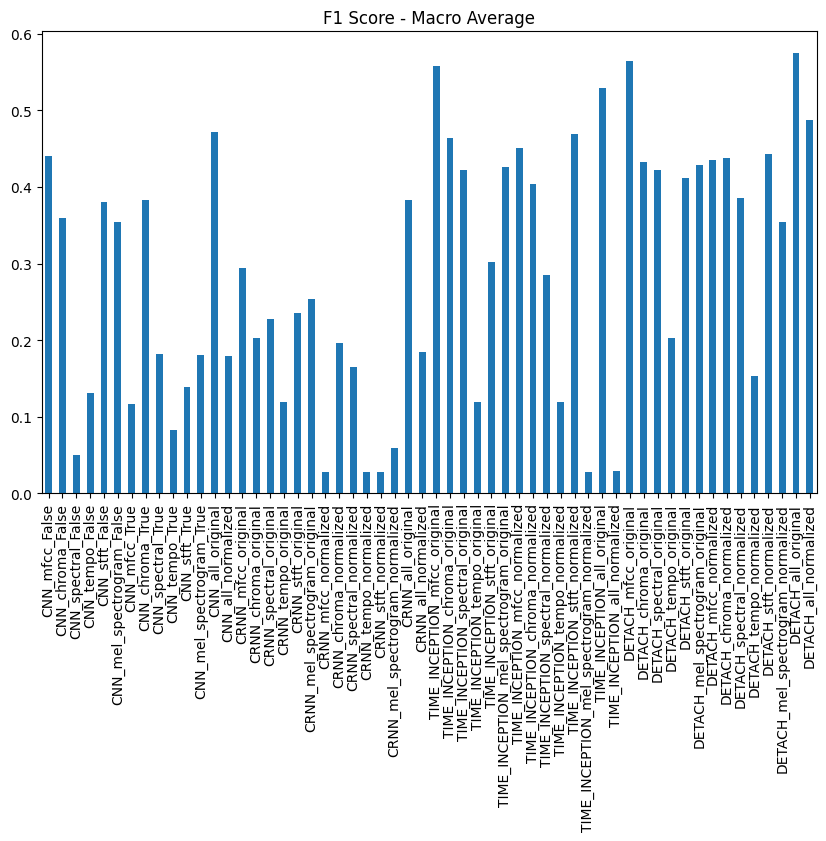

In [4]:
results_df.loc[:, 'macro avg'].apply(lambda x: x['f1-score']).plot(kind='bar', figsize=(10, 6), title='F1 Score - Macro Average')

In [5]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

# plot classification macro avg report for each model
# plot_df = pd.DataFrame(results_df.loc[:, 'macro avg'].apply(lambda x: x['f1-score']))
plot_df = pd.DataFrame(results_df.loc[:, 'accuracy'])
plot_df['model'] = plot_df.index.str.split('_').str[0]
plot_df['normalized'] = plot_df.index.str.split('_').str[-1]
plot_df['normalized'] = plot_df['normalized'].apply(lambda x: 'Normalized' if (x == 'True' or x == 'normalized') else 'Original')
plot_df

,accuracy,model,normalized
CNN_mfcc_False,0.452158,CNN,Original
CNN_chroma_False,0.389619,CNN,Original
CNN_spectral_False,0.135084,CNN,Original
CNN_tempo_False,0.148843,CNN,Original
CNN_stft_False,0.406504,CNN,Original
CNN_mel_spectrogram_False,0.361476,CNN,Original
CNN_mfcc_True,0.196373,CNN,Normalized
CNN_chroma_True,0.407755,CNN,Normalized
CNN_spectral_True,0.237023,CNN,Normalized
CNN_tempo_True,0.120075,CNN,Normalized


In [6]:

px.bar(plot_df, x=plot_df.index, y='accuracy', title='Accuracy Score', labels={'accuracy': 'Accuracy', 'index': 'Model'}, color='model')

In [9]:
# plot normalized vs original for each model
fig = make_subplots(rows=2, cols=2, subplot_titles=("CNN", "CRNN", "TIME_INCEPTION", "DETACH"))

for i, model in enumerate(['CNN', 'CRNN', 'TIME', 'DETACH']):
    df = plot_df[plot_df['model'] == model]
    df = df[df['normalized'] == 'Normalized']
    fig.add_trace(go.Bar(x=df.index, y=df['accuracy'], name=model, textposition='inside'), row=(i//2)+1, col=(i%2)+1)
    fig.update_yaxes(range=[0,.6])


fig.update_layout(height=800, width=1000, title_text="Accuracy Score - Normalized")

In [8]:
# plot normalized vs original for each model
fig = make_subplots(rows=2, cols=2, subplot_titles=("CNN", "CRNN", "TIME_INCEPTION", "DETACH"))

for i, model in enumerate(['CNN', 'CRNN', 'TIME', 'DETACH']):
    df = plot_df[plot_df['model'] == model]
    df = df[df['normalized'] != 'Normalized']
    fig.add_trace(go.Bar(x=df.index, y=df['accuracy'], name=model, textposition='inside'), row=(i//2)+1, col=(i%2)+1)
    fig.update_yaxes(range=[0,.6])


fig.update_layout(height=800, width=1000, title_text="Accuracy Score - Not Normalized")